# Exploratory Data Analysis

This is the third notebook in series that explores the GHCN Climate and UCDP Conflict data.


### Preliminary Hypothesis
The research questions raised in the previous notebook 02-rrp-data-wrangling can be reformulated into a preliminary hypothesis to guide our analysis:

**Areas that experience extremely high temperature and/or high precipitation levels also experience more intense conflict.**


### Goal of this Notebook

To begin to answer this question, in this notebook we will:
- explore the original variables in the dataset
- engineer a number of new features to aid our exploration
- look for spatial and temporal patterns in the two datasets
- define our target and response variables
- reformulate a final research question based on the quality of the available data


### Executive Summary

In this notebook, we first explore the variables of our two datasets (GHCN - climate, UCDP - conflict) in detail, investigating distributions, spatial patterns and temporal patterns. It then creates a number of new features to aid the EDA with respect to our main hypothesis: 2 features to measure conflict intensity (total_deaths and duration_days) and yearly means of climate measures for each station. 

After extensive exploration of global patterns in Section 5, we then decide to focus our analysis on a specific country as an initial case study to build the model. India is selected as the most suitable country and the relevant data is extracted, analyzed and mapped. A subset of 25 Indian weather stations is made; these stations include relevant climate measures for the years we are interested in. Conflict incidents in India are then linked in one dataframe with the nearest of these 25 stations.

Principal Components Analysis and Correlation analysis are conducted on the Indian conflict incidents to better understand the relationships between our features. Finally, our target feature is selected (deaths_civilians) and our predictor features defined. Main findings are summarized in Section 10. Section 11 sets out potential avenues for future research.


### Outline

This notebook is structured as follows:

**1. Importing the necessary libraries** 


**2. Exploring the original GHCN climate features** 
 - histograms
 - boxplots
 - summary & findings
 
 
**3. Exploring the original UCDP conflict features**
 - histograms
 - boxplots
 - summary & findings
 
 
**4. FeatureEengineering for EDA**
 - define aggregate variables for conflict data: total_death, duration_days
 - compute yearly means of climate measures per station
 
 
**5. Investigating Global Spatial and Temporal Patterns**
 - Global spatial patterns of conflict data
 - Global spatial patterns of climate data
 - Global spatial patterns in combined data
 - Global temporal patterns in combined data
 
*This section is primarily intended to guide future research and may be skipped as the project eventually focuses in on a specific country to build its first model.*

**6. Country Case Study**
 - Case selection
 - India: Conflict and Climate Patterns
 - India: Subset of Relevant Weather Stations
 - India: 
 
 
**7. Principal Components Analysis**


**8. Investigating Correlations between Features**


**9. Definition of features and response variable**
 - Creation of final dataframe
 - Definition of target and predictory features

**10. Summary & Key Findings**

**11. Avenues for Future Research**



## 1. Importing Libraries 

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale
from skimage.io import imread, imshow
from statsmodels.graphics.tsaplots import plot_acf
import geopandas as gpd
import descartes
from shapely.geometry import Point, Polygon 
from shapely.ops import nearest_points
from scipy.spatial import cKDTree
import contextily as ctx
import warnings
import datetime
import re
from tqdm.notebook import tqdm, trange
import time

In [2]:
# suppress user warnings from matplotlib
warnings.filterwarnings("ignore", category=UserWarning, module="matplotlib")

# 2. Exploring Original GHCN Variables

In this section and the next, we explore the original variables contained in our two datasets. We will start by looking at the features of the GHCN climate data: PRCP, TAVG, TMAX, and TMIN. Then we will proceed to look at some of the variables contained in the UCDP conflict data.

In [3]:
# import cleaned weather data
df_weather = pd.read_csv('/Users/richard/Desktop/data/processed/df_weather_50k_clean_1920onwards.csv', index_col=[0,1], parse_dates=[0])

In [4]:
df_weather.head()

PRCP   TAVG   TMAX   TMIN
DATE       STATION ID                             
1920-01-01 AGE00147704   90.0  140.0  170.0  110.0
           AGE00147705  102.0  155.0  190.0  120.0
           AGE00147706   45.0  130.0  160.0  100.0
           AGE00147710   61.0  130.0  170.0   90.0
           AGE00147711  150.0    NaN    NaN    NaN

In [5]:
df_weather.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 124180768 entries, (Timestamp('1920-01-01 00:00:00'), 'AGE00147704') to (Timestamp('2020-10-01 00:00:00'), 'WAM00068006')
Data columns (total 4 columns):
 #   Column  Dtype  
---  ------  -----  
 0   PRCP    float64
 1   TAVG    float64
 2   TMAX    float64
 3   TMIN    float64
dtypes: float64(4)
memory usage: 4.4+ GB


As a reminder, below are the **feature definitions** of the GHCN dataset, along with their units of measurement:

- PRCP - Daily Precipitation Level - measured in tenths of mm
- TAVG - Daily Average Temperature - measured in tenths of degrees centigrade
- TMAX - Daily Maximum Temperature - measured in tenths of degrees centigrade
- TMIN - Daily Minimum Temperature - measured in tenths of degrees centigrade

## 2.1 PRCP

Below we explore the distribution of PRCP, or the daily precipitation level, measured in tenths of mm (i.e. a value of 100 = 10mm/day)

### Relevant Domain Knowledge
For reference, we include [this official classification for rainfall](https://en.wikipedia.org/wiki/Rain#:~:text=Moderate%20rain%20%E2%80%94%20when%20the%20precipitation,mm%20(2.0%20in)%20per%20hour):
- Light rain: < 2.5mm per hour
- Moderate rain: 2.5-10mm per hour
- Heavy rain: 10-50mm per hour
- Violent rain: > 50mm per hour

The globally averaged annual precipitation over land in 2019 was 715 mm = 1.95mm/day.

## 2.1.1. Basic Summary

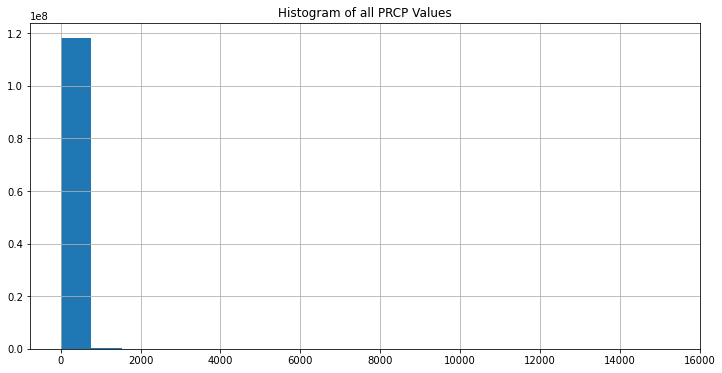

In [6]:
# plot a histogram of PRCP
df_weather.PRCP.hist(bins=20, figsize=(12,6))
plt.title('Histogram of all PRCP Values');

In [7]:
# print unique value counts
df_weather.PRCP.value_counts()

0.0       91192526
8.0         976509
3.0         926569
18.0        740525
10.0        693643
            ...   
3346.0           1
3347.0           1
3372.0           1
3375.0           1
1967.0           1
Name: PRCP, Length: 3919, dtype: int64

The variable PRCP has 3919 unique values. A large portion of these have the value 0.0. 

This distribution is highly skewed, with by far the majority of values located below 1000 and outliers up to 16000.

In [8]:
df_weather.PRCP.describe()

count    1.185189e+08
mean     2.706969e+01
std      1.006833e+02
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      1.524000e+04
Name: PRCP, dtype: float64

In [9]:
df_weather.PRCP.shape

(124180768,)

In [10]:
# count number and percentage of missing PRCP values
df_weather.PRCP.isnull().sum(), df_weather.PRCP.isnull().sum() / df_weather.PRCP.shape[0] * 100

(5661868, 4.55937589305294)

Because of the large number of zeroes *and* some outliers, the data is extremely skewed. The results of the describe() method confirm this. The IQR range is equal to 0, meaning at least 75% of the values are zero.

This is not necessarily a problem. Looking at the plot of the conflict regions in the previous notebook shows us that a lot of these are in warm climates and a lack of rain 75% of the time (3/4 seasons) is not unusual.

The outliers in this column have been dealt with in the previous notebook 02-rrp-data-wrangling. There, we decided to cap PRCP to a value below the world record for maximum daily precipitation. This means that the extremely high values still remaining in the data at this point will remain part of our analysis.

### 2.1.2. Subset Histograms

To get a better sense of the distribution of the data, below we plot a histograms and boxplots of subsets of PRCP for:
- values below 500 = 50.0mm/day, i.e. 1 hour of violent rain.
- values between 0 and 500 

The latter allows us to look at the data without the extreme skew introduced by the large number of zero-values.

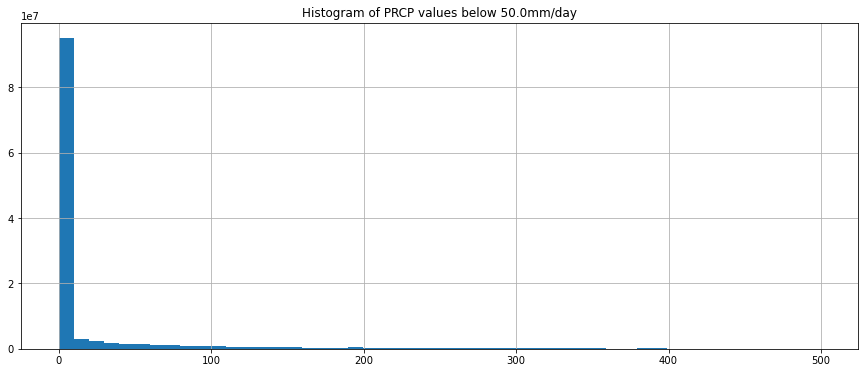

In [11]:
# plot a histogram of PRCP for values below 500
df_weather['PRCP'][df_weather.PRCP < 500].hist(bins=50, figsize=(15,6))
plt.title('Histogram of PRCP values below 50.0mm/day');

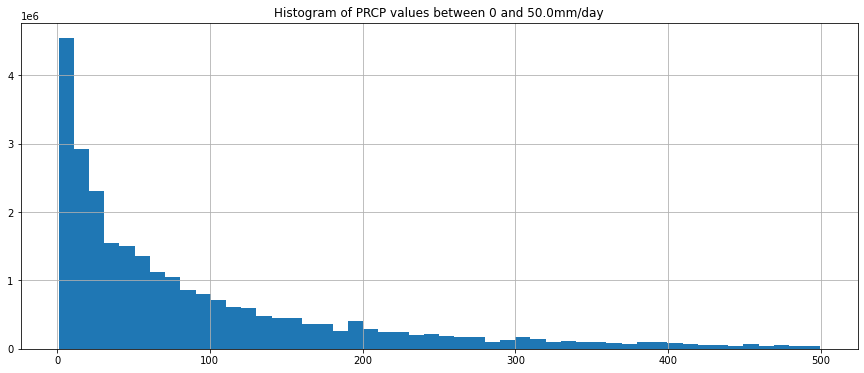

In [12]:
# plot a histogram of non-zero PRCP for values below 500
df_weather['PRCP'][(df_weather.PRCP > 0) & (df_weather.PRCP < 500)].hist(bins=50, figsize=(15,6))
plt.title('Histogram of PRCP values between 0 and 50.0mm/day');

In [13]:
# get count of PRCP values between 0 and 500
df_weather['PRCP'][(df_weather.PRCP > 0) & (df_weather.PRCP < 500)].count()

26322666

In [14]:
# get percentage
(df_weather['PRCP'][(df_weather.PRCP > 0) & (df_weather.PRCP < 500)].count()) / (df_weather['PRCP'].count()) * 100

22.2096779500991

In [15]:
# get count of PRCP values = 0
df_weather['PRCP'][df_weather.PRCP == 0].count()

91192526

In [16]:
# get percentage
df_weather['PRCP'][df_weather.PRCP == 0].count() / (df_weather['PRCP'].count()) * 100

76.9434461507827

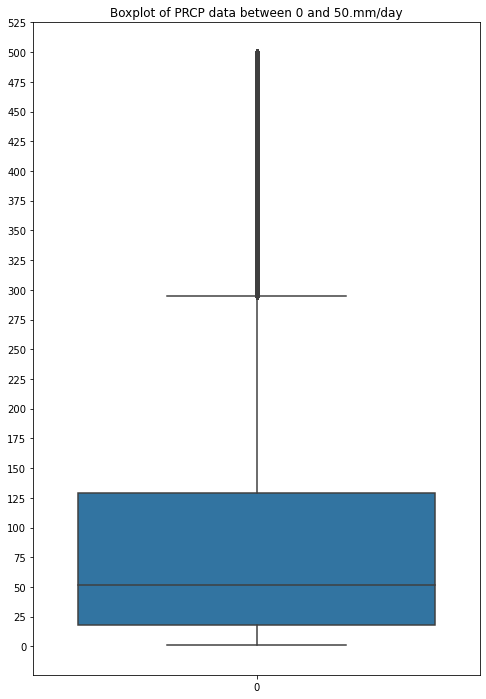

In [17]:
# boxplot
fig, ax = plt.subplots(figsize=[8,12])

sns.boxplot(ax=ax, 
            data=df_weather['PRCP'][(df_weather.PRCP > 0) & (df_weather.PRCP < 500)])

plt.title('Boxplot of PRCP data between 0 and 50.mm/day')
plt.yticks(np.arange(0, 550, step=25));

Almost 77% of the PRCP values are 0. A remaining 22% of PRCP values range between 0 and 500 (=50mm/day). This leaves only 1% outside the range we are currently looking at.

The mean precipitation level on days that it rained (i.e. PRCP>0) but rained less than 50mm/day is ~50 = 5mm/day.

### 2.1.3. Log-Transform of PRCP

Considering the skewness of this feature, let's see if we can get some useful information out of a log-transformation.

In [18]:
# subset PRCP for values below 500 and add constant to deal with zero values
PRCP_below500 = df_weather['PRCP'][df_weather['PRCP'] < 500] + 1
PRCP_below500

DATE        STATION ID 
1920-01-01  AGE00147704     91.0
            AGE00147705    103.0
            AGE00147706     46.0
            AGE00147710     62.0
            AGE00147711    151.0
                           ...  
2020-10-01  UV000005507     42.0
            UV000005522     42.0
            UVM00065503     90.0
            UVM00065518    260.0
            VMM00048917     44.0
Name: PRCP, Length: 117515192, dtype: float64

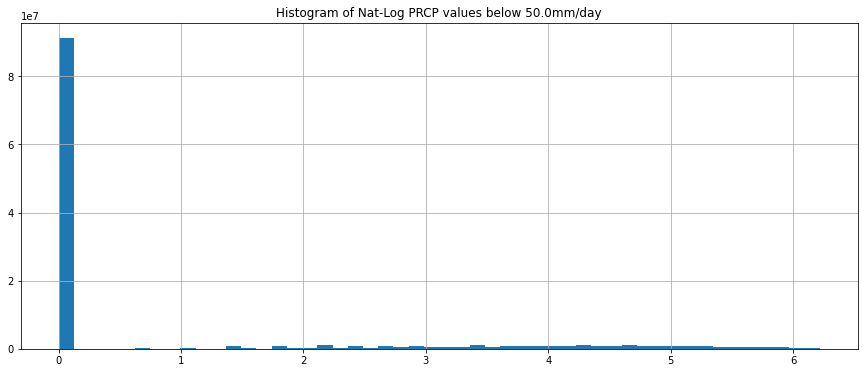

In [19]:
# plot a histogram of natural log-transformed PRCP for values below 500
np.log(PRCP_below500).hist(bins=50, figsize=(15,6))
plt.title('Histogram of Nat-Log PRCP values below 50.0mm/day');

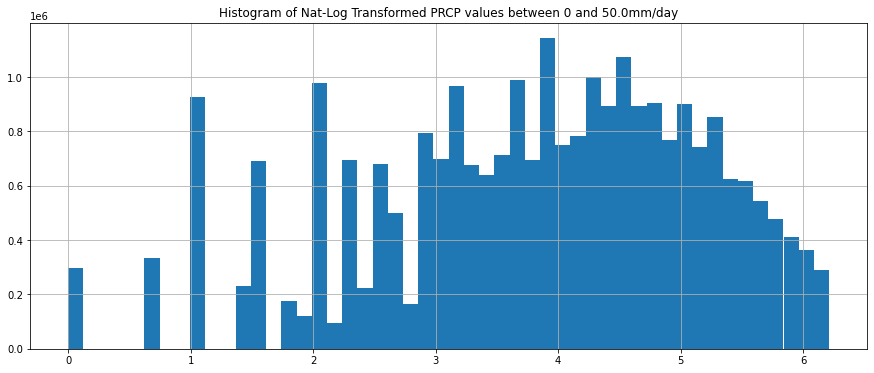

In [20]:
# plot a histogram of natural log-transformed PRCP for values between 0 and 500
PRCP_0_500 = df_weather['PRCP'][(df_weather.PRCP > 0) & (df_weather.PRCP < 500)]

np.log(PRCP_0_500).hist(bins=50, figsize=(15,6))
plt.title('Histogram of Nat-Log Transformed PRCP values between 0 and 50.0mm/day');

A histogram of the natural-log transformation including zero values does not yield much additional information. Excluding the zero values, however, shows a more interesting trend: an approximation of a normal curve can be distinguished.

This may give us ground to use the log of PRCP in our model at a later stage.

### PRCP Findings

- The average daily precipitation in areas of conflict (0.0mm/day) is less than the global average (1.95mm/day).
- Almost 77% of the recorded PRCP levels in areas of conflict is 0.
- 99% of the recorded PRCP levels in areas of conflict are below 50.0mmday.
- PRCP is approximately log-distributed, which may give us ground to use log-PRCP as a feature in our modelling.

## 2.2 TAVG

TAVG measures the average daily temperature, recorded in tenth of degrees Centigrade, i.e. -400 = -40.0C.

In the previous notebook 02-rrp-data-wrangling, extreme outliers have already been removed from this column. These were values that exceeded or came close to the world record for highest and lowest temperatures.

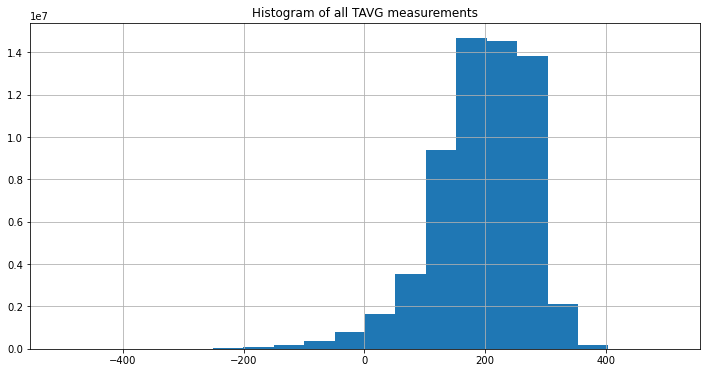

In [21]:
# plot a histogram of TAVG
df_weather.TAVG.hist(bins=20, figsize=(12,6))
plt.title('Histogram of all TAVG measurements');

The histogram reveals a far less skewed distribution than PRCP, with a mean somewhere around 20C.
The distribution is nonetheless skewed, to the left this time.

In [22]:
# print unique value counts
df_weather.TAVG.value_counts()

 203.0    869652
 178.0    865453
 228.0    780008
 253.0    772897
 153.0    755940
           ...  
-429.0         1
-468.0         1
 427.5         1
-338.5         1
-482.0         1
Name: TAVG, Length: 1663, dtype: int64

In [23]:
df_weather.TAVG.describe()

count    6.125972e+07
mean     1.938857e+02
std      7.966577e+01
min     -5.030000e+02
25%      1.480000e+02
50%      2.025000e+02
75%      2.535000e+02
max      5.050000e+02
Name: TAVG, dtype: float64

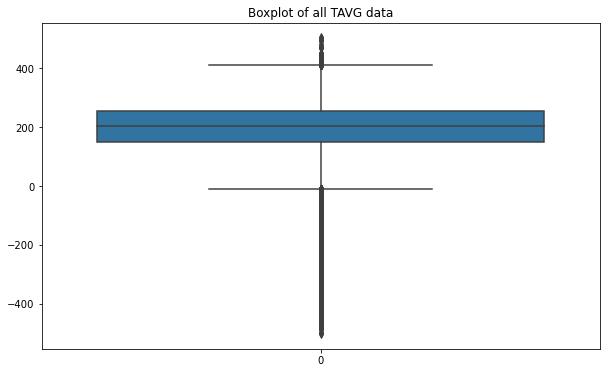

In [24]:
# plot boxplot of all TAVG values

fig, ax = plt.subplots(figsize=[10,6])

sns.boxplot(ax=ax, 
            data=df_weather.TAVG)

plt.title('Boxplot of all TAVG data');

In [25]:
# count number and percentage of missing TAVG values
df_weather.TAVG.isnull().sum(), df_weather.TAVG.isnull().sum() / df_weather.TAVG.shape[0] * 100

(62921050, 50.66891678428016)

The results of the describe() method and the boxplot confirm what we saw in the histogram. 

The distribution has:
- a mean of 19.4C
- an IQR between 14.8C and 25.4C

A mean of 19.3 for year-round temperature seems quite high and could be a first indication that conflicts in the last thirty years have happened mostly in warmer climates. We would need to compare this value to the total TAVG mean to be sure. 

According to [this resource](https://www.space.com/17816-earth-temperature.html) the average global daily temperature in 2017 was ~14.9C, possibly confirming our intuition.


### TAVG Findings

- The mean TAVG for stations within 50km of conflict incidents over the past 100 years is 19.4C
- This is higher than the global average daily temperature in 2017, which is 14.9C
- There column contains outliers with temperatures up to 50.5C and down to -50.3C.
- ~50% of the stations in the dataset do not have values for TAVG. These could potentially be imputed from TMIN and TMAX if there is reason to do so.

## 2.3 TMIN

TMIN measures the daily minimum temperature, recorded in tenth of degrees Centigrade, i.e. -400 = -40.0C.

In the previous notebook 02-rrp-data-wrangling, extreme outliers have already been removed from this column. These were values that exceeded or came close to the world record for highest and lowest temperatures.

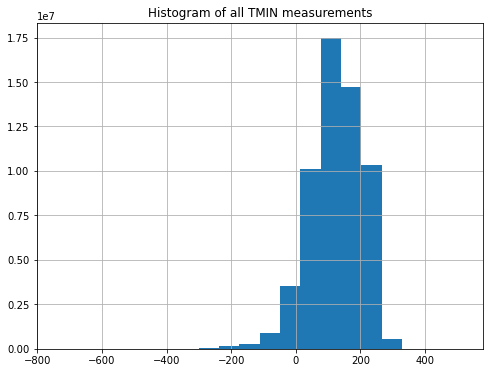

In [26]:
# plot a histogram of TMIN
df_weather.TMIN.hist(bins=20, figsize=(8,6))
plt.title('Histogram of all TMIN measurements');

The histogram reveals a distribution similar to that of TAVG, but shifted in its entirety to the left. This is logical since the data represents the minumum temperature on each day. The mean seems to be around 12C.

In [27]:
df_weather.TMIN.describe()

count    5.812383e+07
mean     1.241104e+02
std      8.111035e+01
min     -7.400000e+02
25%      7.200000e+01
50%      1.280000e+02
75%      1.890000e+02
max      5.170000e+02
Name: TMIN, dtype: float64

In [28]:
# count number and percentage of missing TMIN values
df_weather.TMIN.isnull().sum(), df_weather.TMIN.isnull().sum() / df_weather.TMIN.shape[0] * 100

(66056939, 53.194178183855335)

The describe() method tells us that the mean of the TMIN data is indeed at 12.41. The IQR, clearly visible in the boxplot, ranges from 7.2 to 18.9C. Again, 18.9 seems a rather high value for the minimum temperature in a given 24-hour period.


### TMIN Findings

- The mean TAVG for stations within 50km of conflict incidents over the past 100 years is 18.9C
- The column contains outliers with temperatures up to 51.7C and down to -74.0C.
- more than 53% of the stations in the dataset do not have values for TAVG. 

## 2.4 TMAX

TMAX measures the daily minimum temperature, recorded in tenth of degrees Centigrade, i.e. -400 = -40.0C.

In the previous notebook 02-rrp-data-wrangling, extreme outliers have already been removed from this column. These were values that exceeded or came close to the world record for highest and lowest temperatures.

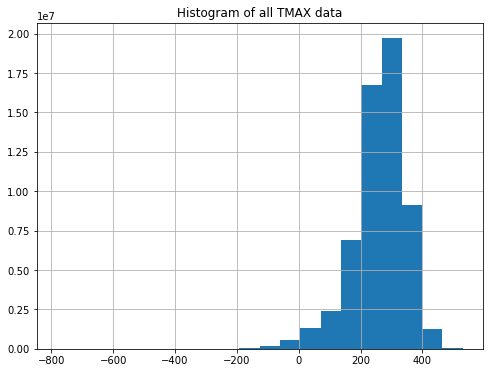

In [29]:
# plot a histogram of TMAX
df_weather.TMAX.hist(bins=20, figsize=(8,6))
plt.title('Histogram of all TMAX data');

The histogram shows us a similar distribution as TAVG and TMIN, but shifted to the right. The mean seems to be around 28C.

In [30]:
df_weather.TMAX.describe()

count    5.833552e+07
mean     2.612754e+02
std      8.573080e+01
min     -7.820000e+02
25%      2.170000e+02
50%      2.730000e+02
75%      3.170000e+02
max      5.300000e+02
Name: TMAX, dtype: float64

In [31]:
# count number and percentage of missing TMAX values
df_weather.TMAX.isnull().sum(), df_weather.TMAX.isnull().sum() / df_weather.TMAX.shape[0] * 100

(65845250, 53.023709758341965)

### TMAX Findings

- the mean of the TMAX data is 26.1C. 
- the IQR ranges from 21.7 to 31.7C. 
- Note the outliers of -78.2C and 53.0C as maximum temperatures. 
- more than 53% of stations do not have data for TMIN.


## 2.5. Summary & Findings

The main findings after exploring the original GHCN variables are:
- Overall Precipitation levels recorded at stations near conflict incidents is below global average for 2019
- Overall Temperature levels recorded at stations near conflict incidents is above global average for 2019
- Temperature features have significant amounts of missing values >50%.

This indicates that conflicts, on the whole, take place in warmer and drier parts of the world.

# 3. Exploring Original UCDP Variables

In this section we will explore a selection of the variables of the UCDP conflict dataset:
- Conflict ID & name
- Country ID & name
- Region
- Starting and ending dates 
- Variables measuring number of deaths (side_a, side_b, civilian and unknown)


## 3.1 Importing Data and Adjusting Columns

In [11]:
# import UCDP conflict dataset, parsing date columns
df_conflict = pd.read_csv('/Users/richard/Desktop/data/interim/df_conflict_clean_old.csv', 
                          index_col=0, 
                          parse_dates=['date_start', 'date_end']
)

In [33]:
df_conflict.T

id,244657,132140,130364,130359,133883,133874,133878,133888,133891,133892,...,276728,276737,276732,326380,276740,326022,325975,15525,15245,15493
year,2017,1989,1989,1989,1989,1989,1989,1989,1989,1989,...,2019,2019,2019,2019,2019,2019,2019,1989,1990,1990
active_year,1,1,1,1,1,1,1,1,1,1,...,0,0,0,0,0,0,0,1,1,1
type_of_violence,1,1,1,1,1,1,1,1,1,1,...,3,3,3,3,3,3,3,3,3,3
conflict_new_id,259,333,333,333,333,333,333,333,333,333,...,476,476,476,476,476,476,476,562,562,562
conflict_name,Iraq: Government,Afghanistan: Government,Afghanistan: Government,Afghanistan: Government,Afghanistan: Government,Afghanistan: Government,Afghanistan: Government,Afghanistan: Government,Afghanistan: Government,Afghanistan: Government,...,Government of Zimbabwe (Rhodesia) - Civilians,Government of Zimbabwe (Rhodesia) - Civilians,Government of Zimbabwe (Rhodesia) - Civilians,Government of Zimbabwe (Rhodesia) - Civilians,Government of Zimbabwe (Rhodesia) - Civilians,Government of Zimbabwe (Rhodesia) - Civilians,Government of Zimbabwe (Rhodesia) - Civilians,Renamo - Civilians,Renamo - Civilians,Renamo - Civilians
dyad_new_id,524,724,724,724,724,724,724,724,724,724,...,943,943,943,943,943,943,943,1029,1029,1029
dyad_name,Government of Iraq - IS,Government of Afghanistan - Jam'iyyat-i Islami...,Government of Afghanistan - Jam'iyyat-i Islami...,Government of Afghanistan - Jam'iyyat-i Islami...,Government of Afghanistan - Jam'iyyat-i Islami...,Government of Afghanistan - Jam'iyyat-i Islami...,Government of Afghanistan - Jam'iyyat-i Islami...,Government of Afghanistan - Jam'iyyat-i Islami...,Government of Afghanistan - Jam'iyyat-i Islami...,Government of Afghanistan - Jam'iyyat-i Islami...,...,Government of Zimbabwe (Rhodesia) - Civilians,Government of Zimbabwe (Rhodesia) - Civilians,Government of Zimbabwe (Rhodesia) - Civilians,Government of Zimbabwe (Rhodesia) - Civilians,Government of Zimbabwe (Rhodesia) - Civilians,Government of Zimbabwe (Rhodesia) - Civilians,Government of Zimbabwe (Rhodesia) - Civilians,Renamo - Civilians,Renamo - Civilians,Renamo - Civilians
side_a_new_id,116,130,130,130,130,130,130,130,130,130,...,101,101,101,101,101,101,101,498,498,498
side_a,Government of Iraq,Government of Afghanistan,Government of Afghanistan,Government of Afghanistan,Government of Afghanistan,Government of Afghanistan,Government of Afghanistan,Government of Afghanistan,Government of Afghanistan,Government of Afghanistan,...,Government of Zimbabwe (Rhodesia),Government of Zimbabwe (Rhodesia),Government of Zimbabwe (Rhodesia),Government of Zimbabwe (Rhodesia),Government of Zimbabwe (Rhodesia),Government of Zimbabwe (Rhodesia),Government of Zimbabwe (Rhodesia),Renamo,Renamo,Renamo
side_b_new_id,234,292,292,292,292,292,292,292,292,292,...,1,1,1,1,1,1,1,1,1,1


In [34]:
# verify datatypes
df_conflict.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 211879 entries, 244657 to 15493
Data columns (total 29 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   year               211879 non-null  int64         
 1   active_year        211879 non-null  int64         
 2   type_of_violence   211879 non-null  int64         
 3   conflict_new_id    211879 non-null  int64         
 4   conflict_name      211879 non-null  object        
 5   dyad_new_id        211879 non-null  int64         
 6   dyad_name          211879 non-null  object        
 7   side_a_new_id      211879 non-null  int64         
 8   side_a             211879 non-null  object        
 9   side_b_new_id      211879 non-null  int64         
 10  side_b             211879 non-null  object        
 11  where_prec         211879 non-null  int64         
 12  where_coordinates  211879 non-null  object        
 13  where_description  208590 non-null  obje

In [35]:
# change formatting of datetime columns to Y-M-D only
df_conflict['date_start'] = pd.to_datetime(df_conflict["date_start"].dt.strftime('%Y-%m-%d'))
df_conflict['date_end'] = pd.to_datetime(df_conflict["date_end"].dt.strftime('%Y-%m-%d'))

df_conflict[['date_start', 'date_end']].head()

,date_start,date_end
id,,
244657,2017-07-31,2017-07-31
132140,1989-01-07,1989-01-13
130364,1989-01-15,1989-01-18
130359,1989-01-23,1989-01-24
133883,1989-01-30,1989-02-05


In [36]:
df_conflict.columns

Index(['year', 'active_year', 'type_of_violence', 'conflict_new_id',
       'conflict_name', 'dyad_new_id', 'dyad_name', 'side_a_new_id', 'side_a',
       'side_b_new_id', 'side_b', 'where_prec', 'where_coordinates',
       'where_description', 'adm_1', 'adm_2', 'latitude', 'longitude',
       'country', 'country_id', 'region', 'event_clarity', 'date_prec',
       'date_start', 'date_end', 'deaths_a', 'deaths_b', 'deaths_civilians',
       'deaths_unknown'],
      dtype='object')

There are some column names here that can be changed for increased clarity. Let's do that before moving on.

In [37]:
# removing 'new' from 4 columns names since 'old' versions of these variables were already removed in the wrangling notebook
df_conflict.rename(columns={
    'conflict_new_id': 'conflict_id',
    'dyad_new_id': 'dyad_id',
    'side_a_new_id': 'side_a_id',
    'side_b_new_id': 'side_b_id',
}, inplace=True)

And we can drop the 'active_year' column as it is contains administrative information that is not relevant to our anaylsis.

In [38]:
df_conflict.drop(columns='active_year', inplace=True)

In [39]:
df_conflict.columns

Index(['year', 'type_of_violence', 'conflict_id', 'conflict_name', 'dyad_id',
       'dyad_name', 'side_a_id', 'side_a', 'side_b_id', 'side_b', 'where_prec',
       'where_coordinates', 'where_description', 'adm_1', 'adm_2', 'latitude',
       'longitude', 'country', 'country_id', 'region', 'event_clarity',
       'date_prec', 'date_start', 'date_end', 'deaths_a', 'deaths_b',
       'deaths_civilians', 'deaths_unknown'],
      dtype='object')

In [40]:
# # export cleaned df to local csv
# df_conflict.to_csv('/Users/richard/Desktop/data/processed/df_conflict_clean.csv', index=False)

## 3.2 Conflict Incidents per Conflict ID

Proceeding, let's inspect the two features that identify the overarching conflict that each conflict incident (single record) belongs to.

### 3.2.1. conflict_id

The conflict_id variable records the overarching conflict that a specific incident is ascribed to. **It is different from the 'id' variable** which is the index of our dataframe df_conflict. Conflict *incidents* each have a unique *id*. Multiple conflict incidents will belong to the same *conflict_id* when they are part of the same overarching conflict, e.g. 'Syria: Government' or 'Turkey: Kurdistan'.

Here, we are looking at the distribution of *conflict_id* in order to get a sense of the amount of conflict incidents that belong to each conflict_id.

In [41]:
# get unique value counts
df_conflict['conflict_id'].value_counts()

299      44210
333      29326
364       5840
259       5559
354       4502
         ...  
11736        1
14937        1
4756         1
4956         1
4508         1
Name: conflict_id, Length: 1207, dtype: int64

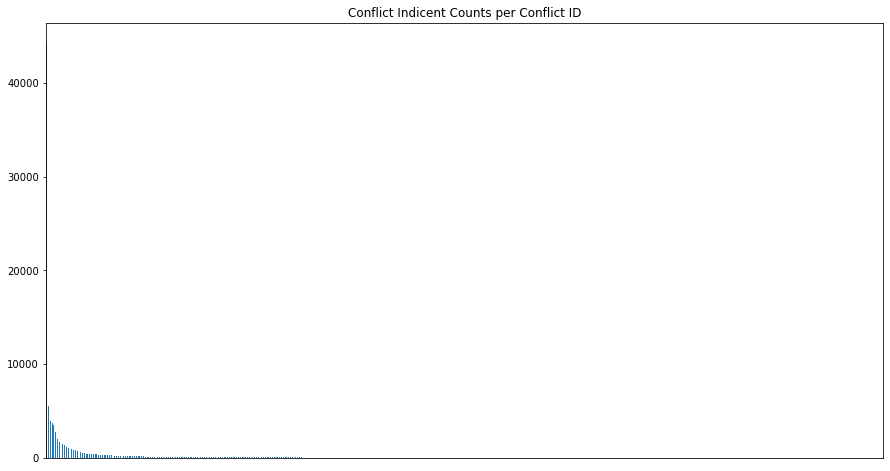

In [42]:
# create a barplot of counts per id
fig, ax = plt.subplots(figsize=[15,8])

df_conflict['conflict_id'].value_counts().plot(ax=ax,
                                               kind='bar',
                                               title="Conflict Indicent Counts per Conflict ID")

plt.tick_params(
    axis='x',          
    which='both',      
    bottom=False,      
    top=False,         
    labelbottom=False);

### Conflict_ID Findings

- There are 1207 unique conflict IDs
- The top two conflict IDs tower above the rest in terms of conflict incident counts, let's inspect which two conflicts that are
- There are also many conflict IDs with < 100 conflict incidents each.

### 3.2.2. conflict_name

The conflict_name variable records the name corresponding to each unique conflict_id. Let's create a lookup table that we can use to cross-reference these two, and then drop this variable from our dataframe.

This variable will allow us to see what the top 2 conflicts (in terms of conflict incidents count) are.

In [43]:
# get unique value counts
df_conflict.conflict_name.value_counts()

Syria: Government                          44210
Afghanistan: Government                    29326
India: Kashmir                              5840
Iraq: Government                            5559
Turkey: Kurdistan                           4502
                                           ...  
Kwala - Tiv                                    1
Nyangatom , Toposa - Turkana                   1
Abugbe (Agatu) - Agbaduma (Agatu)              1
Wanhihem community - Wanikade community        1
MDA - MDA - LM                                 1
Name: conflict_name, Length: 1206, dtype: int64

**NOTE:** There are 1206 unique conflict names as opposed to 1207 unique conflict IDs. This means 1 conflict name is either missing or duplicated. Let's resolve this before continuing.

In [44]:
# create lookup table 
conflicts_lookup = df_conflict[['conflict_id', 'conflict_name']].drop_duplicates()
conflicts_lookup.reset_index(drop=True)

,conflict_id,conflict_name
0,259,Iraq: Government
1,333,Afghanistan: Government
2,364,India: Kashmir
3,395,Tajikistan: Government
4,404,Pakistan: Government
...,...,...
1202,13587,AQAP - Forces of Hadi
1203,13645,Yemen (North Yemen): Islamic State
1204,13597,IS - Forces of Hadi
1205,14512,AQAP - IS


In [45]:
# find missing name
conflicts_lookup.conflict_name.isnull().sum()

0

In [46]:
# find duplicate name
conflicts_lookup.conflict_name[conflicts_lookup.conflict_name.duplicated(keep=False)]

id
39494     FPR - Civilians
255861    FPR - Civilians
Name: conflict_name, dtype: object

In [47]:
df_conflict[(df_conflict.conflict_name == 'FPR - Civilians')]

,year,type_of_violence,conflict_id,conflict_name,dyad_id,dyad_name,side_a_id,side_a,side_b_id,side_b,...,country_id,region,event_clarity,date_prec,date_start,date_end,deaths_a,deaths_b,deaths_civilians,deaths_unknown
id,,,,,,,,,,,,,,,,,,,,,
39494,1994,3,568,FPR - Civilians,1035,FPR - Civilians,527,FPR,1,Civilians,...,516,Africa,1,1,1994-05-11,1994-05-11,0,0,0,0
255861,2012,3,4219,FPR - Civilians,4824,FPR - Civilians,3554,FPR,1,Civilians,...,482,Africa,2,4,2012-02-19,2012-03-18,0,0,5,0
162773,2012,3,4219,FPR - Civilians,4824,FPR - Civilians,3554,FPR,1,Civilians,...,482,Africa,1,4,2012-11-01,2012-11-24,0,0,3,0
162772,2012,3,4219,FPR - Civilians,4824,FPR - Civilians,3554,FPR,1,Civilians,...,482,Africa,1,1,2012-11-11,2012-11-11,0,0,1,0
149529,2014,3,4219,FPR - Civilians,4824,FPR - Civilians,3554,FPR,1,Civilians,...,482,Africa,1,1,2014-02-05,2014-02-05,0,0,22,0
158827,2014,3,4219,FPR - Civilians,4824,FPR - Civilians,3554,FPR,1,Civilians,...,482,Africa,1,1,2014-02-10,2014-02-10,0,0,27,0
149534,2014,3,4219,FPR - Civilians,4824,FPR - Civilians,3554,FPR,1,Civilians,...,482,Africa,1,1,2014-02-13,2014-02-13,0,0,14,0
149537,2014,3,4219,FPR - Civilians,4824,FPR - Civilians,3554,FPR,1,Civilians,...,482,Africa,1,1,2014-02-14,2014-02-14,0,0,2,0
262141,2014,3,4219,FPR - Civilians,4824,FPR - Civilians,3554,FPR,1,Civilians,...,482,Africa,1,1,2014-02-14,2014-02-14,0,0,7,0


There is a duplicate name "FPR - Civilians". Looking at the records, it seems that this conflict occurred in two time periods: the mid 90s and mid 2010s. 

Since this conflict only has a total of 58 records, we will most likely not be including it in our analysis. As such, let's leave the duplicate name as is.

In [48]:
# # export lookup table
# conflicts_lookup.to_csv('/Users/richard/Desktop/data/processed/conflict_id_name_lookup.csv')

In [49]:
# delete conflict_name from df_conflict
df_conflict = df_conflict.drop('conflict_name', axis=1)
df_conflict.columns

Index(['year', 'type_of_violence', 'conflict_id', 'dyad_id', 'dyad_name',
       'side_a_id', 'side_a', 'side_b_id', 'side_b', 'where_prec',
       'where_coordinates', 'where_description', 'adm_1', 'adm_2', 'latitude',
       'longitude', 'country', 'country_id', 'region', 'event_clarity',
       'date_prec', 'date_start', 'date_end', 'deaths_a', 'deaths_b',
       'deaths_civilians', 'deaths_unknown'],
      dtype='object')

### Conflict_name Findings

- The top two conflicts in terms of conflict incidents count are Syria and Afghanistan, with 44k+ and 29k+ incidents respectively
- India, Iraq and Turkey are next, ranging between 4500 and 5800 incidents.
- At the bottom, we have smaller conflicts that are harder to identify by name.
- We have removed conflict_name from our dataset and retained the information in a separate lookup table.

## 3.3 Conflict Incidents per Country

To get a deeper sense of the geographical distribution of conflict incidents, let's look at the value counts per Country_ID and Country names. Just as with conflict_id and conflict_name above, we will create a lookup table and drop the variable containing the country names from our main df_conflict dataframe.

### 3.3.1. Country_ID

In [50]:
# get unique value counts
df_conflict.country_id.value_counts()

652    57697
700    32561
750    15090
645     7211
770     5685
       ...  
571        1
696        1
760        1
694        1
940        1
Name: country_id, Length: 121, dtype: int64

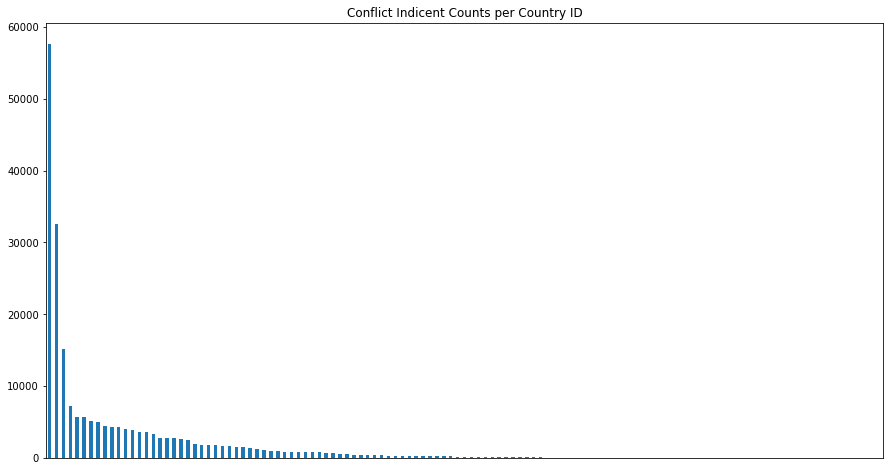

In [51]:
# create a barplot of counts per id
fig, ax = plt.subplots(figsize=[15,8])

df_conflict['country_id'].value_counts().plot(ax=ax,
                                              kind='bar',
                                              title="Conflict Indicent Counts per Country ID")

plt.tick_params(
    axis='x',          
    which='both',      
    bottom=False,      
    top=False,         
    labelbottom=False);

### 3.3.2. Country Names

In [52]:
# get unique value counts of country names
df_conflict.country.value_counts()

Syria                   57697
Afghanistan             32561
India                   15090
Iraq                     7211
Pakistan                 5685
                        ...  
Bhutan                      1
Qatar                       1
Botswana                    1
Sweden                      1
United Arab Emirates        1
Name: country, Length: 121, dtype: int64

The number of unique values for country is the same as that of country_id, indicating no missing or duplicate values.

In [335]:
# inspect head of counts per country
df_conflict.country.value_counts().head(15) 

Syria                    57697
Afghanistan              32561
India                    15090
Iraq                      7211
Pakistan                  5685
Nepal                     5651
Somalia                   5183
Turkey                    4932
Colombia                  4421
Nigeria                   4351
Sri Lanka                 4272
DR Congo (Zaire)          3976
Algeria                   3857
Russia (Soviet Union)     3657
Mexico                    3584
Name: country, dtype: int64

In [54]:
# inspect tail of counts per country
df_conflict.country.value_counts().tail(15) 

Guyana                             3
Panama                             3
Netherlands                        2
Australia                          2
Argentina                          2
Kingdom of eSwatini (Swaziland)    2
Paraguay                           1
Malta                              1
Solomon Islands                    1
Italy                              1
Bhutan                             1
Qatar                              1
Botswana                           1
Sweden                             1
United Arab Emirates               1
Name: country, dtype: int64

In [55]:
# get mean conflict count per country
df_conflict.country.value_counts().mean() 

1751.0661157024792

### Conflicts per Country Findings
- There is a significant concentration of conflict incidents in the top 3 countries: Syria, Afghanistan, and India
- The total number of conflicts in Syria (57697) exceeds those for the top Conflict_ID (44210), suggesting there are multiple conflicts taking place in Syria.
- The same goes for Afghanistan and India.
- The average conflict incident count per country is 1751

## 3.4 Conflict Incidents per Region

In [56]:
df_conflict.region.value_counts()

Middle East    77280
Asia           74129
Africa         41340
Americas       10701
Europe          8429
Name: region, dtype: int64

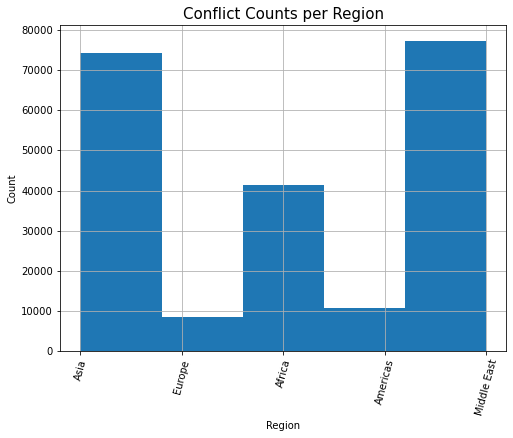

In [57]:
# plot histogram of region
df_conflict.region.hist(bins=5, xrot=75, figsize=(8,6))
plt.title('Conflict Counts per Region', fontsize=15)
plt.xlabel('Region')
plt.ylabel('Count');

### Region Findings
- the Middle East and Asia contain by far the largest number of conflict indicents, with each more than 70k incidents.
- Africa comes third with just over 40k incidents. 
- The Americas and Europe trail far behind with 10k and 8.5k incidents, respectively.

- In order to compare conflict and climate across regions, custom polygons will need to be created based on the Gleditsch&Ward Numbers.


## 3.5 date_start 

Having converted the date columns to datetime objects, let's inspect the distribution of conflict incidents over time:

In [58]:
df_conflict.date_start.min(), df_conflict.date_start.max()

(Timestamp('1989-01-01 00:00:00'), Timestamp('2019-12-31 00:00:00'))

In [59]:
# get unique value counts
df_conflict.date_start.value_counts()

1994-04-11    113
2013-08-04    109
2013-06-16    106
1994-04-07    103
2014-04-04    103
             ... 
1989-03-06      1
1995-12-07      1
1997-08-03      1
1989-07-25      1
1995-12-13      1
Name: date_start, Length: 11307, dtype: int64

In [60]:
# get average conflict incidents started per day
df_conflict.date_start.value_counts().mean()

18.738745909613513

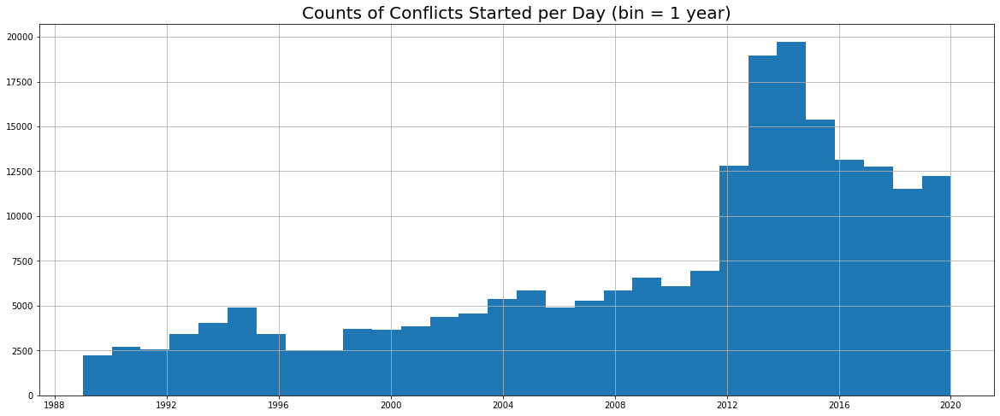

In [61]:
# plot histogram of dates
fig,ax = plt.subplots(figsize=[20,8])

df_conflict.date_start.hist(ax=ax, bins=30)

plt.title('Counts of Conflicts Started per Day (bin = 1 year)', fontsize=20);

## 3.6 date_end

In [62]:
df_conflict.date_end.min(), df_conflict.date_end.max()

(Timestamp('1989-01-01 00:00:00'), Timestamp('2019-12-31 00:00:00'))

In [63]:
# get unique value counts
df_conflict.date_end.value_counts()

1994-04-30    145
2013-08-04    109
2013-06-16    105
2013-01-17     96
2013-01-14     95
             ... 
1989-12-05      1
2001-09-14      1
1990-05-06      1
1998-07-10      1
1996-11-22      1
Name: date_end, Length: 11304, dtype: int64

In [64]:
# get average conflict incidents ended per day
df_conflict.date_end.value_counts().mean()

18.743719037508846

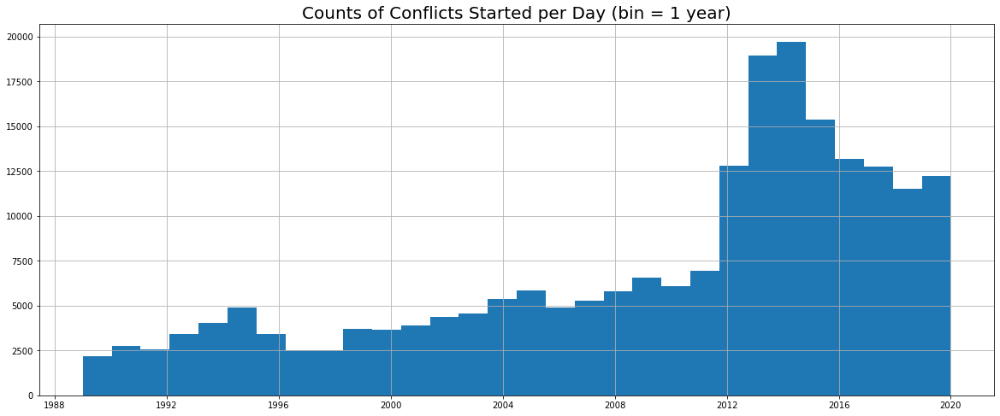

In [65]:
# plot histogram of dates
fig,ax = plt.subplots(figsize=[20,8])

df_conflict.date_end.hist(ax=ax, bins=30)

plt.title('Counts of Conflicts Started per Day (bin = 1 year)', fontsize=20);

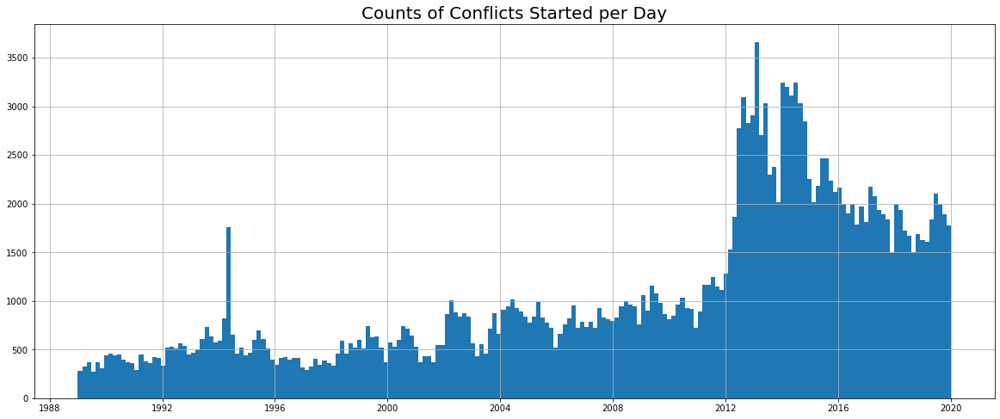

In [66]:
# plot histogram of dates with narrower bins
fig,ax = plt.subplots(figsize=[20,8])

df_conflict.date_end.hist(ax=ax, bins=200)

plt.title('Counts of Conflicts Started per Day', fontsize=20);

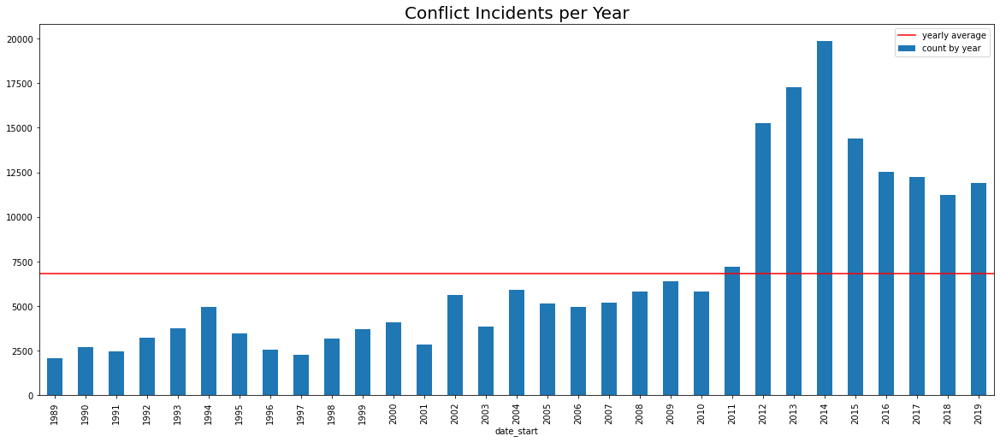

In [67]:
# group by year and plot
fig, ax = plt.subplots(figsize=[20,8])

df_conflict['date_start'].groupby(df_conflict.date_start.dt.year).count().plot(ax=ax,
                                                                               kind='bar',
                                                                               label='count by year')

# get mean of count by year
year_mean = df_conflict['date_start'].groupby(df_conflict.date_start.dt.year).agg('count').mean()

# plot horizontal line
plt.axhline(y= year_mean, color='red', label='yearly average')

plt.title('Conflict Incidents per Year', fontsize=20)
plt.legend();

In [68]:
df_conflict['date_start'].groupby(df_conflict.date_start.dt.month).agg('count').mean()

17656.583333333332

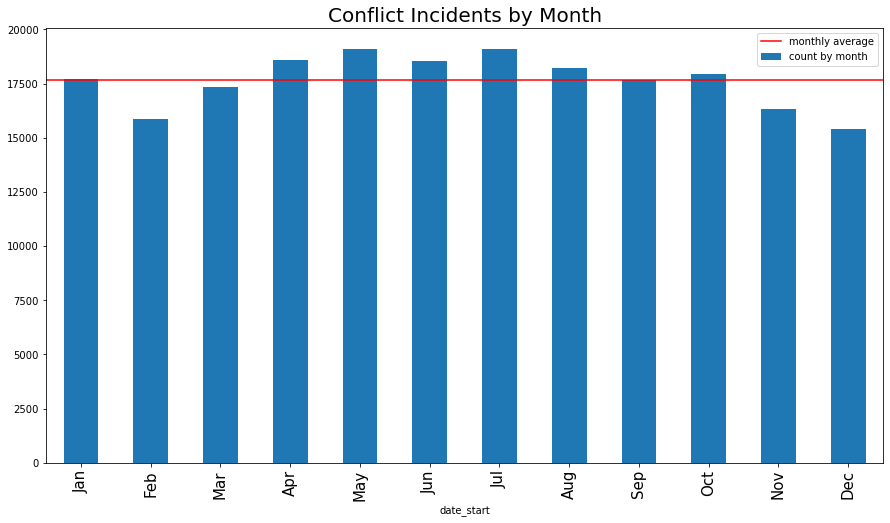

In [69]:
# group by month and plot
fig, ax = plt.subplots(figsize=[15,8])

df_conflict['date_start'].groupby(df_conflict.date_start.dt.month).count().plot(ax=ax,
                                                                                kind='bar',
                                                                                label='count by month')

# get mean of count by month
month_mean = df_conflict['date_start'].groupby(df_conflict.date_start.dt.month).agg('count').mean()

# plot horizontal line
plt.axhline(y= month_mean, 
            color='red',
            label='monthly average')

plt.title('Conflict Incidents by Month', fontsize=20)

plt.xticks(ticks= np.arange(0,12),
           labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'],
           fontsize=15)

plt.legend();

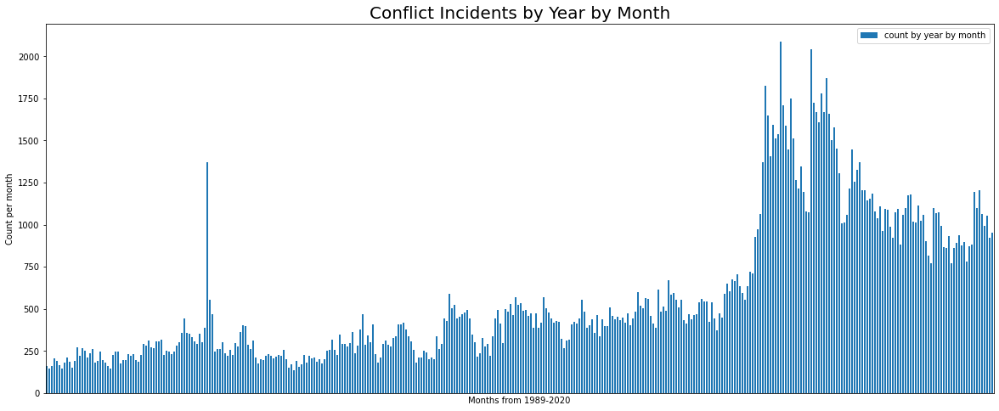

In [366]:
# group by year and month and plot
fig, ax = plt.subplots(figsize=[20,8])

year_month = df_conflict['date_start'].groupby([df_conflict.date_start.dt.year, df_conflict.date_start.dt.month]).count()


year_month.plot(ax=ax,
                kind='bar',
                label='count by year by month')

plt.title('Conflict Incidents by Year by Month', fontsize=20)
plt.xlabel('Months from 1989-2020')
plt.ylabel('Count per month')
plt.legend()

plt.tick_params(
    axis='x',          
    which='both',      
    bottom=False,      
    top=False,         
    labelbottom=False)

#plt.savefig('/Users/richard/Desktop/springboard_repo/capstones/capstone-two/reports/figures/AllConflicts_Counts_byMonth.png');

### Date Findings
- Conflict incidents start and end between January 1, 1989 and 31 December, 2019
- The distribution of date_start and date_end are remarkably similar, suggesting the dataset contains a collection of many short-term conflict incidents.


- The average number of conflict incidents started and ended on a given day is 18.7.
- The number of conflict incidents per month increases over the entire time period. 
- We see one significant jump in conflict incidents around 1994
- We see a dramatic trend of **increasing conflict incidents from 2010-2014**
- This slopes down (but still high) from 2015-2020
- There seem to be **seasonal peaks**. This could be very interesting to explore further. This is confirmed when we group conflict incidents by Month: the months April to August are above average.


- NOTE: The overall increases in conflict incidents may well be due to increases in the quality of data collection. E.g. this time periods coincides with the rise of the internet (90s) and the prevalence of smartphone (late 2000s/early 2010s)

## 3.7 deaths_a

*deaths_a* records the number of deaths incurred during the incident by side a of the conflict dyad.

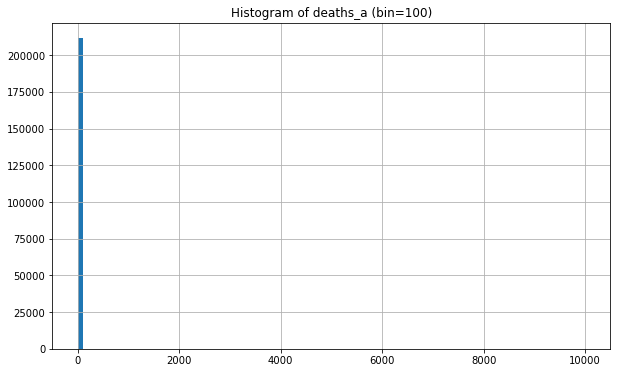

In [71]:
# plot histogram of deaths_a
df_conflict.deaths_a.hist(bins=100, figsize=(10,6))
plt.title('Histogram of deaths_a (bin=100)');

In [72]:
df_conflict.deaths_a.describe()

count    211879.000000
mean          1.738407
std          44.116446
min           0.000000
25%           0.000000
50%           0.000000
75%           1.000000
max       10000.000000
Name: deaths_a, dtype: float64

In [73]:
# get percentage of 0 values
df_conflict.deaths_a.value_counts()[0] / df_conflict.shape[0] * 100

73.33714053775977

In [74]:
# get percentage of values above 10, 100
df_conflict['deaths_a'][df_conflict['deaths_a'] > 10].count() / df_conflict.shape[0] * 100, df_conflict['deaths_a'][df_conflict['deaths_a'] > 100].count() / df_conflict.shape[0] * 100

(2.0898720496132226, 0.11138432784749787)

In [75]:
# get count of values above 100
df_conflict['deaths_a'][df_conflict['deaths_a'] > 100].count()

236

As already noted in the Data Wrangling notebook, deaths_a has an extremely skewed distribution. 

- The IRQ ranges from 0 to 1
- mean is 1.74
- standard deviation is 44.1
- the maximum value is 10000.

Below we extract the entry with the maximum deaths_a value to better understand what's going on:

In [76]:
# find conflict incident(s) with deaths_a = deaths_a.max()
df_conflict[df_conflict.deaths_a == df_conflict.deaths_a.max()]

,year,type_of_violence,conflict_id,dyad_id,dyad_name,side_a_id,side_a,side_b_id,side_b,where_prec,...,country_id,region,event_clarity,date_prec,date_start,date_end,deaths_a,deaths_b,deaths_civilians,deaths_unknown
id,,,,,,,,,,,,,,,,,,,,,
34345,1999,1,409,865,Government of Eritrea - Government of Ethiopia,98,Government of Eritrea,97,Government of Ethiopia,2,...,531,Africa,2,2,1999-02-23,1999-02-26,10000,5000,0,0


#### External Data Verification
This extreme violent incident refers to the Eritrean-Ethiopian War in 1999. This [Wikipedia page](https://en.wikipedia.org/wiki/Eritrean%E2%80%93Ethiopian_War) confirms the dates and deaths; the entry is an accurate estimate of actual deaths that occurred in that time period.

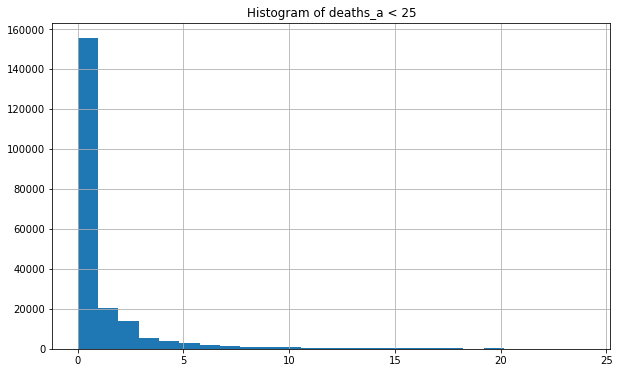

In [77]:
# plot histogram of deaths_a values under 50
df_conflict['deaths_a'][df_conflict['deaths_a'] < 25].hist(bins=25, figsize=(10,6))
plt.title('Histogram of deaths_a < 25');

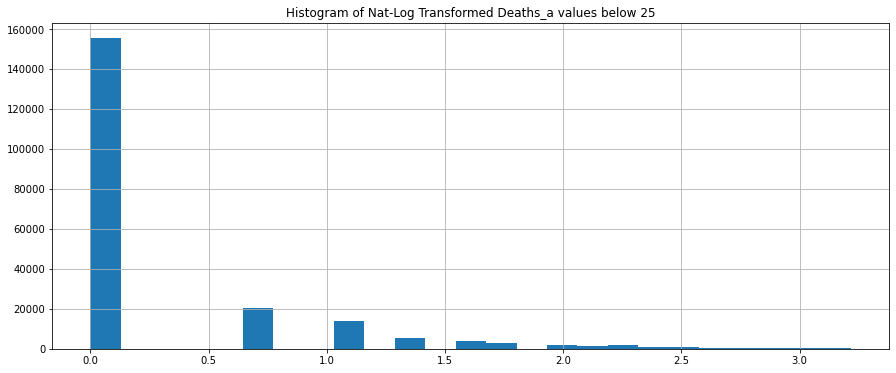

In [78]:
# plot a histogram of natural log-transformed deaths_a for values below 25
deathsa_0_25 = df_conflict['deaths_a'][(df_conflict['deaths_a'] < 25)] + 1

np.log(deathsa_0_25).hist(bins=25, figsize=(15,6))
plt.title('Histogram of Nat-Log Transformed Deaths_a values below 25');

### Deaths_A Findings
- 73.3% of conflict incidents have a value of 0 for deaths_a
- the mean value of deaths_a is 1.73
- taking the log of values below 25 does not reveal an approximation of the normal distribution.

## 3.8 deaths_b

*deaths_b* records the number of deaths incurred by side b of the conflict dyad.

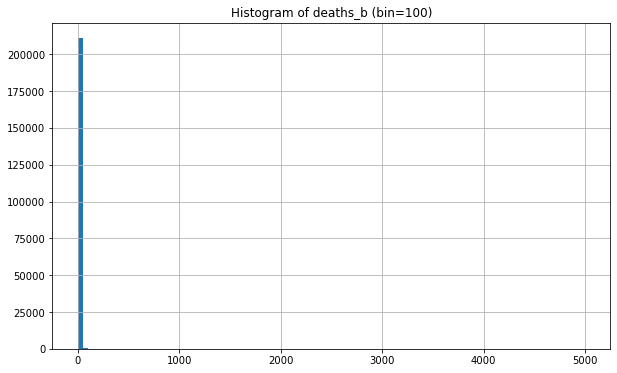

In [79]:
# plot histogram of deaths_b
df_conflict.deaths_b.hist(figsize=(10,6), bins=100)
plt.title('Histogram of deaths_b (bin=100)');

In [80]:
df_conflict.deaths_b.describe()

count    211879.000000
mean          2.296405
std          15.343345
min           0.000000
25%           0.000000
50%           0.000000
75%           2.000000
max        5000.000000
Name: deaths_b, dtype: float64

In [81]:
df_conflict.deaths_b.value_counts()

0      130459
1       23662
2       18130
3        9129
4        6153
        ...  
324         1
198         1
201         1
203         1
311         1
Name: deaths_b, Length: 209, dtype: int64

In [82]:
# get percentage of 0 values
df_conflict.deaths_b.value_counts()[0] / df_conflict.shape[0] * 100

61.57240689261324

Deaths_b is also extremely skewed, though slightly less so than deaths_a.

Let's find the entry that has the outlier value of 5000.

In [83]:
# find conflict incident(s) with deaths_b = deaths_b.max()
df_conflict[df_conflict.deaths_b == df_conflict.deaths_b.max()]

,year,type_of_violence,conflict_id,dyad_id,dyad_name,side_a_id,side_a,side_b_id,side_b,where_prec,...,country_id,region,event_clarity,date_prec,date_start,date_end,deaths_a,deaths_b,deaths_civilians,deaths_unknown
id,,,,,,,,,,,,,,,,,,,,,
34345,1999,1,409,865,Government of Eritrea - Government of Ethiopia,98,Government of Eritrea,97,Government of Ethiopia,2,...,531,Africa,2,2,1999-02-23,1999-02-26,10000,5000,0,0


#### External source validation 

This entry refers to the same incident of the Eritrean-Ethiopian War as mentioned above.

Let's briefly investigate the incidents related to this conflict further, in order to get a sense of the scope.

In [84]:
# find conflict incident(s) that share this conflict_id
df_conflict_409 = df_conflict[df_conflict.conflict_id == 409]

In [85]:
df_conflict_409.describe()

,year,type_of_violence,conflict_id,dyad_id,side_a_id,side_b_id,where_prec,latitude,longitude,country_id,event_clarity,date_prec,deaths_a,deaths_b,deaths_civilians,deaths_unknown
count,27.000000,27.0,27.0,27.0,27.0,27.0,27.000000,27.000000,27.000000,27.000000,27.000000,27.000000,27.000000,27.00000,27.000000,27.000000
mean,1998.888889,1.0,409.0,865.0,98.0,97.0,1.555556,14.617941,38.581542,530.592593,1.185185,1.555556,511.740741,190.37037,1.592593,4.111111
std,0.800641,0.0,0.0,0.0,0.0,0.0,0.506370,0.360315,0.974872,0.500712,0.395847,0.751068,1945.636036,961.35958,3.041498,19.279988
min,1998.000000,1.0,409.0,865.0,98.0,97.0,1.000000,13.496670,36.657500,530.000000,1.000000,1.000000,0.000000,0.00000,0.000000,0.000000
25%,1998.000000,1.0,409.0,865.0,98.0,97.0,1.000000,14.416790,37.803055,530.000000,1.000000,1.000000,0.000000,0.00000,0.000000,0.000000
50%,1999.000000,1.0,409.0,865.0,98.0,97.0,2.000000,14.635280,38.933330,531.000000,1.000000,1.000000,0.000000,0.00000,0.000000,0.000000
75%,1999.500000,1.0,409.0,865.0,98.0,97.0,2.000000,14.774168,39.385000,531.000000,1.000000,2.000000,15.000000,1.50000,1.500000,0.000000
max,2000.000000,1.0,409.0,865.0,98.0,97.0,2.000000,15.333330,39.741111,531.000000,2.000000,4.000000,10000.000000,5000.00000,12.000000,100.000000


In [86]:
# group deaths_a by conflict_id and sum to get total number
df_conflict_409.deaths_a.groupby(by=df_conflict_409.conflict_id).sum()

conflict_id
409    13817
Name: deaths_a, dtype: int64

In [87]:
# group deaths_b by conflict_id and sum to get total number
df_conflict_409.deaths_b.groupby(by=df_conflict_409.conflict_id).sum()

conflict_id
409    5140
Name: deaths_b, dtype: int64

These single extreme entries represent the bulk of the deaths incurred on both sides for this conflict id. We will leave this conflict for what it is for now and proceed with our overall EDA.

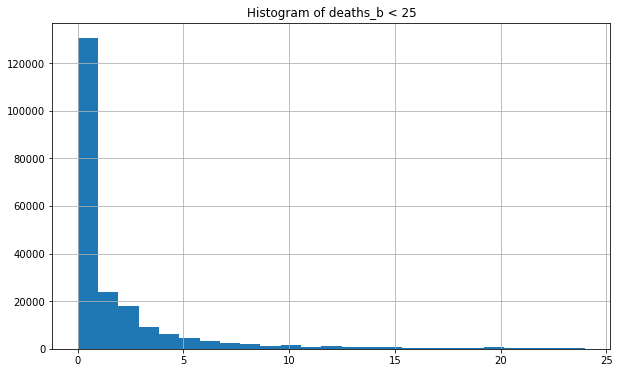

In [88]:
# plot histogram of deaths_a values under 50
df_conflict['deaths_b'][df_conflict['deaths_b'] < 25].hist(bins=25, figsize=(10,6))
plt.title('Histogram of deaths_b < 25');

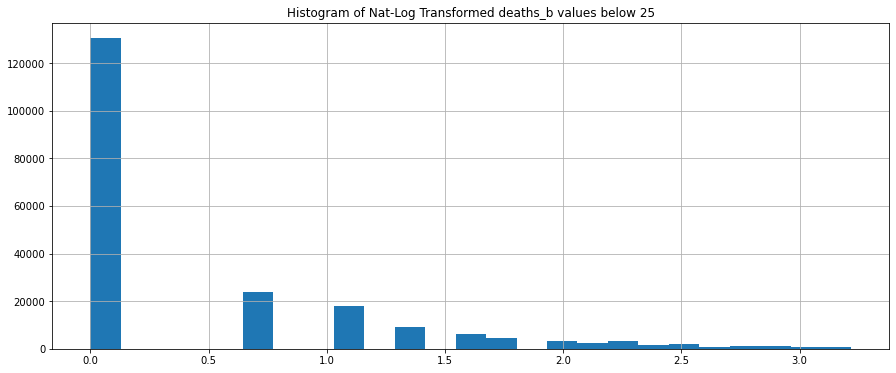

In [89]:
# plot a histogram of natural log-transformed deaths_b for values below 25
deathsb_0_25 = df_conflict['deaths_b'][(df_conflict['deaths_b'] < 25)] + 1

np.log(deathsb_0_25).hist(bins=25, figsize=(15,6))
plt.title('Histogram of Nat-Log Transformed deaths_b values below 25');

### Deaths_b Findings
- IQR ranges from 0 to 2
- the mean is 2.3
- the maximum value is 5000
- 61.5% of the entries have the value 0
- the log transformation of deaths_b below 25 does not reveal an approximation of the normal distribution.


## 3.9 deaths_civilians

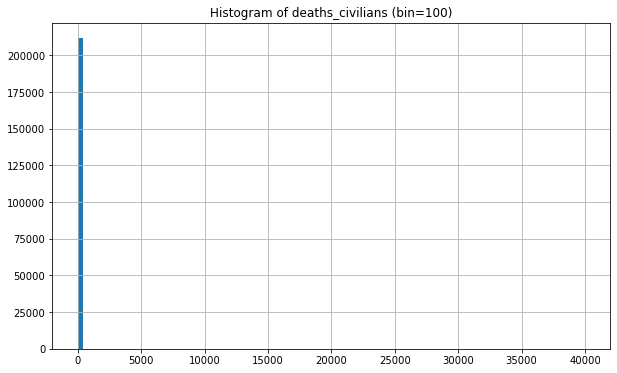

In [90]:
# plot a histogram of deaths_civilians
df_conflict.deaths_civilians.hist(figsize=(10,6), bins=100)
plt.title('Histogram of deaths_civilians (bin=100)');

In [91]:
df_conflict.deaths_civilians.describe()

count    211879.000000
mean          4.195758
std         189.131397
min           0.000000
25%           0.000000
50%           0.000000
75%           1.000000
max       40000.000000
Name: deaths_civilians, dtype: float64

In [92]:
df_conflict.deaths_civilians.value_counts()

0        150863
1         26542
2         10326
3          5689
4          3581
          ...  
313           1
311           1
766           1
310           1
14000         1
Name: deaths_civilians, Length: 320, dtype: int64

In [93]:
# get percentage of 0 values
df_conflict.deaths_civilians.value_counts()[0] / df_conflict.shape[0] * 100

71.20243157651302

Again, a massively skewed distribution here.

- IQR ranges from 0 to 1 
- The mean is 4.2
- the standard deviation is 189.1
- the maximum value is 40000.

Let's investigate the incident with outlier value of 40000:

In [94]:
# find conflict incident(s) with civilian deaths = death_civilians.max()
df_conflict[df_conflict.deaths_civilians == df_conflict.deaths_civilians.max()]

,year,type_of_violence,conflict_id,dyad_id,dyad_name,side_a_id,side_a,side_b_id,side_b,where_prec,...,country_id,region,event_clarity,date_prec,date_start,date_end,deaths_a,deaths_b,deaths_civilians,deaths_unknown
id,,,,,,,,,,,,,,,,,,,,,
40030,1994,3,472,939,Government of Rwanda - Civilians,94,Government of Rwanda,1,Civilians,1,...,517,Africa,1,1,1994-04-21,1994-04-21,0,0,40000,0


#### External data validation 

It seems this is an entry that groups together an estimate of civilian deaths as part of the Rwandan genocide.
On April 21, 1994 the International Red Cross publicly estimated that 'hundreds of thousands' of Tutsi has been killed in Rwanda. See [this Wikipedia page](https://en.wikipedia.org/wiki/1994_in_Rwanda#April_6) for more details.

It is worthwhile to briefly investigate the incidents in Rwanda further to get a sense of the scope.

In [95]:
# find conflict incident(s) that share this conflict_id
df_conflict_472 = df_conflict[df_conflict.conflict_id == 472]

In [96]:
# obtain summary statistics of subsetted df_conflict
df_conflict_472.describe()

,year,type_of_violence,conflict_id,dyad_id,side_a_id,side_b_id,where_prec,latitude,longitude,country_id,event_clarity,date_prec,deaths_a,deaths_b,deaths_civilians,deaths_unknown
count,1486.000000,1486.0,1486.0,1486.0,1486.0,1486.0,1486.000000,1486.000000,1486.000000,1486.000000,1486.000000,1486.000000,1486.0,1486.0,1486.000000,1486.000000
mean,1994.701884,3.0,472.0,939.0,94.0,1.0,1.489906,-2.101708,29.530129,516.543742,1.178331,1.588156,0.0,0.0,326.172948,0.337147
std,3.775959,0.0,0.0,0.0,0.0,0.0,0.688212,0.231328,0.373812,3.473678,0.382920,1.088028,0.0,0.0,2212.114977,12.970624
min,1990.000000,3.0,472.0,939.0,94.0,1.0,1.000000,-2.988889,28.050000,490.000000,1.000000,1.000000,0.0,0.0,0.000000,0.000000
25%,1994.000000,3.0,472.0,939.0,94.0,1.0,1.000000,-2.178985,29.314930,517.000000,1.000000,1.000000,0.0,0.0,1.000000,0.000000
50%,1994.000000,3.0,472.0,939.0,94.0,1.0,1.000000,-2.138300,29.355500,517.000000,1.000000,1.000000,0.0,0.0,2.000000,0.000000
75%,1994.000000,3.0,472.0,939.0,94.0,1.0,2.000000,-2.001700,29.685300,517.000000,1.000000,2.000000,0.0,0.0,10.000000,0.000000
max,2018.000000,3.0,472.0,939.0,94.0,1.0,4.000000,-0.166667,30.800300,517.000000,2.000000,4.000000,0.0,0.0,40000.000000,500.000000


In [97]:
# group civilian deaths by conflict_id and sum to get total number
df_conflict_472.deaths_civilians.groupby(by=df_conflict_472.conflict_id).sum()

conflict_id
472    484693
Name: deaths_civilians, dtype: int64

Subsetting the conflict dataset using the Rwanda Government - Civilians conflict ID (472) and obtaining the summary statistics reveals the following:
- a mean of 326 civilian deaths
- and IQR of 0 - 10
- a standard deviation of 2212
- our maximum value of 40000

Summing all the civilian deaths for this conflict returns a total of 484,693 civilian deaths. This is a significant outlier with respect to the death counts of other conflict IDs and incidents. We will have to consider whether or not to include this in the analysis.


Note that deaths_a and deaths_b are 0 for this conflict_id. The conflict_name reveals that this is because this conflict_id specifically registers incidents inflicted by the Rwandan government on the civilian population.

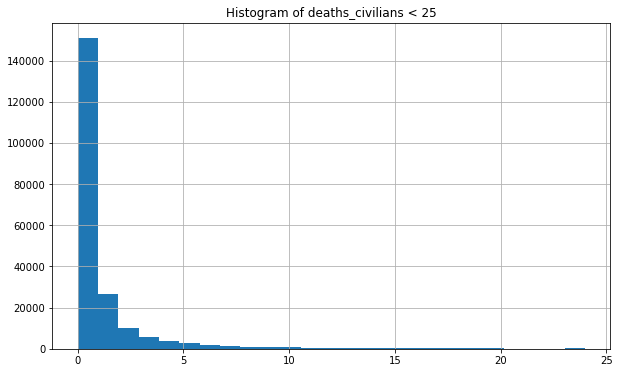

In [98]:
# plot a histogram of deaths_civilians < 25
df_conflict['deaths_civilians'][df_conflict['deaths_civilians'] < 25].hist(figsize=(10,6), bins=25)
plt.title('Histogram of deaths_civilians < 25');

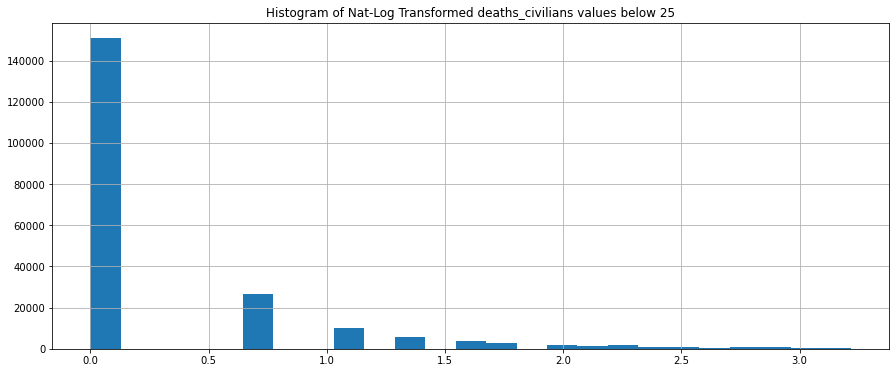

In [99]:
# plot a histogram of natural log-transformed deaths_civilians for values below 25
deathsc_0_25 = df_conflict['deaths_civilians'][(df_conflict['deaths_civilians'] < 25)] + 1

np.log(deathsc_0_25).hist(bins=25, figsize=(15,6))
plt.title('Histogram of Nat-Log Transformed deaths_civilians values below 25');

### Deaths_civilians Findings
- the mean deaths_civilians value is 4.2
- 71.2% of the values are 0
- outlier of 40000 represents an aggregate of several events
- log-transformation of values below 25 does not reveal an approximation of the normal distribution

## 3.10 deaths_unknown

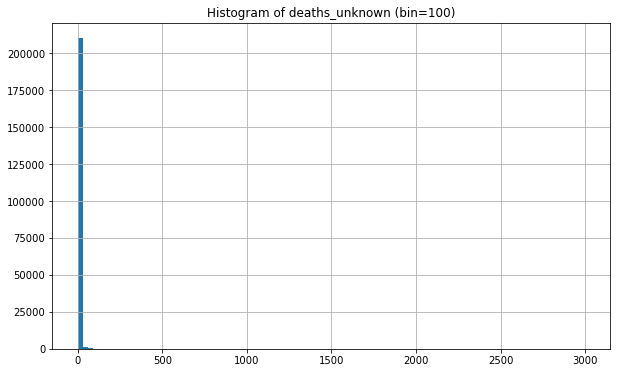

In [100]:
# plot histogram of deaths_unknown values
df_conflict.deaths_unknown.hist(figsize=(10,6), bins=100)
plt.title('Histogram of deaths_unknown (bin=100)');

In [101]:
df_conflict.deaths_unknown.describe()

count    211879.000000
mean          1.354353
std          17.609419
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max        3000.000000
Name: deaths_unknown, dtype: float64

In [102]:
df_conflict.deaths_unknown.value_counts()

0      185396
1        8896
2        4525
3        2378
4        1673
        ...  
999         1
190         1
288         1
231         1
809         1
Name: deaths_unknown, Length: 268, dtype: int64

In [103]:
# get percentage of 0 values
df_conflict['deaths_unknown'][df_conflict['deaths_unknown'] == 0].count() / df_conflict.shape[0] * 100

87.50088493904539

Again, a skewed distribution here, but less extreme than deaths_civilians:

- IQR ranges from 0 to 0
- The mean is 1.35
- the standard deviation is 17.6
- the maximum value is 3000.

#### External Source Validation

In [104]:
# find conflict incident(s) with unknown deaths = deaths_unknown.max()
df_conflict[df_conflict.deaths_unknown == df_conflict.deaths_unknown.max()]

,year,type_of_violence,conflict_id,dyad_id,dyad_name,side_a_id,side_a,side_b_id,side_b,where_prec,...,country_id,region,event_clarity,date_prec,date_start,date_end,deaths_a,deaths_b,deaths_civilians,deaths_unknown
id,,,,,,,,,,,,,,,,,,,,,
43129,1998,1,408,864,Government of Congo - Ntsiloulous,88,Government of Congo,548,Ntsiloulous,1,...,484,Africa,2,2,1998-12-18,1998-12-21,0,0,0,3000


In [105]:
# find conflict incident(s) that share this conflict_id
df_conflict_408 = df_conflict[df_conflict.conflict_id == 408]

In [106]:
# obtain summary statistics of subsetted df_conflict
df_conflict_408.describe()

,year,type_of_violence,conflict_id,dyad_id,side_a_id,side_b_id,where_prec,latitude,longitude,country_id,event_clarity,date_prec,deaths_a,deaths_b,deaths_civilians,deaths_unknown
count,114.000000,114.0,114.0,114.000000,114.0,114.000000,114.000000,114.000000,114.000000,114.000000,114.000000,114.000000,114.000000,114.000000,114.000000,114.000000
mean,1999.570175,1.0,408.0,863.017544,88.0,546.921053,1.333333,-4.183051,14.594664,484.210526,1.184211,1.552632,1.640351,5.771930,2.307018,37.578947
std,4.785615,0.0,0.0,1.096918,0.0,1.220364,0.827264,0.286664,0.929478,1.108884,0.389367,1.031299,3.207092,15.110235,8.072818,285.349836
min,1993.000000,1.0,408.0,861.000000,88.0,545.000000,1.000000,-4.794722,11.721111,484.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,1997.000000,1.0,408.0,862.000000,88.0,546.000000,1.000000,-4.268333,14.383889,484.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
50%,1999.000000,1.0,408.0,863.000000,88.0,547.000000,1.000000,-4.259167,14.891667,484.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
75%,2001.750000,1.0,408.0,864.000000,88.0,548.000000,1.000000,-4.174161,15.284722,484.000000,1.000000,2.000000,2.000000,2.750000,0.000000,1.000000
max,2017.000000,1.0,408.0,864.000000,88.0,548.000000,4.000000,-2.544722,15.315000,490.000000,2.000000,4.000000,22.000000,71.000000,60.000000,3000.000000


In [107]:
# group unknown deaths by conflict_id and sum to get total number
df_conflict_408.deaths_unknown.groupby(by=df_conflict_408.conflict_id).sum()

conflict_id
408    4284
Name: deaths_unknown, dtype: int64

This incident refers to the Second Congo War, but an exact reference to this incident of 3000 'unknown' deaths is not immediately available. Total number of 'unknown deaths' as part of this conflict_id = 4284.

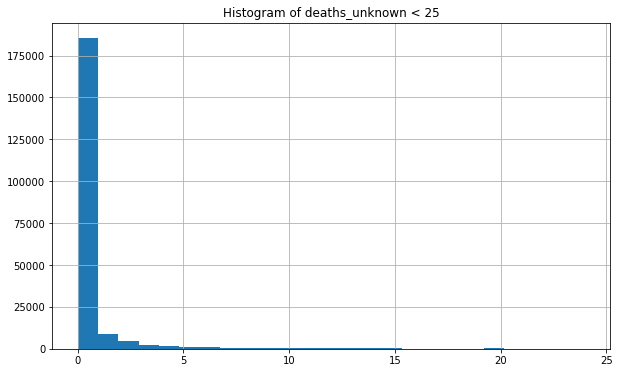

In [108]:
# plot a histogram of deaths_unknown < 25
df_conflict['deaths_unknown'][df_conflict['deaths_unknown'] < 25].hist(figsize=(10,6), bins=25)
plt.title('Histogram of deaths_unknown < 25');

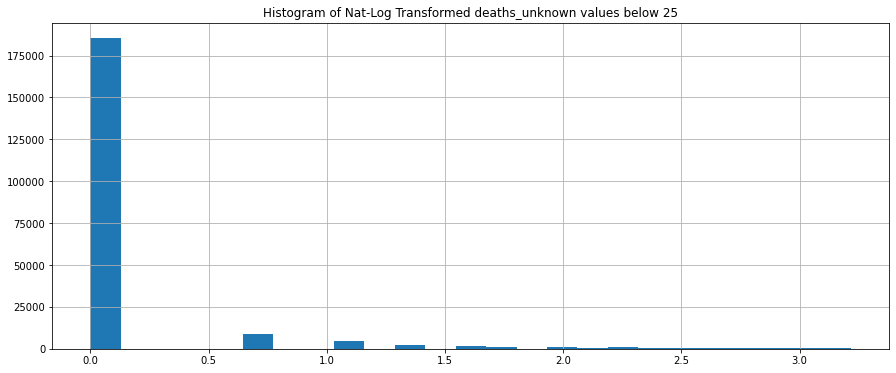

In [109]:
# plot a histogram of natural log-transformed deaths_unknown for values below 25
deathsu_0_25 = df_conflict['deaths_unknown'][(df_conflict['deaths_unknown'] < 25)] + 1

np.log(deathsu_0_25).hist(bins=25, figsize=(15,6))
plt.title('Histogram of Nat-Log Transformed deaths_unknown values below 25');

### Deaths_unknown Findings

- mean value of deaths_unknown is 1.35
- 87.5% of the entries have the value 0
- log transform of deaths_unknown does not reveal approximation of normal distribution.

Before proceeding, it will be worthwhile to investigate how many entries have a value of 0 for all 4 death count features. This will give us a sense of the overall severity of conflict incidents.

In [110]:
# get count of entries with no death counts at all
count = df_conflict[(df_conflict.deaths_a + df_conflict.deaths_b + df_conflict.deaths_civilians + df_conflict.deaths_unknown) == 0].shape[0]
count

18082

In [111]:
# get percentage of entries with no death counts at all
count / df_conflict.shape[0] * 100

8.534116170078205

Only 8.5% of entries have no death counts at all. This indicates that most conflicts will have an uneven distribution of death counts across the 4 features. 

## Overall Death Count Findings
- all 4 features are extremely skewed
- all 4 features have between 60%-85% entries with 0 values
- 8.5% of df_conflict entries have no death counts at all

## 3.11 Precision variables

There are three important precision variables included in the UCDP dataset. In the Data Wrangling notebook we already inspected these and subsetted the dataset to include data at the appropriate level of precision for our analysis. But as a reminder:

- **where_prec**: measures the precision with which location of event is known. All events with a precision of min where_prec = 4 were included, this means locations are known at the level of first-order administrative region or more.
- **date_prec**: measures the precision with which dates of event are known. All events with a precision of min. +/-30 days (corresponding to date_prec < 5) were included.
- **event_clarity**: measures whether the exact details of the event are known or whether the original source contained aggregated data which does not allow exact identification of the event. The value can be 1 for exact or 2 for aggregated source material. Example from the documentation for event_clarity = 2: "The Ukrainian government informs that 29 people have died in the past six days in a number of clashes with the separatists along the line of conflict." 

The Data Wrangling notebook did not consider *event_clarity* in detail, so we will do so below:

In [112]:
df_conflict.event_clarity.value_counts()

1    196569
2     15310
Name: event_clarity, dtype: int64

We see that <10% of the events have an event_clarity of 2. We will keep all entries since we are interested in large-scale, longer-term trend; but we will be mindful of this when analysing specific events. 

# 4. Feature Engineering for EDA

Our hypothesis states that: 
> Areas that experience higher-than-average (extreme) changes in climate measures also experience more intense conflict.

In order to begin evaluating this hypothesis, we will engineer a number of features to summarize the datasets:
 - yearly means of climate measures per station
 - total number of deaths per conflict incident
 - total number of deaths per conflict ID**
 - duration of conflict incident in number of days
 - 5-year time period in which the conflict takes place (for plotting purposes)

(**) Reminder: a Conflict ID groups together multiple conflict incidents that belong to a single geopolotical conflict between two sides.

These features will allow us to get a better sense of which areas and which periods show high levels of conflict or climate change.

## 4.1 Compute Yearly Means per Station

Below we calculate the yearly mean for each station in our df_weather dataset. Reminder: these are the stations within 50km of any conflict incident.

In [368]:
 # group by station, then get mean per year
yearly_means = df_weather.groupby(
    [df_weather.index.get_level_values('STATION ID'), 
     df_weather.index.get_level_values('DATE').year]
    ).mean()

In [369]:
# inspect resulting dataframe
yearly_means

PRCP        TAVG        TMAX        TMIN
STATION ID  DATE                                               
AE000041196 1944   6.195122  283.529617  350.196491  219.606498
            1945   1.798354  259.811475  319.487179  194.239496
            1955        NaN  272.772603  318.606061  202.556497
            1956        NaN  271.314208  318.300546  201.332370
            1957        NaN  268.586301  312.187675  203.830460
...                     ...         ...         ...         ...
ZI000067983 2016  47.733945  209.214035  258.287234  148.941634
            2017  81.712500  191.477612  239.688889  138.511905
            2018  38.437500  188.792453  238.034483  128.340909
            2019        NaN  182.000000  236.000000  134.000000
            2020  54.500000  181.500000  220.000000  155.500000

[368214 rows x 4 columns]

In [370]:
# yearly_means.to_csv('/Users/richard/Desktop/data/processed/df_yearly_means_stations50k.csv')

Note the presence of NaN values in the columns. This is because not all stations have records for all years. This is important to remember as we continue our analysis.

To get a sense of the coverage per year, let's plot a barplot of counts below:

In [371]:
# reset index at level 'DATE'
yearly_means.reset_index(level=1, inplace=True)

In [372]:
yearly_means

,DATE,PRCP,TAVG,TMAX,TMIN
STATION ID,,,,,
AE000041196,1944,6.195122,283.529617,350.196491,219.606498
AE000041196,1945,1.798354,259.811475,319.487179,194.239496
AE000041196,1955,NaN,272.772603,318.606061,202.556497
AE000041196,1956,NaN,271.314208,318.300546,201.332370
AE000041196,1957,NaN,268.586301,312.187675,203.830460
...,...,...,...,...,...
ZI000067983,2016,47.733945,209.214035,258.287234,148.941634
ZI000067983,2017,81.712500,191.477612,239.688889,138.511905
ZI000067983,2018,38.437500,188.792453,238.034483,128.340909


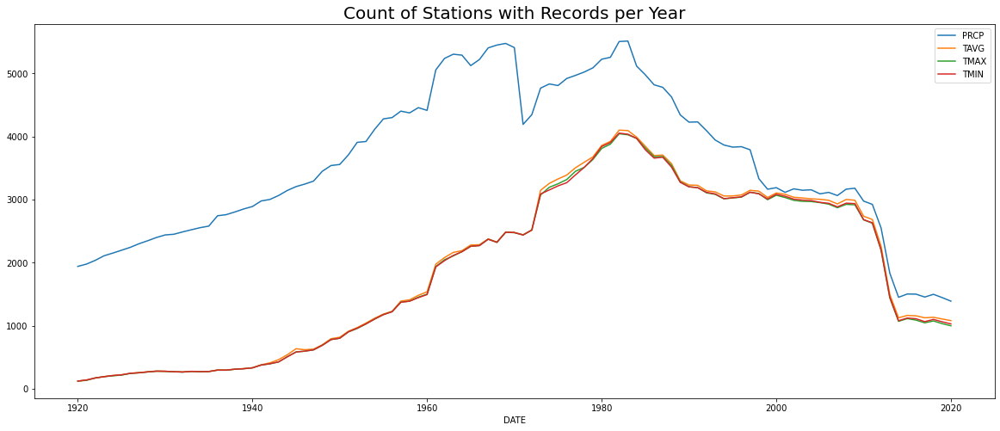

In [374]:
# group by year and plot
fig, ax = plt.subplots(figsize=[20,8])

yearly_means.groupby(yearly_means.DATE).count().plot(ax=ax,
                                                     label='count by year')

plt.title('Count of Stations with Records per Year', fontsize=20)
plt.legend();

#plt.savefig('/Users/richard/Desktop/springboard_repo/capstones/capstone-two/reports/figures/AllStations_Counts_byYear.png');

### Yearly_means Findings

- Overall, coverage of PRCP measures is higher than the Temperature measures
- PRCP coverage increases from 1920-1970, and decreases sharply from 1984-2020
- Temperature coverage increases from 1920-1984, then decreases gradually until 2009, then sharply.
- The period from 2013-2020 has relatively low coverage (i.e. many missing values) compared to the 50 years preceding it.

## 4.2 Compute Total Deaths per Conflict Incident

This variable is relatively simple to create. We simply add a new column to df_conflict containing the sum of the four separate 'deaths' variables.

In [119]:
# create new column total_deaths with sum of 4 deaths_ variables
df_conflict['total_deaths'] = df_conflict['deaths_a'] + df_conflict['deaths_b'] + df_conflict['deaths_civilians'] + df_conflict['deaths_unknown']
df_conflict.head()

,year,type_of_violence,conflict_id,dyad_id,dyad_name,side_a_id,side_a,side_b_id,side_b,where_prec,...,region,event_clarity,date_prec,date_start,date_end,deaths_a,deaths_b,deaths_civilians,deaths_unknown,total_deaths
id,,,,,,,,,,,,,,,,,,,,,
244657,2017,1,259,524,Government of Iraq - IS,116,Government of Iraq,234,IS,1,...,Asia,1,1,2017-07-31,2017-07-31,0,4,0,2,6
132140,1989,1,333,724,Government of Afghanistan - Jam'iyyat-i Islami...,130,Government of Afghanistan,292,Jam'iyyat-i Islami-yi Afghanistan,4,...,Asia,1,3,1989-01-07,1989-01-13,6,0,0,0,6
130364,1989,1,333,724,Government of Afghanistan - Jam'iyyat-i Islami...,130,Government of Afghanistan,292,Jam'iyyat-i Islami-yi Afghanistan,4,...,Asia,2,2,1989-01-15,1989-01-18,0,0,0,4,4
130359,1989,1,333,724,Government of Afghanistan - Jam'iyyat-i Islami...,130,Government of Afghanistan,292,Jam'iyyat-i Islami-yi Afghanistan,1,...,Asia,1,2,1989-01-23,1989-01-24,0,0,0,600,600
133883,1989,1,333,724,Government of Afghanistan - Jam'iyyat-i Islami...,130,Government of Afghanistan,292,Jam'iyyat-i Islami-yi Afghanistan,1,...,Asia,1,3,1989-01-30,1989-02-05,0,0,0,2,2


This worked as expected. Let's export to local csv file.

In [120]:
# # export to local csv
# df_conflict.to_csv('/Users/richard/Desktop/data/processed/df_conflict_clean_totaldeaths.csv')

## 4.3 Compute Total Deaths per Conflict ID

Next, let's group the total_deaths by conflict ID to get a sense of which long-term conflicts were the most deadly.

In [121]:
# transform df_conflict by grouping by conflict_id, with conflict_id and id as MultiIndex
df_conflict_byID = df_conflict.set_index(['conflict_id'], drop=True, append=True)
df_conflict_byID = df_conflict_byID.swaplevel('conflict_id', 'id')
df_conflict_byID.sort_index(inplace=True)

In [122]:
# inspect
df_conflict_byID.head()

year  type_of_violence  dyad_id  \
conflict_id id                                        
205         115494  1990                 1      406   
            115501  1990                 1      406   
            115609  1996                 1      406   
            115779  1995                 1      406   
            115800  1994                 1      406   

                                    dyad_name  side_a_id              side_a  \
conflict_id id                                                                 
205         115494  Government of Iran - KDPI        114  Government of Iran   
            115501  Government of Iran - KDPI        114  Government of Iran   
            115609  Government of Iran - KDPI        114  Government of Iran   
            115779  Government of Iran - KDPI        114  Government of Iran   
            115800  Government of Iran - KDPI        114  Government of Iran   

                    side_b_id side_b  where_prec where_coordinates  ...  \
conflict_id id                                                      ...   
205         115494        164   KDPI           2       Saqqez town  ...   
            115501        164   KDPI           2     Sardasht town  ...   
            115609        164   KDPI           2        Arbīl town  ...   
            115779        164   KDPI           1        Baneh town  ...   
            115800        164   KDPI           1      Baghdād city  ...   

                         region event_clarity date_prec  date_start  \
conflict_id id                                                        
205         115494  Middle East             2         2  1990-06-16   
            115501  Middle East             1         1  1990-06-26   
            115609  Middle East             1         1  1996-03-17   
            115779  Middle East             1         2  1995-11-15   
            115800  Middle East             1         1  1994-08-04   

                     date_end deaths_a  deaths_b deaths_civilians  \
conflict_id id                                                      
205         115494 1990-06-20        0         1                0   
            115501 1990-06-26        0         0                0   
            115609 1996-03-17        0         4                0   
            115779 1995-11-18        0         0                0   
            115800 1994-08-04        0         1                0   

                    deaths_unknown  total_deaths  
conflict_id id                                    
205         115494               0             1  
            115501               0             0  
            115609               0             4  
            115779               8             8  
            115800               0             1  

[5 rows x 27 columns]

In [123]:
# groupby() conflict_id and sum the death counts
# retain the first instances of variables useful in identifying conflicts
df_conflict_totaldeaths = df_conflict_byID[
    ['dyad_id', 'dyad_name', 'total_deaths', 'deaths_a', 'deaths_b', 'deaths_civilians', 'deaths_unknown'
    ]
].groupby(
    df_conflict_byID.index.get_level_values('conflict_id')
        ).agg({
    'dyad_id': 'first',
    'dyad_name': 'first',
    'total_deaths': 'sum',
    'deaths_a': 'sum',
    'deaths_b': 'sum',
    'deaths_civilians': 'sum',
    'deaths_unknown': 'sum',
})

In [124]:
# inspect to verify
df_conflict_totaldeaths.head()

,dyad_id,dyad_name,total_deaths,deaths_a,deaths_b,deaths_civilians,deaths_unknown
conflict_id,,,,,,,
205,406,Government of Iran - KDPI,184,42,78,22,42
209,411,Government of Philippines - CPP,6228,2377,3414,257,180
218,422,Government of India - Government of Pakistan,1419,530,511,223,155
220,426,Government of Paraguay - Military faction (for...,150,0,0,0,150
221,428,Government of Myanmar (Burma) - KNU,3381,1751,472,183,975


In [125]:
# sort by total_deaths
df_conflict_totaldeaths.sort_values(by='total_deaths', ascending=False).head()

,dyad_id,dyad_name,total_deaths,deaths_a,deaths_b,deaths_civilians,deaths_unknown
conflict_id,,,,,,,
472,939,Government of Rwanda - Civilians,485194,0,0,484693,501
333,735,Government of Afghanistan - Taleban,204705,34088,120838,15438,34341
299,11973,Government of Syria - Syrian insurgents,162328,47835,43392,53854,17247
259,524,Government of Iraq - IS,61680,10279,29595,9602,12204
352,776,Government of Sri Lanka - LTTE,55391,13355,33455,7466,1115


That has worked as expected. We see that:
- the Rwandan conflict tops the list with a massive amount of civilian deaths (almost 500,000). 
- Next are the Aghanistan and Syria conflicts with 160-200,000 deaths. 
- From there are on we have a number of conflicts ranging between 30-60,000 deaths.

In [126]:
# # export to local csv
# df_conflict_totaldeaths.to_csv('/Users/richard/Desktop/data/interim/conflict_totaldeaths_byconflictID.csv')

## 4.4 Compute Duration (in days) per Conflict Incident
Below we calculate the duration in days of each conflict incident by subtracting date_start from date_end.

In [127]:
# calculate duration of conflict incidents in number of days
df_conflict['duration_days'] = df_conflict['date_end'] - df_conflict['date_start']
df_conflict.head(2)

,year,type_of_violence,conflict_id,dyad_id,dyad_name,side_a_id,side_a,side_b_id,side_b,where_prec,...,event_clarity,date_prec,date_start,date_end,deaths_a,deaths_b,deaths_civilians,deaths_unknown,total_deaths,duration_days
id,,,,,,,,,,,,,,,,,,,,,
244657,2017,1,259,524,Government of Iraq - IS,116,Government of Iraq,234,IS,1,...,1,1,2017-07-31,2017-07-31,0,4,0,2,6,0 days
132140,1989,1,333,724,Government of Afghanistan - Jam'iyyat-i Islami...,130,Government of Afghanistan,292,Jam'iyyat-i Islami-yi Afghanistan,4,...,1,3,1989-01-07,1989-01-13,6,0,0,0,6,6 days


Subtracting the datetime objects gives us the number of days -1. This is because the date_start and date_end are the same for single-day events. 

Next step is to convert duration_days to numeric and add 1 to all entries.

In [128]:
# convert timedelta column to integers and add 1 to each entry
df_conflict['duration_days'] = df_conflict['duration_days'].dt.days.astype('int64')
df_conflict['duration_days'] = df_conflict['duration_days'] + 1
df_conflict.head(3)

,year,type_of_violence,conflict_id,dyad_id,dyad_name,side_a_id,side_a,side_b_id,side_b,where_prec,...,event_clarity,date_prec,date_start,date_end,deaths_a,deaths_b,deaths_civilians,deaths_unknown,total_deaths,duration_days
id,,,,,,,,,,,,,,,,,,,,,
244657,2017,1,259,524,Government of Iraq - IS,116,Government of Iraq,234,IS,1,...,1,1,2017-07-31,2017-07-31,0,4,0,2,6,1
132140,1989,1,333,724,Government of Afghanistan - Jam'iyyat-i Islami...,130,Government of Afghanistan,292,Jam'iyyat-i Islami-yi Afghanistan,4,...,1,3,1989-01-07,1989-01-13,6,0,0,0,6,7
130364,1989,1,333,724,Government of Afghanistan - Jam'iyyat-i Islami...,130,Government of Afghanistan,292,Jam'iyyat-i Islami-yi Afghanistan,4,...,2,2,1989-01-15,1989-01-18,0,0,0,4,4,4


Our df_conflict now includes a feature measuring the duration of each conflict incident in days.


Let's export it to a local csv.

In [129]:
# # export to local csv
# df_conflict.to_csv('/Users/richard/Desktop/data/processed/df_conflict_clean_totaldeaths_durationdays.csv')

## 4.6 Add 5-year Period Feature to df_conflict

Below, we return to df_conflict to add a column indicating the 5-year period the incident takes place in. This will allow us to color the spatial plots in the next section to get an indication of temporal patterns.

In [130]:
# add 5-year period column

def fiveyear(year):
    if (year >= 1989) & (year <= 1994):
        return "1989-94"
    elif (year >= 1995) & (year <= 1999):
        return "1995-99"
    elif (year >= 2000) & (year <= 2004):
        return "2000-04"
    elif (year >= 2005) & (year <= 2009):
        return "2005-09"
    elif (year >= 2010) & (year <= 2014):
        return "2010-14"
    else:
        return "2015-19"

df_conflict['5year_period'] = df_conflict['year'].apply(fiveyear)

In [131]:
# inspect and verify
df_conflict[['year', '5year_period']].sample(5)

,year,5year_period
id,,
59429,2010,2010-14
294227,2014,2010-14
153212,2014,2010-14
952,2011,2010-14
189518,2009,2005-09


This has worked as expected.

In the following section, we will explore the spatial patterns present in the dataset.

# 5. Spatial Analysis

Both our datasets contain geo-tagged information that allows us to map where certain events are taking place across the globe. The climate dataset has already been subsetted to include only those stations that are within 50km of a conflict incident. 

In this section, we will dig deeper into the spatial patterns using the *geopandas* package. We will turn our existing dataframes into geodataframes with geographic points. This will allows us to look at:

CONFLICT DATA
- Where did the incidents with highest death counts take place?
- Where did the incidents with longest duration take place?

CLIMATE DATA
- Where were the warmest days recorded?
- Where were the wettest days recorded?

We will be making use of the '5-year period' feature created in the section above to color these maps, so that we can also get a sense of the temporal trends.

## 5.1. Spatial Patterns of Conflict Data

In [12]:
# create geodataframe from df_conflict
crs_conflict = {'init': 'epsg:4326'}
geometry_conflict = [Point(xy) for xy in zip(df_conflict['longitude'], df_conflict['latitude'])]
gdf_conflict = gpd.GeoDataFrame(df_conflict, crs=crs_conflict, geometry=geometry_conflict)

### 5.1.1. Mapping All Conflict Points

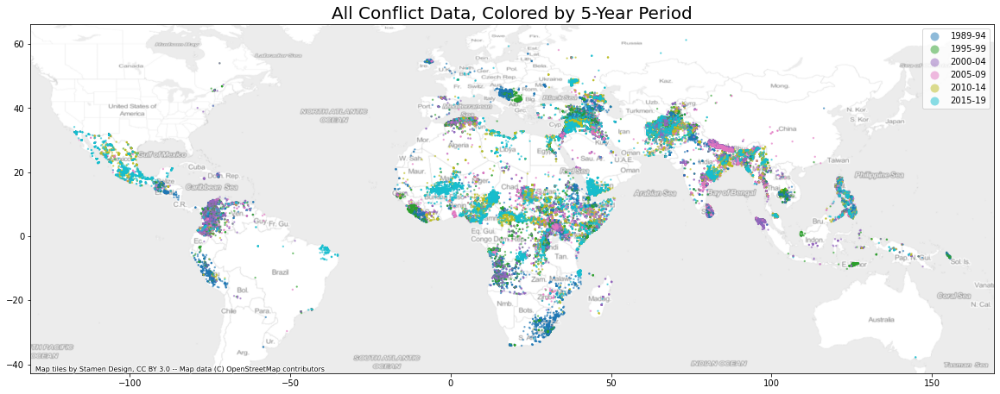

In [133]:
# plot all conflict data, colored by 5-year period
fig, ax = plt.subplots(figsize=(20,8))

gdf_conflict.plot(ax=ax, 
                  alpha=0.5, 
                  markersize=2, 
                  column='5year_period',
                  legend=True)

plt.title('All Conflict Data, Colored by 5-Year Period', fontsize=20)

ctx.add_basemap(ax=ax, 
                crs=4326, 
                alpha=0.5,
                source=ctx.providers.Stamen.TonerLite);

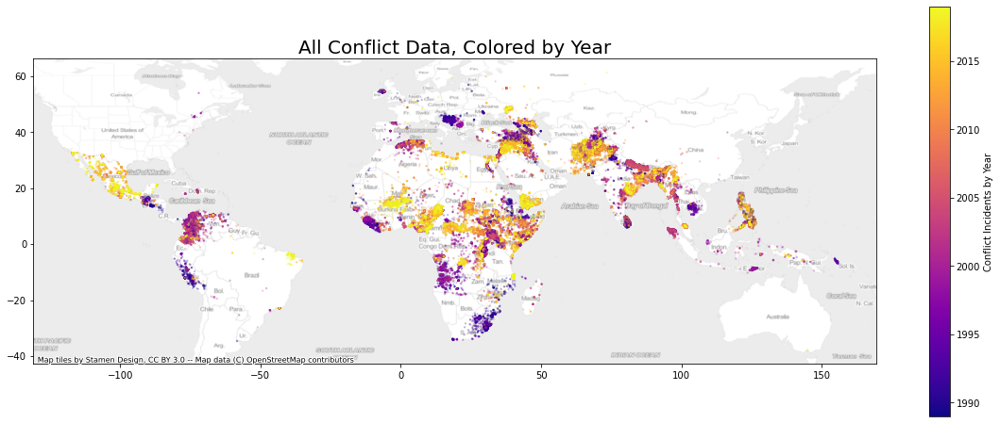

In [336]:
# plot all conflict data, colored by year
fig, ax = plt.subplots(figsize=(20,8))

gdf_conflict.plot(ax=ax, 
                  alpha=0.2, 
                  markersize=2, 
                  column='year',
                  cmap='plasma',
                  legend=True,
                  legend_kwds={
                      'label': "Conflict Incidents by Year"})

plt.title('All Conflict Data, Colored by Year', fontsize=20)

ctx.add_basemap(ax=ax, 
                crs=4326, 
                alpha=0.5,
                source=ctx.providers.Stamen.TonerLite);

Continuous coloring by Year is more instructive than by 5-year period.

Let's proceed to now set the marker size to the total_deaths column.

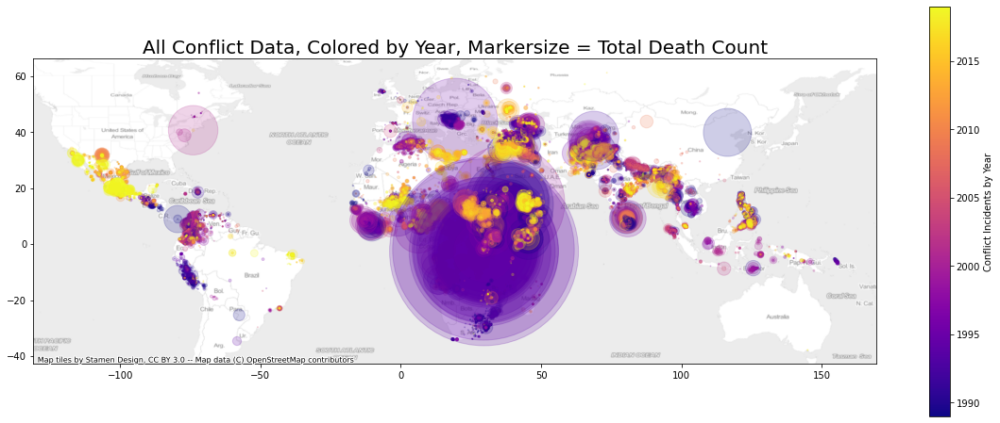

In [377]:
# plot all conflict data, colored by year, with markersize set by total_deaths column
fig, ax = plt.subplots(figsize=(20,8))

gdf_conflict.plot(ax=ax, 
                  alpha=0.2, 
                  markersize='total_deaths', 
                  column='year',
                  cmap='plasma',
                  legend=True,
                  legend_kwds={
                      'label': "Conflict Incidents by Year"})

plt.title('All Conflict Data, Colored by Year, Markersize = Total Death Count', fontsize=20)

ctx.add_basemap(ax=ax, 
                crs=4326, 
                alpha=0.5,
                source=ctx.providers.Stamen.TonerLite);

#plt.savefig('/Users/richard/Desktop/springboard_repo/capstones/capstone-two/reports/figures/Global_Conflict_MarkerSize.png');

### Spatial Conflict Data Findings
- This basic mapping shows some spatial and temporal trends:
 - some areas (such as South Africa and Mexico) have conflict incidents in specific time periods (90s and late 2000s, respectively)
 - other areas have conflict incidents over the entire observed period (such as Middle East, India, parts of Africa)
- Setting markersize to the total death count reveals some clear - and emotionally charged - patterns. We can identify mass death events such as the Rwandan genocide, the Srebrenica genocide, and the Twin Towers attack.
- Most of these extreme incidents occurred before 2005
 
- The map is hard to interpret further due to the high number, density and overlap of data points.
- It may be worth zooming in on a specific geographic location first to get a better sense of how the conflict incidents are playing out in time and space.

### 5.1.2. Conflict Points with Highest Death Counts

We are interested in identifying areas with unusually high death counts, as a way of identfiying areas that see 'more than average conflict'. Let's investigate total_deaths to look at the IQR, 99th quantile, and maximum values.

In [136]:
df_conflict.total_deaths.describe()

count    211879.000000
mean          9.584923
std         196.803044
min           0.000000
25%           1.000000
50%           2.000000
75%           5.000000
max       40000.000000
Name: total_deaths, dtype: float64

In [137]:
# find 99th quantile of total_deaths
df_conflict.total_deaths.quantile(0.99)

80.0

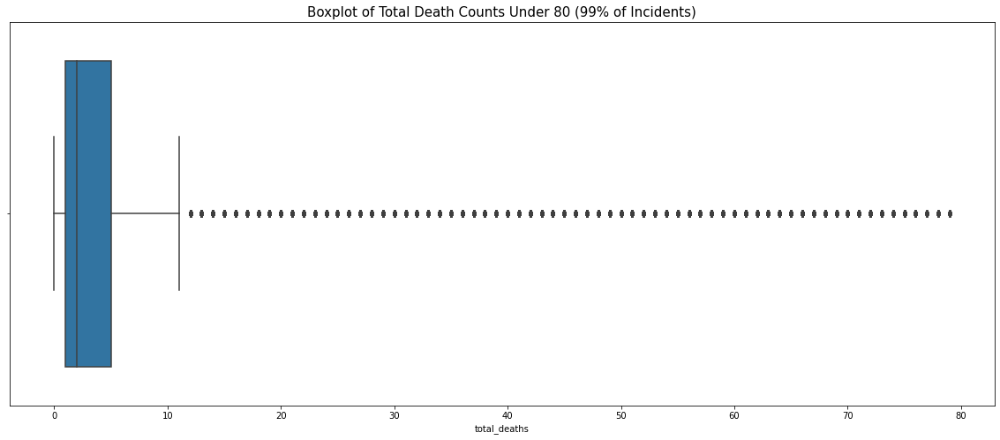

In [138]:
# plot a boxplot of all values below the 99th quantile
fig,ax = plt.subplots(figsize=[20,8])
sns.boxplot(x='total_deaths', data=df_conflict[df_conflict.total_deaths < 80])
plt.title('Boxplot of Total Death Counts Under 80 (99% of Incidents)', fontsize=15);

In [139]:
# get mean of values under 99th quantile
df_conflict.total_deaths[df_conflict.total_deaths < 80].mean()

5.006798731793368

#### Findings
- IQR ranges from 1 to 5 deaths per incident
- we have a maximum value of 40,000
- the 99th quantile lies at 80 deaths per incident
- mean value of total_deaths is 9.58
- mean value of total_deaths under 99th quantile is

Let's proceed to map the incidents that are in the top 1% of total_death counts.

**NOTE TO SELF:** We still need to decide what to do with the outliers in this feature. The top 1% ranges from 81-40,000 (!)

#### Map Top 1% Death Counts

In [140]:
# subset df_conflict to yield only top 1% of death counts
gdf_99 = gdf_conflict[gdf_conflict.total_deaths > gdf_conflict.total_deaths.quantile(0.99)]

In [141]:
# view entries with 15 highest total_deaths counts
gdf_99.nlargest(15, 'total_deaths')

,year,type_of_violence,conflict_id,dyad_id,dyad_name,side_a_id,side_a,side_b_id,side_b,where_prec,...,date_start,date_end,deaths_a,deaths_b,deaths_civilians,deaths_unknown,total_deaths,duration_days,5year_period,geometry
id,,,,,,,,,,,,,,,,,,,,,
40030,1994,3,472,939,Government of Rwanda - Civilians,94,Government of Rwanda,1,Civilians,1,...,1994-04-21,1994-04-21,0,0,40000,0,40000,1,1989-94,POINT (29.64400 -2.61170)
296657,1994,3,472,939,Government of Rwanda - Civilians,94,Government of Rwanda,1,Civilians,2,...,1994-04-10,1994-04-26,0,0,37000,0,37000,17,1989-94,POINT (29.44045 -1.91160)
39595,1994,3,472,939,Government of Rwanda - Civilians,94,Government of Rwanda,1,Civilians,2,...,1994-04-14,1994-04-14,0,0,25000,0,25000,1,1989-94,POINT (29.55910 -2.64650)
39450,1994,3,472,939,Government of Rwanda - Civilians,94,Government of Rwanda,1,Civilians,2,...,1994-04-07,1994-04-15,0,0,24000,0,24000,9,1989-94,POINT (30.10028 -2.16250)
267138,1994,3,472,939,Government of Rwanda - Civilians,94,Government of Rwanda,1,Civilians,1,...,1994-04-19,1994-04-19,0,0,22560,0,22560,1,1989-94,POINT (29.72550 -2.60000)
289326,1994,3,472,939,Government of Rwanda - Civilians,94,Government of Rwanda,1,Civilians,1,...,1994-04-18,1994-04-22,0,0,20154,0,20154,5,1989-94,POINT (29.56640 -2.45200)
34345,1999,1,409,865,Government of Eritrea - Government of Ethiopia,98,Government of Eritrea,97,Government of Ethiopia,2,...,1999-02-23,1999-02-26,10000,5000,0,0,15000,4,1995-99,POINT (37.80306 14.72750)
296929,1994,3,472,939,Government of Rwanda - Civilians,94,Government of Rwanda,1,Civilians,2,...,1994-04-15,1994-04-16,0,0,15000,0,15000,2,1989-94,POINT (30.24850 -1.93500)
298498,1994,3,472,939,Government of Rwanda - Civilians,94,Government of Rwanda,1,Civilians,1,...,1994-04-07,1994-04-30,0,0,14000,0,14000,24,1989-94,POINT (30.06056 -1.95361)


Almost all of the entries with the highest total_deaths values belong to the Rwandan genocide conflict. It may be worth removing this conflict from the dataset as it is such an extreme outlier in terms of death counts.

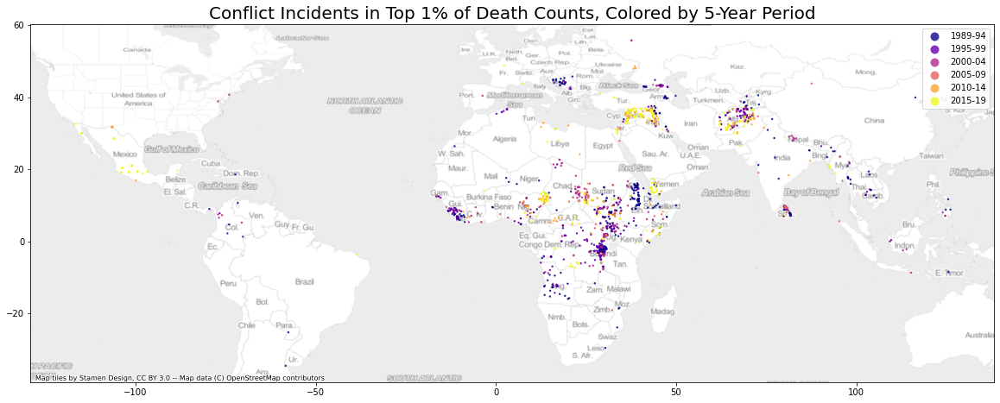

In [142]:
# plot all conflict data in top 1% of total death counts, color by 5-year period
fig, ax = plt.subplots(figsize=(20,8))

gdf_99.plot(ax=ax, 
            alpha=0.8, 
            markersize=2, 
            column='5year_period',
            cmap='plasma',
            legend=True)

plt.title('Conflict Incidents in Top 1% of Death Counts, Colored by 5-Year Period', fontsize=20)

ctx.add_basemap(ax=ax, 
                crs=4326, 
                alpha=0.5,
                source=ctx.providers.Stamen.TonerLite);

Let's see if the pattern looks very different if we exclude the extreme outliers with total_death counts > 1000.

In [143]:
gdf_99[gdf_99.total_deaths > 1000].shape[0], gdf_99[gdf_99.total_deaths > 1000].shape[0] / gdf_99.shape[0] * 100

(112, 5.460750853242321)

That would entail removing 112 entries = 5.46% of the data points from gdf_99.

Let's map the points we would be removing, to make absolutely sure that we are not affecting any large-scale spatial trends by removing them from our analysis.

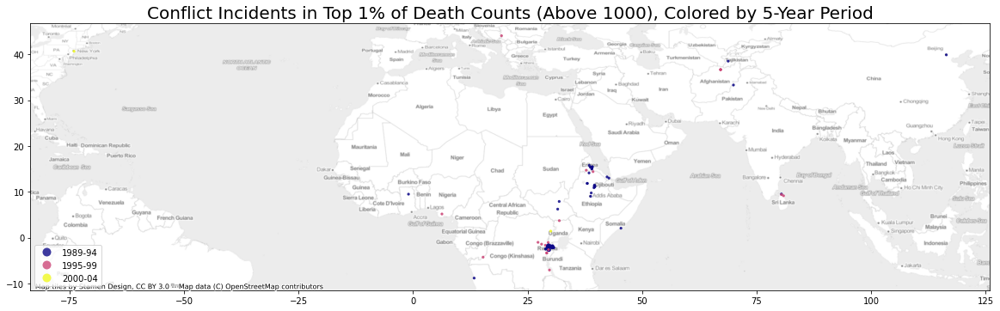

In [144]:
# plot all conflict data in top 1% of total death counts and above 1000, color by 5-year period
fig, ax = plt.subplots(figsize=(20,8))

gdf_99[gdf_99.total_deaths > 1000].plot(ax=ax, 
                                        alpha=0.8, 
                                        markersize=5, 
                                        column='5year_period',
                                        cmap='plasma',
                                        legend=True)

plt.title('Conflict Incidents in Top 1% of Death Counts (Above 1000), Colored by 5-Year Period', fontsize=20)

ctx.add_basemap(ax=ax, 
                crs=4326, 
                alpha=0.5,
                source=ctx.providers.Stamen.TonerLite);

The incidents with extreme outliers in terms of total_deaths values are almost all in areas that many other high death count incidents as well. This means we can remove these outliers without losing the overall geospatial trends we are interested in.

In other words: removing these extreme outliers will not affect which areas show up as having high total_deaths counts. 

In [145]:
# subset gdf_conflict to get bottom 1% quantile
gdf_01 = gdf_conflict[gdf_conflict.total_deaths > gdf_conflict.total_deaths.quantile(0.01)]

# check shape of this gdf
gdf_01.shape[0] / gdf_conflict.shape[0] * 100

91.4658838299218

The bottom 1% of death counts includes more than 90% of the conflict incidents. This means that the areas with highest death counts also include many events with very low death counts.

### 5.1.3. Conflict Points with Longest Duration in Days

We are interested in identifying areas with unusually long conflicts. 

Let's investigate duration_days to look at the IQR, 90th, 95th and 99th quantile, and maximum values.

In [146]:
# get summary statistics of duration_days
gdf_conflict.duration_days.describe()

count    211879.000000
mean          1.706035
std           3.464165
min           1.000000
25%           1.000000
50%           1.000000
75%           1.000000
max          31.000000
Name: duration_days, dtype: float64

In [147]:
# get 90th, 95th, and 99th quantiles
gdf_conflict.duration_days.quantile(.90), gdf_conflict.duration_days.quantile(.95), gdf_conflict.duration_days.quantile(.99)

(2.0, 3.0, 28.0)

In [148]:
# get percentage of values that are equal to 1
gdf_conflict.duration_days[gdf_conflict.duration_days == 1].shape[0] / gdf_conflict.duration_days.shape[0] * 100

85.45490586608395

More than 85% of the conflict incidents happened on a single day. 

Below, we map the conflict incidents in the top 1% of duration_days, i.e. incidents that lasted more than 28 days.

#### Map Top 1% Duration

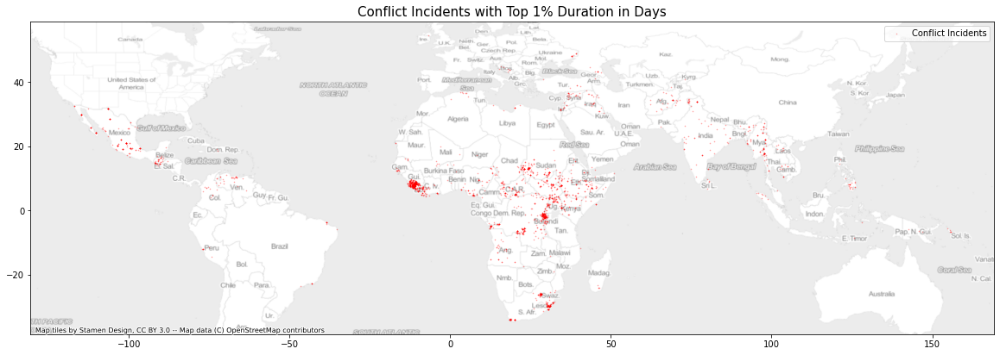

In [149]:
# subset gdf_conflict to get top 1% duration
gdf_days_99 = gdf_conflict[gdf_conflict.duration_days > gdf_conflict.duration_days.quantile(0.99)]

# plot all conflict data in top 1% of duration
ax = gdf_days_99.plot(alpha=0.3, markersize=0.4, color='r', label='Conflict Incidents', figsize=(20,15))
plt.title('Conflict Incidents with Top 1% Duration in Days', fontsize=15)
plt.legend()

ctx.add_basemap(ax=ax, 
                crs=4326, 
                alpha=0.5,
                source=ctx.providers.Stamen.TonerLite);

### Spatial Analysis Conflict Data - Findings
- There is significant geographic spread in the conflict data.
- Both of our 'conflict intensity' measures (total_deaths and duration_days) have a very skewed distribution, with the bulk of values grouped at the low-end and extreme outliers at the high-end.
- Combined, these two factors make it difficult to adequately compare areas on a global level.
- We therefore propose at this stage **to limit our analysis for a first model to a specific geographic area**; one that has seen a lot of conflict, defined as a high number of conflict incidents.
- In Section 6, we will proceed to select a single country as a our first case study.

## 5.2. Spatial Analysis of Climate Data

In this section, we will identify and map:
- the areas with highest TAVG
- the areas with highest PRCP

To do this we will:
1. Import the station metadata file and convert it to a geodataframe
2. Subset df_weather to yield top/bottom quantile of interest
3. Get unique station IDs in those top/bottom quantiles
4. Subset the geodataframe with station metadata using those unique IDs
5. Plot the subset of stations to see where the top/bottom quantiles are located.

For consistency and potential future research, we will begin exploring these on a global level first, before zooming in on our specific country case study in Section 6.

In [150]:
# import dataset with station metadata
df_stations = pd.read_csv('/Users/richard/Desktop/data/processed/station_metadata_gdf.csv', index_col=0)
df_stations

,LATITUDE,LONGITUDE,ELEVATION,NAME,geometry
STATION ID,,,,,
ACW00011604,17.1167,-61.7833,10.1,ST JOHNS COOLIDGE FLD,POINT (-61.7833 17.1167)
ACW00011647,17.1333,-61.7833,19.2,ST JOHNS,POINT (-61.7833 17.1333)
AE000041196,25.3330,55.5170,34.0,SHARJAH INTER. AIRP,POINT (55.517 25.333)
AEM00041194,25.2550,55.3640,10.4,DUBAI INTL,POINT (55.364 25.255)
AEM00041217,24.4330,54.6510,26.8,ABU DHABI INTL,POINT (54.651 24.433)
...,...,...,...,...,...
ZI000067969,-21.0500,29.3670,861.0,WEST NICHOLSON,POINT (29.367 -21.05)
ZI000067975,-20.0670,30.8670,1095.0,MASVINGO,POINT (30.867 -20.067)
ZI000067977,-21.0170,31.5830,430.0,BUFFALO RANGE,POINT (31.583 -21.017)


In [151]:
# convert to geodataframe
crs_stations = {'init': 'epsg:4326'}
gdf_stations = gpd.GeoDataFrame(df_stations, 
                                crs=crs_stations, 
                                geometry=gpd.points_from_xy(df_stations.LONGITUDE, df_stations.LATITUDE))
gdf_stations

,LATITUDE,LONGITUDE,ELEVATION,NAME,geometry
STATION ID,,,,,
ACW00011604,17.1167,-61.7833,10.1,ST JOHNS COOLIDGE FLD,POINT (-61.78330 17.11670)
ACW00011647,17.1333,-61.7833,19.2,ST JOHNS,POINT (-61.78330 17.13330)
AE000041196,25.3330,55.5170,34.0,SHARJAH INTER. AIRP,POINT (55.51700 25.33300)
AEM00041194,25.2550,55.3640,10.4,DUBAI INTL,POINT (55.36400 25.25500)
AEM00041217,24.4330,54.6510,26.8,ABU DHABI INTL,POINT (54.65100 24.43300)
...,...,...,...,...,...
ZI000067969,-21.0500,29.3670,861.0,WEST NICHOLSON,POINT (29.36700 -21.05000)
ZI000067975,-20.0670,30.8670,1095.0,MASVINGO,POINT (30.86700 -20.06700)
ZI000067977,-21.0170,31.5830,430.0,BUFFALO RANGE,POINT (31.58300 -21.01700)


### 5.2.1. Extreme TAVG

Let's identify the parts of the world that have seen warmest observations. We will follow the guidelines set out in [this article](https://iopscience.iop.org/article/10.1088/1748-9326/ab51b6) and define the extreme cases as those situated in the top 0.5% of the data.

In [152]:
# subset climate dataframe to yield top 0.5% warmest observations
df_weather_exT = df_weather[df_weather.TAVG > df_weather.TAVG.quantile(0.995)]
df_weather_exT

PRCP   TAVG   TMAX   TMIN
DATE       STATION ID                            
1920-07-04 AGE00147718   0.0  375.0  430.0  320.0
1920-07-05 LYE00147742   0.0  356.5  436.0  277.0
1920-07-06 AGE00147718   0.0  350.0  410.0  290.0
1920-07-08 AGE00147718   0.0  370.0  430.0  310.0
           LYE00147742   0.0  360.0  450.0  270.0
...                      ...    ...    ...    ...
2020-09-30 PAM00086218   NaN  346.0    NaN  246.0
           QAM00041170   NaN  346.0    NaN  311.0
2020-10-01 AGM00060690   NaN  353.0    NaN  268.0
           PAM00086218   NaN  358.0    NaN    NaN
           SA000040430   NaN  347.0  413.0  275.0

[302840 rows x 4 columns]

In [153]:
df_weather_exT.describe()

,PRCP,TAVG,TMAX,TMIN
count,148337.000000,302840.000000,243250.000000,240110.000000
mean,8.120698,362.495666,431.650146,280.131606
std,112.989838,14.694179,22.339082,26.173437
min,0.000000,345.500000,40.000000,-356.000000
25%,0.000000,351.000000,417.000000,265.000000
50%,0.000000,358.500000,430.000000,280.000000
75%,0.000000,370.000000,445.000000,298.000000
max,7780.000000,505.000000,530.000000,489.000000


The top 0.5% warmest observations have a mean TAVG of 36.2C, well above the world average.

Now let's move on to get the unique IDs of the stations at which these highest TAVG values were recorded.

In [154]:
# turn station id index into column
df_weather_exT.reset_index(level=1, inplace=True)

In [155]:
# get value counts per station
df_weather_exT['STATION ID'].value_counts()

KU000405820    6524
SA000040430    5657
SAW00032502    5200
IRM00040831    4766
NG000061024    4177
               ... 
MXN00025054       1
VEM00080419       1
MXN00030240       1
MXN00020340       1
MXN00030353       1
Name: STATION ID, Length: 1570, dtype: int64

In [156]:
# list unique station IDs
stations_exT = list(df_weather_exT['STATION ID'].unique())

In [157]:
# subset gdf_stations with the list above
gdf_stations_exT = gdf_stations.loc[stations_exT]
gdf_stations_exT

,LATITUDE,LONGITUDE,ELEVATION,NAME,geometry
STATION ID,,,,,
AGE00147718,34.8500,5.7200,125.0,BISKRA,POINT (5.72000 34.85000)
LYE00147742,32.8697,13.2200,25.0,TRIPOLI SIDI EL MESRI,POINT (13.22000 32.86970)
USW00093145,32.7333,-114.6167,73.2,YUMA WB CITY,POINT (-114.61670 32.73330)
USC00041048,32.9544,-115.5581,-30.5,BRAWLEY 2 SW,POINT (-115.55810 32.95440)
USC00041288,32.6881,-115.4644,3.7,CALEXICO 2 NE,POINT (-115.46440 32.68810)
...,...,...,...,...,...
IN003010600,24.7500,92.8000,29.0,SILCHAR,POINT (92.80000 24.75000)
VEM00080472,10.1500,-67.9280,430.1,ARTURO MICHELENA INTL,POINT (-67.92800 10.15000)
COM00080097,7.9280,-72.5120,334.1,CAMILO DAZA,POINT (-72.51200 7.92800)


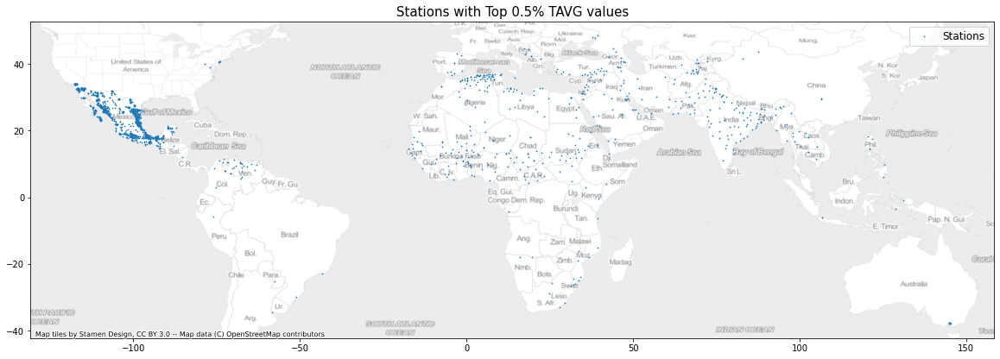

In [158]:
# set up figure
fig, ax = plt.subplots(figsize=[20,10])

# plot
gdf_stations_exT.plot(ax=ax, 
                        label='Stations', 
                        markersize=0.5)

# format
plt.title('Stations with Top 0.5% TAVG values', fontsize=15)
plt.legend(fontsize='large')

# add basemap
ctx.add_basemap(
        ax=ax, 
        crs=4326, 
        alpha=0.5, 
        source=ctx.providers.Stamen.TonerLite);

### Findings

- The top 0.5% of TAVG consists of ~300,000 values, recorded at 1570 different stations.
- This means that many stations are consistently featuring in this top 0.5% over time.
- The mean average temperature for these stations is 36.2C

#### Spatial Patterns
Concentrations of stations recording high TAVG values in:
- Mexico / Southern US
- Pockets in North-Eastern US
- Northern Latin America
- South-western Europe
- Middle East
- Northern Algeria and Libya
- Central Africa
- Northern Afghanistan
- India and Pakistan
- South-eastern Asia

**IMPORTANT NOTE:** These concentrations are skewed by the fact that station coverage is not equal over the entire globe. Places like Mexico/US, Europe and India have vastly higher number of stations compared with places in the Middle East, Africa, and Latin America. For this reason, it is wise not to consider the **density** of stations as indicative of higher temperatures. Instead, we should use this map to identify larger geographic areas (at country or provincial level) that are seeing high average temperatures.

### 5.2.3. Extreme PRCP

We will use the same definition of 'extreme' for PRCP as we did for TAVG: the top 0.5% of the dataset.

In [159]:
# subset climate dataframe to yield top 0.3% wettest observations
df_weather_highP = df_weather[df_weather.PRCP > df_weather.PRCP.quantile(0.995)]

In [160]:
df_weather_highP.shape

(585235, 4)

In [161]:
df_weather_highP.describe()

,PRCP,TAVG,TMAX,TMIN
count,585235.000000,220584.000000,209827.000000,210393.000000
mean,962.414136,236.495426,281.636496,192.633638
std,452.541531,51.524843,59.219314,50.070760
min,631.000000,-235.000000,-200.000000,-333.000000
25%,709.000000,219.500000,256.000000,172.000000
50%,823.000000,250.000000,290.000000,206.000000
75%,1041.000000,268.000000,317.000000,228.000000
max,15240.000000,419.000000,500.000000,378.000000


This leaves us with ~585,000 entries.

The minimum daily precipitation in this extreme subset is 63.1mm. This means our definition of 'extreme precipitation' is in line with [this official classification for rainfall](https://en.wikipedia.org/wiki/Rain#:~:text=Moderate%20rain%20%E2%80%94%20when%20the%20precipitation,mm%20(2.0%20in)%20per%20hour):
- Light rain: < 2.5mm per hour
- Moderate rain: 2.5-10mm per hour
- Heavy rain: 10-50mm per hour
- Violent rain: > 50mm per hour

In [162]:
# turn station id index into column
df_weather_highP.reset_index(level=1, inplace=True)

In [163]:
# get value counts per station
df_weather_highP['STATION ID'].value_counts()

IN014020800    2464
IN014020600    1849
IN009082100    1543
IN014020701    1479
IN012121100    1464
               ... 
MXN00015142       1
BRM00083377       1
US1NJMD0093       1
MXN00024155       1
MXN00013091       1
Name: STATION ID, Length: 9606, dtype: int64

In [164]:
# list unique station IDs
stations_highP = list(df_weather_highP['STATION ID'].unique())

In [165]:
# subset gdf_stations with the list above
gdf_stations_highP = gdf_stations.loc[stations_highP]
gdf_stations_highP

,LATITUDE,LONGITUDE,ELEVATION,NAME,geometry
STATION ID,,,,,
IN001160202,13.6000,80.0300,19.0,TADA,POINT (80.03000 13.60000)
IN010041100,10.2700,77.1500,1088.0,MARAYUR,POINT (77.15000 10.27000)
IN020040300,13.1300,79.9200,13.0,TIRUVALLUR,POINT (79.92000 13.13000)
IN020040600,13.3200,80.2000,11.0,PONNERI,POINT (80.20000 13.32000)
IN020100400,9.2670,79.3000,11.0,PAMBAN,POINT (79.30000 9.26700)
...,...,...,...,...,...
NIM00065271,7.7040,8.6140,113.1,MAKURDI,POINT (8.61400 7.70400)
US1NJES0040,40.8326,-74.2583,161.2,VERONA TWP 0.8 W,POINT (-74.25830 40.83260)
US1NYNY0074,40.7969,-73.9330,6.1,NEW YORK 8.8 N,POINT (-73.93300 40.79690)


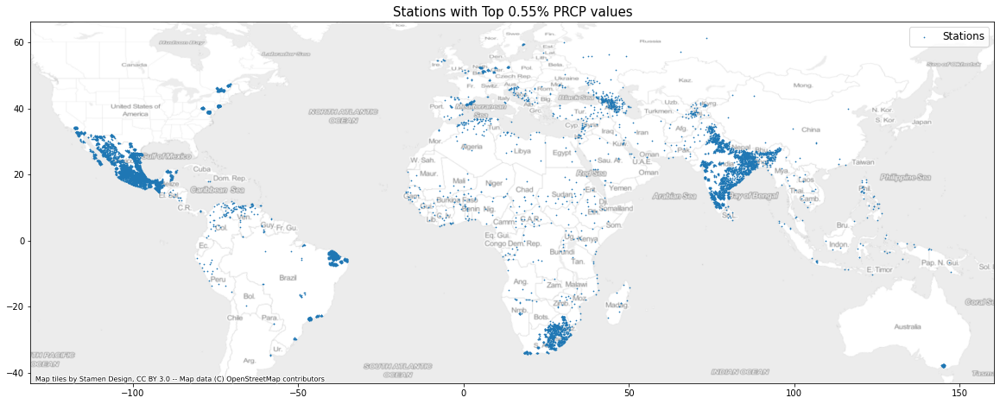

In [166]:
# set up figure
fig, ax = plt.subplots(figsize=[20,10])

# plot
gdf_stations_highP.plot(ax=ax, 
                        label='Stations', 
                        markersize=0.5)

# format
plt.title('Stations with Top 0.55% PRCP values', fontsize=15)
plt.legend(fontsize='large')

# add basemap
ctx.add_basemap(
        ax=ax, 
        crs=4326, 
        alpha=0.5, 
        source=ctx.providers.Stamen.TonerLite);

### Findings

- There are ~585000 observations of extreme precipitation, recorded at 9606 different stations.

#### Spatial Patterns
Concentrations of stations recording extreme PRCP values in:
- Mexico / Southern US
- Pockets in North-Eastern US
- Northern Latin America
- North-eastern Brazil
- Northern Europe
- South-western Europe
- South-eastern Europe
- Middle East
- Northern Algeria and Libya
- Central Africa
- South-eastern Africa
- Northern Afghanistan
- India and Pakistan
- South-eastern Asia

These areas are remarkably similar to the areas that were include in the top 5% of TAVG. The common areas are:
- Mexico / Southern US
- Pockets in North-Eastern US
- Northern Latin America
- South-western Europe
- Middle East
- Northern Algeria and Libya
- Central Africa
- Northern Afghanistan
- India and Pakistan
- South-eastern Asia

**QUESTION FOR FUTURE RESEARCH**: Could these be areas that are seeing extreme weather in general?

### Extreme Weather Findings

- Regions are clearly distinguishable that consistently experience extreme temperature and precipitation levels.
- Because the weather dataset only includes stations within 50km of conflict incidents, we cannot here make a comparison of temperature/precipitation levels vs. presence of conflict.


**IMPORTANT NOTE:** This section has looked at overall extremes in Temperature and Precipitation values. Our hypothesis, however, states that we are interested in areas that have seen significant **change** in climate measure values. To begin to evaluate this **rate of change**, in Section 6 we will calculate the yearly means of the climate measures per station. Then, we will assign each conflict incident its nearest station and use the associated yearly means to compute the rate of change. We will do this **only** for the conflicts in our specific country of analysis.

## 5.3. Global Spatial Analysis of Climate and Conflict

In this section, we will combine our analyses of the global spatial patterns found in the conflict and climate data.

From the maps produced above, we can already eye-ball some areas of interest: areas that show both high conflict incidence and extreme weather measures (high TAVG and high PRCP).

Below, we will map a number of combinations of conflict and climate measures to get a sense of what's happening where:
1. Top 1% Deadliest Conflict Incidents & Top 0.5% Warmest Stations
2. Top 1% Deadliest Conflict Incidents & Top 0.5% Wettest Stations
3. Top 1% Longest Conflict Incidents & Top 0.5% Warmest Stations
4. Top 1% Longest Conflict Incidents & Top 0.5% Wettest Stations

We have already decided to focus our first model on a specific country case study. The analysis in this section, then, is primarily intended to gain a broad understanding of global patterns and to guide future research.

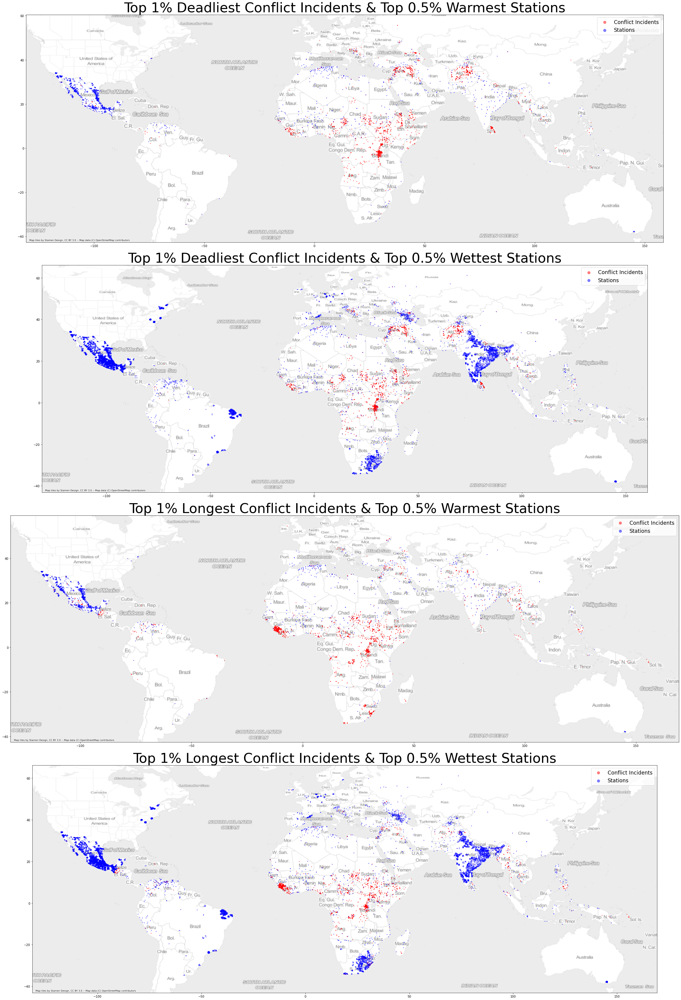

In [376]:
# set up figure
fig, axes = plt.subplots(figsize=[40,60], ncols=1, nrows=4)
plt.subplots_adjust(hspace = 0.1)

# FIGURE 1

# plot top 1% deadliest conflict incidents
gdf_99.plot(ax=axes[0],
            alpha=0.5, 
            markersize=3, 
            color='r', 
            label='Conflict Incidents')

# plot top 0.5% warmest climate stations
gdf_stations_exT.plot(ax=axes[0], 
                      alpha=0.5,
                      color='blue',
                      label='Stations', 
                      markersize=3)

# format
axes[0].set_title('Top 1% Deadliest Conflict Incidents & Top 0.5% Warmest Stations', fontsize=45)
axes[0].legend(markerscale=5, fontsize='xx-large')

# add basemap
ctx.add_basemap(ax=axes[0], 
                crs=4326, 
                alpha=0.5,
                source=ctx.providers.Stamen.TonerLite);

##### 

# FIGURE 2

# plot top 1% deadliest conflict incidents
gdf_99.plot(ax=axes[1],
            alpha=0.5, 
            markersize=3, 
            color='r', 
            label='Conflict Incidents')

# plot top 0.5% wettest climate stations
gdf_stations_highP.plot(ax=axes[1], 
                      alpha=0.5,
                      color='blue',
                      label='Stations', 
                      markersize=3)

# format
axes[1].set_title('Top 1% Deadliest Conflict Incidents & Top 0.5% Wettest Stations', fontsize=45)
axes[1].legend(markerscale=5, fontsize='xx-large')

# add basemap
ctx.add_basemap(ax=axes[1], 
                crs=4326, 
                alpha=0.5,
                source=ctx.providers.Stamen.TonerLite);

##### 

# FIGURE 3

# plot top 1% longest conflict incidents
gdf_days_99.plot(ax=axes[2],
            alpha=0.5, 
            markersize=3, 
            color='r', 
            label='Conflict Incidents')

# plot top 0.5% warmest weather stations
gdf_stations_exT.plot(ax=axes[2], 
                      alpha=0.5,
                      color='blue',
                      label='Stations', 
                      markersize=3)

# format
axes[2].set_title('Top 1% Longest Conflict Incidents & Top 0.5% Warmest Stations', fontsize=45)
axes[2].legend(markerscale=5, fontsize='xx-large')

# add basemap
ctx.add_basemap(ax=axes[2], 
                crs=4326, 
                alpha=0.5,
                source=ctx.providers.Stamen.TonerLite);

##### 

# FIGURE 4

# plot top 1% longest conflict incidents
gdf_days_99.plot(ax=axes[3],
            alpha=0.5, 
            markersize=3, 
            color='r', 
            label='Conflict Incidents')

# plot top 0.5% wettest weather stations
gdf_stations_highP.plot(ax=axes[3], 
                      alpha=0.5,
                      color='blue',
                      label='Stations', 
                      markersize=3)

# format
axes[3].set_title('Top 1% Longest Conflict Incidents & Top 0.5% Wettest Stations', fontsize=45)
axes[3].legend(markerscale=5, fontsize='xx-large')

# add basemap
ctx.add_basemap(ax=axes[3], 
                crs=4326, 
                alpha=0.5,
                source=ctx.providers.Stamen.TonerLite);

#plt.savefig('/Users/richard/Desktop/springboard_repo/capstones/capstone-two/reports/figures/GlobalPatterns.png');


### Findings

On a global level, we see some coincidence of 'extreme conflict incidents' (defined by total death count and/or duration) and 'extreme weather' (warmest and wettest). Plotting this at a global level concentrates too much information in a single figure to really pick out meaningful patterns, however. This further supports our proposed approach to focus our analysis on a single country as an initial case study.

## 5.4. Global Temporal Analysis of Conflict Data

In the section above, we focussed on the spatial distribution of the conflict data points. In this section, we will highlight the temporal patterns of the conflict data.

We will plot time series to see what's happening when and where:
 - What days / years saw highest death counts?
 - What days / years saw most conflict incidents?
 - Has total_deaths increased or decreased over the years in a linear trend?

Again, we have already decided to focus our first model on a specific case study. The analysis in this section, then, is primarily intended to gain a broad understanding of global patterns and to guide future research.

### 5.4.1. Days and Years with Highest Total Death Counts

Let's have a look at the total number of deaths over time. To do this, create a new dataframe with date_start as index.

In [168]:
# import df_conflict from local csv (to avoid having to run entire notebook), parse date columns
df_conflict = pd.read_csv(
    '/Users/richard/Desktop/data/processed/df_conflict_clean_totaldeaths_durationdays.csv', 
    index_col=0,
    parse_dates=['date_start', 'date_end']    
)

In [169]:
df_conflict.head()

,year,type_of_violence,conflict_id,conflict_name,dyad_id,dyad_name,side_a_id,side_a,side_b_id,side_b,...,event_clarity,date_prec,date_start,date_end,deaths_a,deaths_b,deaths_civilians,deaths_unknown,total_deaths,duration_days
id,,,,,,,,,,,,,,,,,,,,,
244657,2017,1,259,Iraq: Government,524,Government of Iraq - IS,116,Government of Iraq,234,IS,...,1,1,2017-07-31,2017-07-31,0,4,0,2,6,1
132140,1989,1,333,Afghanistan: Government,724,Government of Afghanistan - Jam'iyyat-i Islami...,130,Government of Afghanistan,292,Jam'iyyat-i Islami-yi Afghanistan,...,1,3,1989-01-07,1989-01-13,6,0,0,0,6,7
130364,1989,1,333,Afghanistan: Government,724,Government of Afghanistan - Jam'iyyat-i Islami...,130,Government of Afghanistan,292,Jam'iyyat-i Islami-yi Afghanistan,...,2,2,1989-01-15,1989-01-18,0,0,0,4,4,4
130359,1989,1,333,Afghanistan: Government,724,Government of Afghanistan - Jam'iyyat-i Islami...,130,Government of Afghanistan,292,Jam'iyyat-i Islami-yi Afghanistan,...,1,2,1989-01-23,1989-01-24,0,0,0,600,600,2
133883,1989,1,333,Afghanistan: Government,724,Government of Afghanistan - Jam'iyyat-i Islami...,130,Government of Afghanistan,292,Jam'iyyat-i Islami-yi Afghanistan,...,1,3,1989-01-30,1989-02-05,0,0,0,2,2,7


In [170]:
# select only data relevant to our analysis
df_time = df_conflict.iloc[:,[0,22,24,25,26,27,28]].copy()
df_time_columns = df_time.columns
df_time.head()

,year,date_start,deaths_a,deaths_b,deaths_civilians,deaths_unknown,total_deaths
id,,,,,,,
244657,2017,2017-07-31,0,4,0,2,6
132140,1989,1989-01-07,6,0,0,0,6
130364,1989,1989-01-15,0,0,0,4,4
130359,1989,1989-01-23,0,0,0,600,600
133883,1989,1989-01-30,0,0,0,2,2


In [171]:
# set index to date
df_time.set_index('date_start', inplace=True)
df_time.head()

,year,deaths_a,deaths_b,deaths_civilians,deaths_unknown,total_deaths
date_start,,,,,,
2017-07-31,2017,0,4,0,2,6
1989-01-07,1989,6,0,0,0,6
1989-01-15,1989,0,0,0,4,4
1989-01-23,1989,0,0,0,600,600
1989-01-30,1989,0,0,0,2,2


In [172]:
# group entries by date
df_time_grouped = df_time.groupby(
    df_time.index.get_level_values(
        'date_start')).agg({
    'year': 'first',
    'deaths_a': 'sum',
    'deaths_b': 'sum',
    'deaths_civilians': 'sum',
    'deaths_unknown': 'sum',
    'total_deaths': 'sum'  
})

df_time_grouped.head()

,year,deaths_a,deaths_b,deaths_civilians,deaths_unknown,total_deaths
date_start,,,,,,
1989-01-01,1989,5,72,15,32,124
1989-01-02,1989,0,1,0,9,10
1989-01-03,1989,24,8,0,2,34
1989-01-04,1989,2,2,2,1,7
1989-01-05,1989,5,0,1,12,18


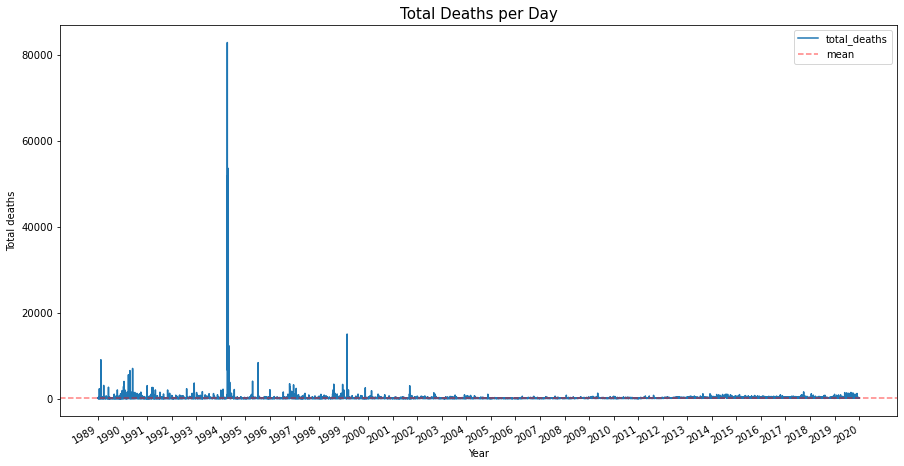

In [173]:
# plot total_deaths

# set up figure
fig, ax = plt.subplots(figsize=[15,8])

# set up xticks
xticks = pd.date_range(datetime.datetime(1989,1,1), datetime.datetime(2020,1,1), freq='YS')

# plot time series
df_time_grouped.total_deaths.plot(ax=ax,xticks=xticks.to_pydatetime())
ax.set_xticklabels([x.strftime('%Y') for x in xticks])
plt.title('Total Deaths per Day', fontsize=15)
plt.xlabel('Year')
plt.ylabel('Total deaths')

# draw horizontal lines
plt.axhline(y=df_time_grouped.total_deaths.mean(), 
            color='red', 
            linestyle='dashed', 
            alpha=0.5, 
            label='mean'
)

# plot legend
plt.legend();

### Findings
We see some clear concentrations of days with unusally high total_deaths counts. Specifcally, let's look at time periods exceeding the 2 standard deviations from the mean:
- Early months of 1989
- Start of 1990 until mid 1991
- Mid 1994
- Mid 1995
- Early 1999

**Main finding: the days with highest death counts occured before 2000.**

These are grouped by day. It may be that certain years saw relatively many days with relatively low death counts - these might still add up to be 'conflict-intensive' years but would not show up as such in this graph. To properly evaluate this, let's resample the grouped dataset by year and plot.

### 5.4.2 Total_Deaths Counts Resampled by Year

In [174]:
# resample by year
df_time_by_year = df_time_grouped.resample(rule='Y', label='left').sum()

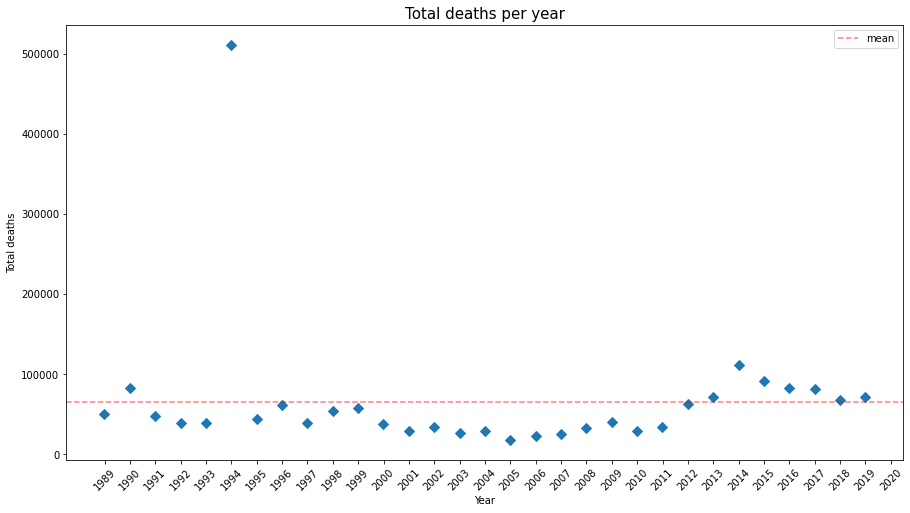

In [175]:
# set up figure
fig, ax = plt.subplots(figsize=[15,8])

# scatterplot of total_deaths
plt.scatter(df_time_by_year.index, df_time_by_year['total_deaths'], marker='D', s=50)

# formatting
plt.title('Total deaths per year', fontsize=15)
plt.xlabel('Year')
plt.ylabel('Total deaths')
plt.xticks(xticks.to_pydatetime(), rotation=45)
ax.set_xticklabels([x.strftime('%Y') for x in xticks])

# draw horizontal lines
plt.axhline(y=df_time_by_year.total_deaths.mean(), color='red', linestyle='dashed', alpha=0.5, label='mean')

# add legend
plt.legend();

### Findings
Interesting. Taken as **years** we see something very different.

The following years stand out as 'above average' in terms of total death count:
- 1990
- 1994
- 2013
- 2014
- 2015
- 2016
- 2017


### 5.4.3. Days and Years with Highest Number of Conflict Incidents

Let's investigate the days and years with the highest number of conflict incidents, regardless of their characteristics.

In [176]:
# start with df_time, which has date_start as datetime index
df_time.head()

,year,deaths_a,deaths_b,deaths_civilians,deaths_unknown,total_deaths
date_start,,,,,,
2017-07-31,2017,0,4,0,2,6
1989-01-07,1989,6,0,0,0,6
1989-01-15,1989,0,0,0,4,4
1989-01-23,1989,0,0,0,600,600
1989-01-30,1989,0,0,0,2,2


In [177]:
# add count column to df_time
df_time['count'] = 1
df_time.head()

,year,deaths_a,deaths_b,deaths_civilians,deaths_unknown,total_deaths,count
date_start,,,,,,,
2017-07-31,2017,0,4,0,2,6,1
1989-01-07,1989,6,0,0,0,6,1
1989-01-15,1989,0,0,0,4,4,1
1989-01-23,1989,0,0,0,600,600,1
1989-01-30,1989,0,0,0,2,2,1


In [178]:
# group entries by date and sum the 'count' column
df_time_counts = df_time.groupby(
    df_time.index.get_level_values(
        'date_start')).agg({
    'count': 'sum',
    'year': 'first'
})

df_time_counts.sample(10)

,count,year
date_start,,
1992-12-07,8,1992
2005-11-16,14,2005
2012-10-14,45,2012
1993-12-04,4,1993
2006-08-06,24,2006
2012-08-02,68,2012
2018-12-01,46,2018
1989-02-18,10,1989
1999-03-10,7,1999


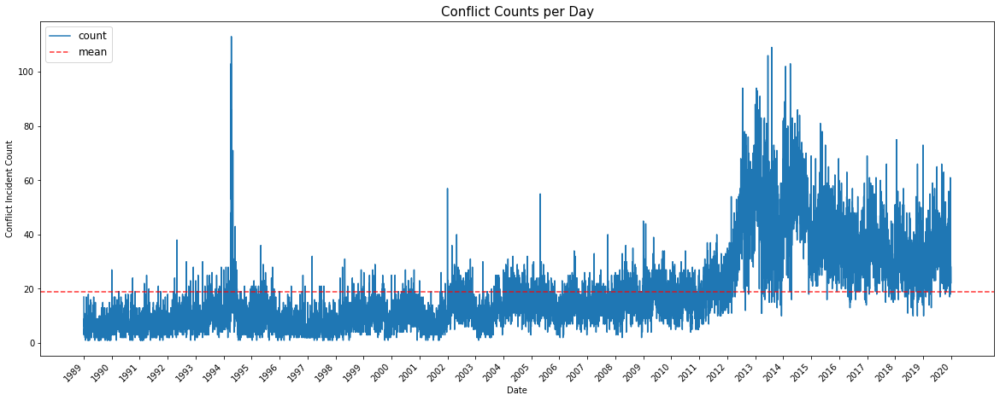

In [179]:
# set up figure
fig, ax = plt.subplots(figsize=[20,8])

# plot dataframe
df_time_counts['count'].plot(ax=ax)

# formatting
plt.title('Conflict Counts per Day', fontsize=15)
plt.xlabel('Date')
plt.ylabel('Conflict Incident Count')
plt.xticks(xticks.to_pydatetime(), rotation=45)
ax.set_xticklabels([x.strftime('%Y') for x in xticks])

# draw horizontal line for mean
plt.axhline(y=df_time_counts['count'].mean(), color='red', linestyle='dashed', alpha=0.8, label='mean')

# place legend
plt.legend(loc='upper left', fontsize='large');

### Findings

- The number of conflict incidents per day is increasing over the past thirty years.
- Significant increase, above the mean in:
 - early 1994
 - mid-2011 until present

### 5.4.4. Mapping Global Temporal Patterns

To get a feel of where these temporal patterns are playing out in space, let's create some maps with subsets of gdf_conflict based on particular years.

Based on both total_death counts and incident counts, the following years score the highest:
   - 1989
   - 1994
   - mid2011 until now

In [180]:
# create list of years to iterate over
years = [1989, 1994, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]

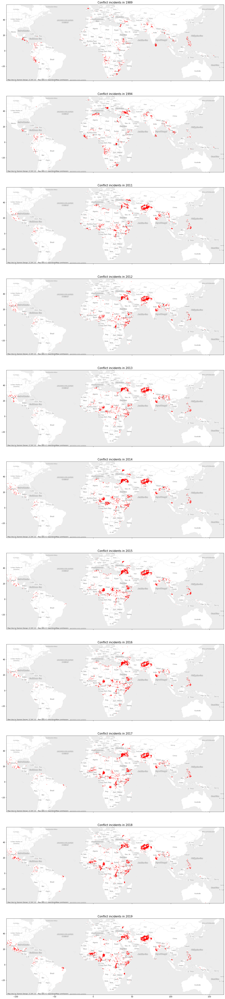

In [181]:
# map conflict incidents for all relevant years
fig,axes = plt.subplots(len(years), 1, figsize=[40,100], sharex=True, sharey=True)

for year in years:
    gdf_conflict[gdf_conflict.year == year].plot(
        ax=axes[years.index(year)], 
        figsize=(20,10), 
        markersize=0.4, color='red')
    
    axes[years.index(year)].set_title('Conflict incidents in ' + str(year), fontsize=15)
    
    ctx.add_basemap(
        ax=axes[years.index(year)], 
        crs=4326, 
        alpha=0.5, 
        source=ctx.providers.Stamen.TonerLite);

### Temporal Patterns Findings

- We see a clear overall increase in number of conflict incidents over time
- We can also clearly distinguish the increase of conflicts in the 3 countries with most conflict incidents overall: Syria, Afghanistan and India.

We include these maps here to guide future research. 

In the next section, we proceed with the core project of this notebook by selecting a single country to serve as a first case study.

# 6. Country Case Study

We have decided to focus the analysis of our first model on a specific geographic area. We do this in order to:
- maintain a clear grasp of the data at a smaller unit of analysis
- account for the geopolitical specificity of each conflict

This section will:

1. Select an appropriate country for our first case study based on:
 - availability of conflict data
 - availability of climate data
 

2. Map out the conflict incidents in the selected country:
 - all incidents
 - incidents with top total_deaths and duration_days


3. Perform a spatial join of each conflict incident with its nearest weather station


4. Calculate relevant rates of change in climate measures for each station included


5. Map out conflict incidents in areas that have seen significant rates of change

## 6.1. Case Study Selection

Let's look at the 3 countries with the highest number of conflict incidents to evaluate whether one of them could serve as our first case study.

### 6.1.1. Syria

Syria featured as the country with the singlemost number of conflict incidents: 57697.

Let's subset our df_conflict to include only these incidents and then map them out.

In [182]:
# subset df_conflict
gdf_syria = gdf_conflict[gdf_conflict.country == 'Syria']
gdf_syria.shape

(57697, 31)

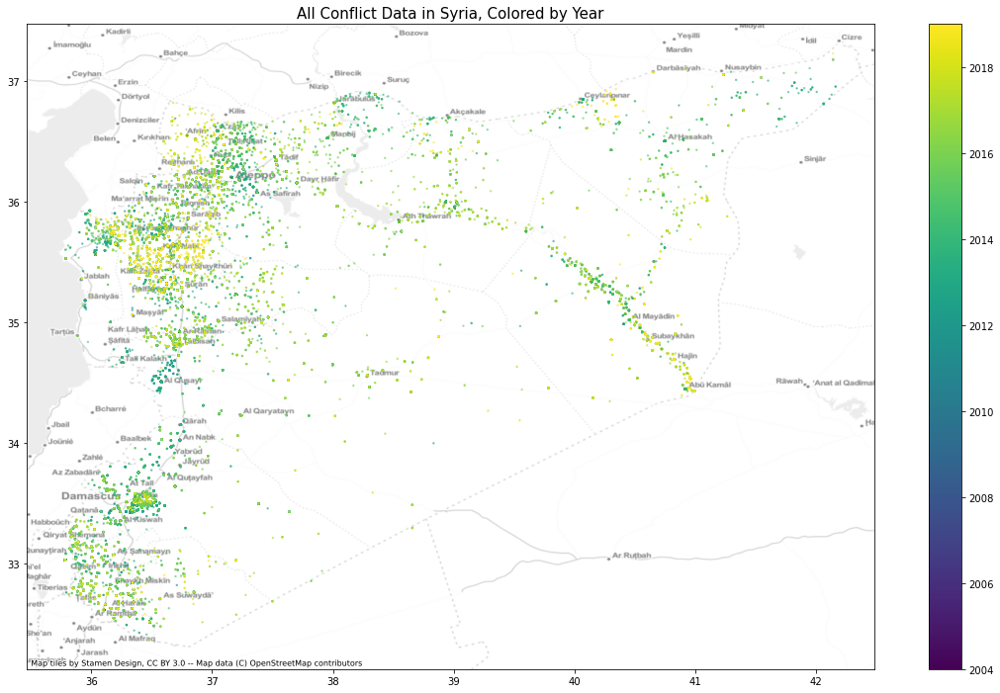

In [183]:
# plot all conflict data in syria, colored by year
fig, ax = plt.subplots(figsize=(20,12))

gdf_syria.plot(ax=ax,
               alpha=0.5, 
               markersize=2, 
               column='year',
               legend=True)

plt.title('All Conflict Data in Syria, Colored by Year', fontsize=15)

#add basemap
ctx.add_basemap(
        ax=ax, 
        crs=4326, 
        alpha=0.5, 
        source=ctx.providers.Stamen.TonerLite);

### Findings
- Clear concentrations of incidents along the entire western border of the country, with the exception of Tartus (President Assad's hometown)
- Clear concentrations of incidents along the northern border
- Clear concentrations of incidents near major cities such as Damascus and Aleppo
- Very few incidents in the central and southern part of the country
- In the eastern part of the country, conflicts grouped along linear lines: rivers (Euphrates) and major highways.

Next, let's investigate the availability and quality of climate data in Syria:

In [184]:
# create column in gdf_stations containing Station IDs
gdf_stations['ID'] = gdf_stations.index
gdf_stations

,LATITUDE,LONGITUDE,ELEVATION,NAME,geometry,ID
STATION ID,,,,,,
ACW00011604,17.1167,-61.7833,10.1,ST JOHNS COOLIDGE FLD,POINT (-61.78330 17.11670),ACW00011604
ACW00011647,17.1333,-61.7833,19.2,ST JOHNS,POINT (-61.78330 17.13330),ACW00011647
AE000041196,25.3330,55.5170,34.0,SHARJAH INTER. AIRP,POINT (55.51700 25.33300),AE000041196
AEM00041194,25.2550,55.3640,10.4,DUBAI INTL,POINT (55.36400 25.25500),AEM00041194
AEM00041217,24.4330,54.6510,26.8,ABU DHABI INTL,POINT (54.65100 24.43300),AEM00041217
...,...,...,...,...,...,...
ZI000067969,-21.0500,29.3670,861.0,WEST NICHOLSON,POINT (29.36700 -21.05000),ZI000067969
ZI000067975,-20.0670,30.8670,1095.0,MASVINGO,POINT (30.86700 -20.06700),ZI000067975
ZI000067977,-21.0170,31.5830,430.0,BUFFALO RANGE,POINT (31.58300 -21.01700),ZI000067977


In [185]:
# subset gdf_stations for stations in Syria
gdf_stations_syria = gdf_stations[gdf_stations['ID'].str.startswith('SY')]
gdf_stations_syria.shape

(12, 6)

There are only 12 stations in the whole of Syria. That might not meet the spatial granularity we're looking for.

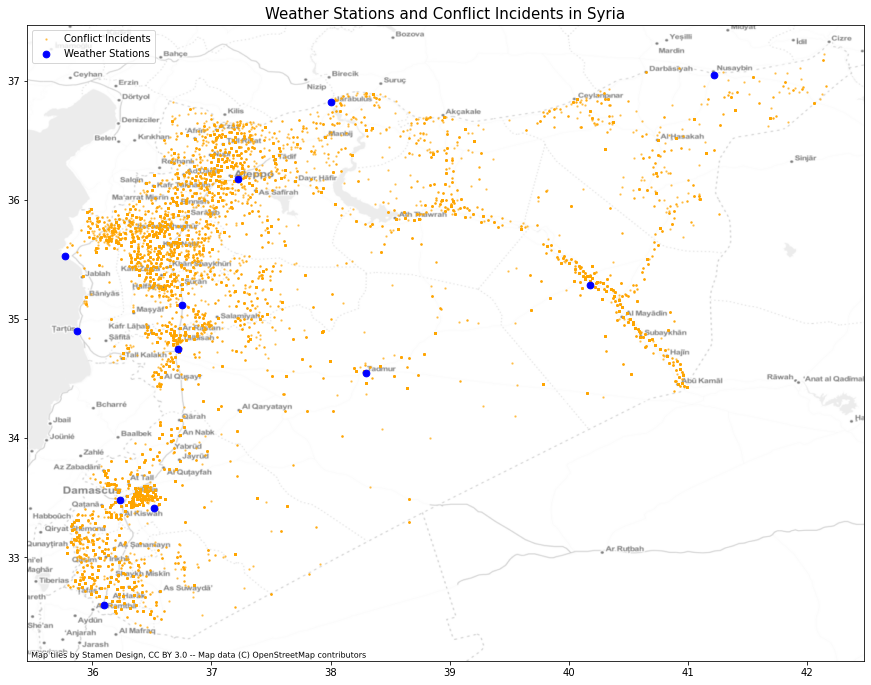

In [186]:
# let's map them to evaluate spread, adding the conflict points as well
fig, ax = plt.subplots(figsize=[15,12])

gdf_syria.plot(ax=ax,
               alpha=0.5, 
               color='orange',
               markersize=2,
               label='Conflict Incidents')

gdf_stations_syria.plot(ax=ax,
                        markersize=45,
                        color='blue',
                        label='Weather Stations')

plt.title('Weather Stations and Conflict Incidents in Syria', fontsize=15)
plt.legend()

#add basemap
ctx.add_basemap(
        ax=ax, 
        crs=4326, 
        alpha=0.5, 
        source=ctx.providers.Stamen.TonerLite);


The 12 stations are relatively well spread-out through the country. But the distances between some of them is very large. This means conflicts may be assigned a weather station that is far away from them, i.e. potentially not representative of their climactic region.

For this reason, Syria might not be the best country to use as case study.

### 6.1.2. Afghanistan

Let's move to the country with the second-highest count of conflict incidents: Afghanistan. Let's begin straightaway by inspecting the number of weather stations in the country.

In [187]:
# subset gdf_stations for stations in Afghanistan
gdf_stations_afghanistan = gdf_stations[gdf_stations.ID.str.startswith('AF')]
gdf_stations_afghanistan

,LATITUDE,LONGITUDE,ELEVATION,NAME,geometry,ID
STATION ID,,,,,,
AF000040930,35.317,69.017,3366.0,NORTH-SALANG,POINT (69.01700 35.31700),AF000040930
AFM00040938,34.210,62.228,977.2,HERAT,POINT (62.22800 34.21000),AFM00040938
AFM00040948,34.566,69.212,1791.3,KABUL INTL,POINT (69.21200 34.56600),AFM00040948
AFM00040990,31.500,65.850,1010.0,KANDAHAR AIRPORT,POINT (65.85000 31.50000),AFM00040990


Afghanistan has only 4 stations. Not even worth considering.

### 6.1.3. India

Let's move on to the third potential case study: India

In [188]:
# subset gdf_stations for stations in india
gdf_stations_india = gdf_stations[gdf_stations.ID.str.startswith('IN')]
gdf_stations_india.shape

(3807, 6)

That looks like a much better number: 3807 weather stations.

Let's map them to evaluate geographic spread.

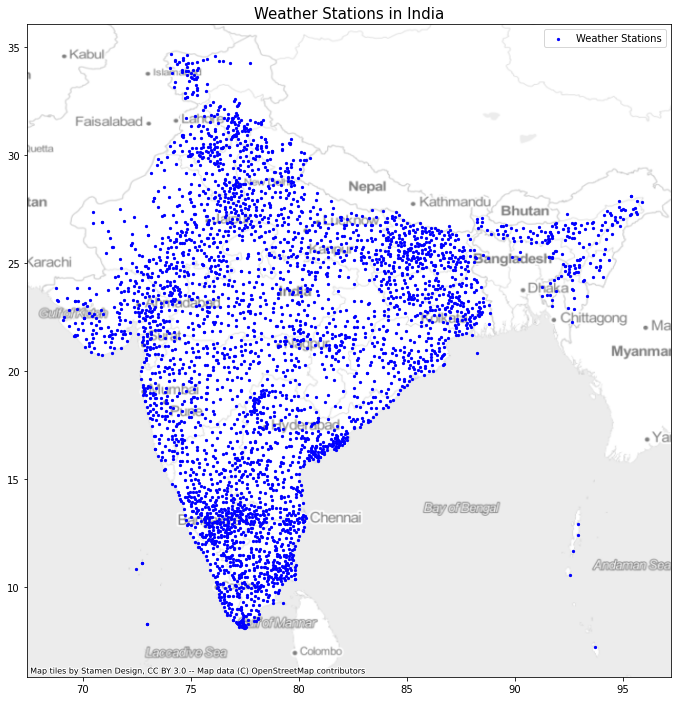

In [189]:
# let's map them to evaluate spread
fig, ax = plt.subplots(figsize=[15,12])

gdf_stations_india.plot(ax=ax,
                        markersize=5,
                        color='blue',
                        label='Weather Stations')

plt.title('Weather Stations in India', fontsize=15)
plt.legend()

#add basemap
ctx.add_basemap(
        ax=ax, 
        crs=4326, 
        alpha=0.5, 
        source=ctx.providers.Stamen.TonerLite);

Let's map the conflict incidents in India to compare locations.

In [190]:
# subset gdf_conflict to get all conflicts in India
gdf_india = gdf_conflict[gdf_conflict.country == "India"]
gdf_india.shape

(15090, 31)

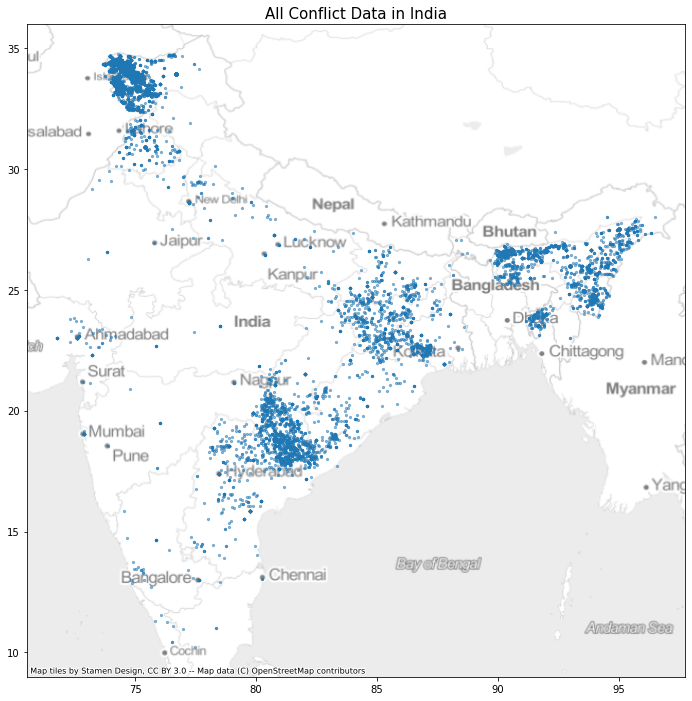

In [191]:
# plot all conflict data in india, colored by year
fig, ax = plt.subplots(figsize=(20,12))

gdf_india.plot(ax=ax,
               alpha=0.5, 
               markersize=5,
               legend=True)

plt.title('All Conflict Data in India', fontsize=15)

#add basemap
ctx.add_basemap(
        ax=ax, 
        crs=4326, 
        alpha=0.5, 
        source=ctx.providers.Stamen.TonerLite);

India offers a much better density of weather stations. This will get us better granularity in terms of local climate differences that might be correlated with differences in conflict.

For this reason **we select INDIA as the case study for which to build our first model.**

## 6.2. Mapping Conflicts in India
Let's proceed to map conflicts in India by our conflict intensity measures: total_deaths and duration_days.

### 6.2.1. All Conflicts in India

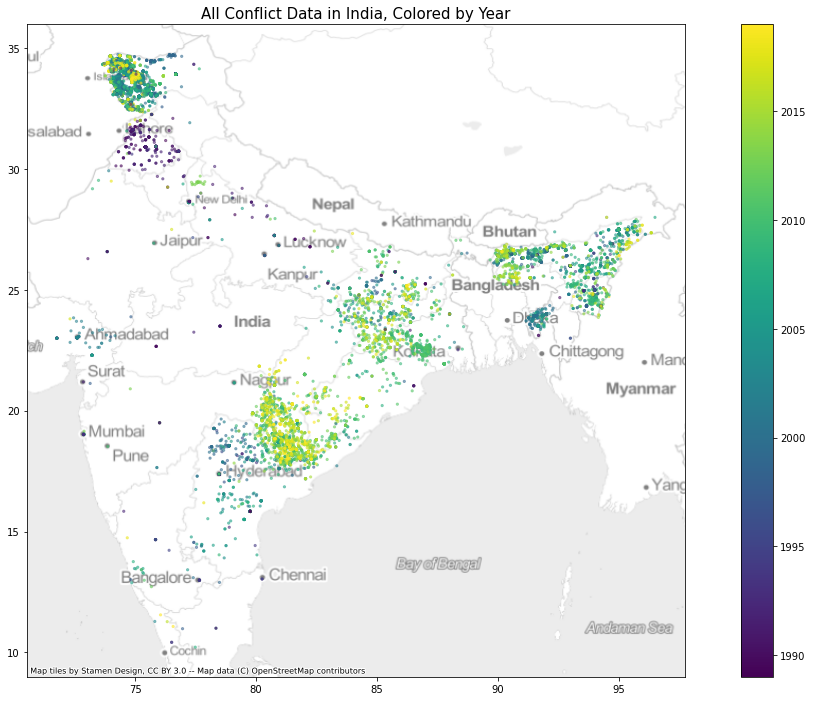

In [192]:
# plot all conflict data in india, colored by year
fig, ax = plt.subplots(figsize=(20,12))

gdf_india.plot(ax=ax,
               alpha=0.5, 
               markersize=5, 
               column='year',
               legend=True)

plt.title('All Conflict Data in India, Colored by Year', fontsize=15)

#add basemap
ctx.add_basemap(
        ax=ax, 
        crs=4326, 
        alpha=0.5, 
        source=ctx.providers.Stamen.TonerLite);

### Findings
We can spot 6 distinct clusters of conflicts:
1. In Kashmir, along the Northernmost border with Pakistan (early 2000s until 2020)
2. In Punjab, along Northern border with Pakistan (early 1990s)
3. Between Nagpur and Hyderabad (late 90s until 2020)
4. Between Kolkata and Kanpur (mid 2000s until 2020)
5. In the area between Bhutan and Bangladesh (early 2000s until 2020)
6. Along easternmost border with Myanmar (late 90s until mid 2000s)
7. Along western border with Bangladesh (early to mid 2000s)

At this scale, the clusters do not reveal any distinct patterns, although these might appear if we were to zoom in more closely.

### 6.2.2. Conflicts with Highest Death Counts

Below, let's map out the conflicts with the highest death counts.

In [193]:
# subset india gdf to get top 1% total_death counts
gdf_india_topdeath = gdf_india[gdf_india.total_deaths > gdf_india.total_deaths.quantile(0.99)]

In [194]:
gdf_india_topdeath.shape

(147, 31)

In [195]:
gdf_india_topdeath.total_deaths.describe()

count    147.000000
mean      44.666667
std       35.943322
min       22.000000
25%       25.000000
50%       32.000000
75%       44.500000
max      212.000000
Name: total_deaths, dtype: float64

In [196]:
gdf_india.total_deaths.describe()

count    15090.000000
mean         2.814513
std          6.058323
min          0.000000
25%          1.000000
50%          1.000000
75%          3.000000
max        212.000000
Name: total_deaths, dtype: float64

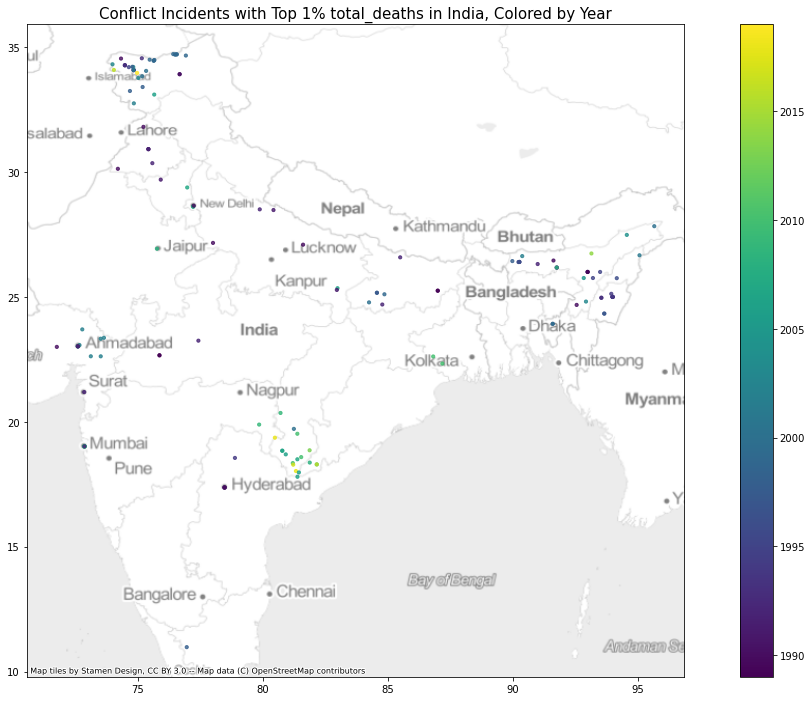

In [197]:
# plot top 1% total_deaths conflict data in india, colored by year
fig, ax = plt.subplots(figsize=(20,12))

gdf_india_topdeath.plot(ax=ax,
               alpha=0.8, 
               markersize=10, 
               column='year',
               legend=True)

plt.title('Conflict Incidents with Top 1% total_deaths in India, Colored by Year', fontsize=15)

#add basemap
ctx.add_basemap(
        ax=ax, 
        crs=4326, 
        alpha=0.5, 
        source=ctx.providers.Stamen.TonerLite);

### Findings
- The most deadly conflict incidents seem to be random subselection of the entire set of India conflict data points; they follow a similar geographic pattern.

### 6.2.3. Conflicts with Longest Duration

Below, let's map out the conflicts in India with the longest duration.

In [198]:
# subset india gdf to get top 1% duration_days
gdf_india_topduration = gdf_india[gdf_india.duration_days > gdf_india.duration_days.quantile(0.99)]

In [199]:
gdf_india_topduration.shape

(151, 31)

In [200]:
gdf_india_topduration.duration_days.describe()

count    151.000000
mean      21.569536
std        9.468199
min        8.000000
25%       12.000000
50%       26.000000
75%       31.000000
max       31.000000
Name: duration_days, dtype: float64

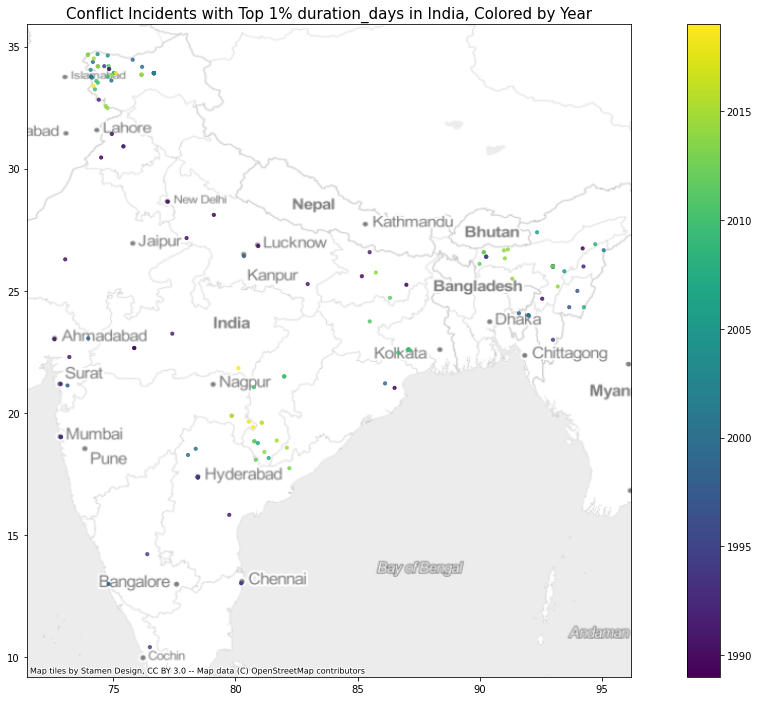

In [201]:
# plot top 1% duration_days conflict data in india, colored by year
fig, ax = plt.subplots(figsize=(20,12))

gdf_india_topduration.plot(ax=ax,
               alpha=0.8, 
               markersize=10, 
               column='year',
               legend=True)

plt.title('Conflict Incidents with Top 1% duration_days in India, Colored by Year', fontsize=15)

#add basemap
ctx.add_basemap(
        ax=ax, 
        crs=4326, 
        alpha=0.5, 
        source=ctx.providers.Stamen.TonerLite);

### Findings
- Again, these points seem to follow a similar distribution to the overall dataset for India.
- It is very possible that many of the points in the top 1% of total_deaths and duration_days overlap, as death count may be expected to increase as duration increases.

## 6.3. Matching Stations to Conflict Incidents

Let's move on to match each conflict incident with its nearest weather station inside India. 

To do this, we will:
- convert our geodataframes to EPSG3857 projection; measured in meters rather than degrees.
- write a function that runs a SciPy spatial cKDTree classifier to get the nearest neighbor.
- create a new gdf containing all the data from the conflict dataframe PLUS the nearest Station ID and the distance to that station in meters.

This section uses a custom function *ckdnearest* adapted from [this Stack Exchange post](https://gis.stackexchange.com/questions/222315/geopandas-find-nearest-point-in-other-dataframe).

In [202]:
# convert india gdfs to meters EPSG
gdf_india_mtr = gdf_india.to_crs(epsg = 3857)
gdf_stations_india_mtr = gdf_stations_india.to_crs(epsg = 3857)

In [203]:
# define function that will find nearest station for each conflict incident
def ckdnearest(gdfA, gdfB):
    '''
    find the nearest station for every conflict incident using a cKDTree classifier, and 
    return the corresponding STATION ID value as well as the distance between incident and station
    
    gdfA: gdf containing conflict incidents
    gdfB: gdf containing stations'''
    
    # transform geometry columns into numpy arrays
    nA = np.array(list(gdfA.geometry.apply(lambda x: (x.x, x.y))))
    nB = np.array(list(gdfB.geometry.apply(lambda x: (x.x, x.y))))
    
    # instantiate and query model
    btree = cKDTree(nB)
    dist, idx = btree.query(nA, k=1)
    
    # concatenate neighbours and distance to gdf_india
    gdf = pd.concat(
        [gdfA.reset_index(drop=False), 
         gdfB.iloc[idx, gdfB.columns == 'ID'].reset_index(drop=True),
         pd.Series(dist, name='distance')], 
        axis=1)
    
    return gdf

In [334]:
gdf_india_mtr.shape

(15090, 36)

We'll now run this function on our dataframe of 15090 rows.

In [333]:
%%time 
# apply function to india gdfs
gdf_india_mtr = ckdnearest(gdf_india_mtr, gdf_stations_india_mtr)
gdf_india_mtr.head(3)

CPU times: user 656 ms, sys: 131 ms, total: 787 ms
Wall time: 974 ms


,id,year,type_of_violence,conflict_id,dyad_id,dyad_name,side_a_id,side_a,side_b_id,side_b,...,deaths_civilians,deaths_unknown,total_deaths,duration_days,5year_period,geometry,nearest_station,distance,ID,distance
0,59218,1990,1,218,422,Government of India - Government of Pakistan,141,Government of India,142,Government of Pakistan,...,0,0,0,1,1989-94,POINT (8248774.268 3997960.298),IN008070100,2598.137480,IN008070100,2598.137480
1,54839,1991,1,218,422,Government of India - Government of Pakistan,141,Government of India,142,Government of Pakistan,...,0,50,50,9,1989-94,POINT (8534494.665 4017618.324),IN008060300,48350.957848,IN008060300,48350.957848
2,54870,1991,1,218,422,Government of India - Government of Pakistan,141,Government of India,142,Government of Pakistan,...,0,0,3,1,1989-94,POINT (8534494.665 4017618.324),IN008060300,48350.957848,IN008060300,48350.957848


In [205]:
# set index back to id column
gdf_india_mtr.set_index('id', inplace=True)

In [206]:
# change column name for station ID to 'nearest_station'
gdf_india_mtr.rename(columns={
    'ID': 'nearest_station'}, inplace=True)
gdf_india_mtr.head()

,year,type_of_violence,conflict_id,dyad_id,dyad_name,side_a_id,side_a,side_b_id,side_b,where_prec,...,deaths_a,deaths_b,deaths_civilians,deaths_unknown,total_deaths,duration_days,5year_period,geometry,nearest_station,distance
id,,,,,,,,,,,,,,,,,,,,,
59218,1990,1,218,422,Government of India - Government of Pakistan,141,Government of India,142,Government of Pakistan,3,...,0,0,0,0,0,1,1989-94,POINT (8248774.268 3997960.298),IN008070100,2598.137480
54839,1991,1,218,422,Government of India - Government of Pakistan,141,Government of India,142,Government of Pakistan,4,...,0,0,0,50,50,9,1989-94,POINT (8534494.665 4017618.324),IN008060300,48350.957848
54870,1991,1,218,422,Government of India - Government of Pakistan,141,Government of India,142,Government of Pakistan,4,...,3,0,0,0,3,1,1989-94,POINT (8534494.665 4017618.324),IN008060300,48350.957848
59616,1991,1,218,422,Government of India - Government of Pakistan,141,Government of India,142,Government of Pakistan,4,...,0,1,0,0,1,1,1989-94,POINT (8534494.665 4017618.324),IN008060300,48350.957848
54879,1991,1,218,422,Government of India - Government of Pakistan,141,Government of India,142,Government of Pakistan,2,...,6,6,0,0,12,1,1989-94,POINT (8233917.346 4118678.342),IN008119902,12638.441474


In [207]:
# get summary statistics of distance column
gdf_india_mtr['distance'].describe()

count     15090.000000
mean      15646.262186
std       13110.186899
min           0.000000
25%        5742.963803
50%       13079.527644
75%       21556.074157
max      110871.961528
Name: distance, dtype: float64

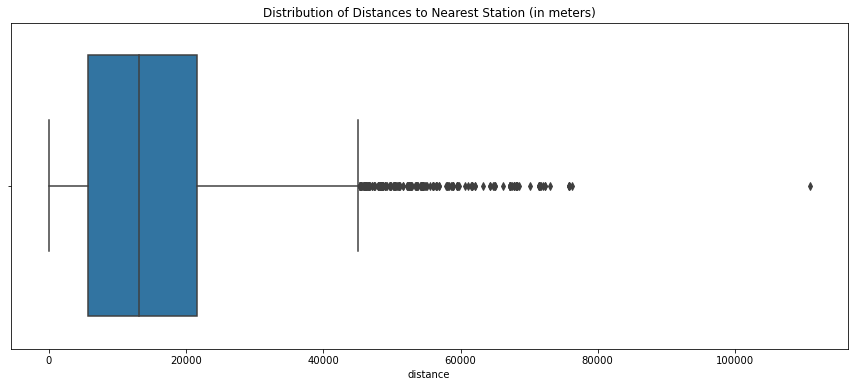

In [208]:
# create boxplot
fig, ax = plt.subplots(figsize=[15,6])
sns.boxplot(x='distance', data=gdf_india_mtr)
plt.title('Distribution of Distances to Nearest Station (in meters)');

In [209]:
gdf_india_mtr['distance'].quantile(0.99)

51684.02778935018

We have some outliers: conflict incidents with stations that are more than 50km away. This is not going to give us a very representative picture of what's going on in terms of climate at a local level. Let's now proceed to remove any rows for which 'distance' > 50000 (50km). This will mean removing ~1% of the data for India.

In [210]:
india = gdf_india_mtr[gdf_india_mtr['distance'] <= 50000].copy()
india.shape

(14908, 33)

In [211]:
# # export this dataframe to local csv for future reference
# india.to_csv('/Users/richard/Desktop/data/processed/gdf_conflict_india_mtr_with_stations_within_50km.csv')

## 6.4. Computing Climate Means for Conflict Incidents

Now that we have a nearest station for each conflict incident we can work towards creating a single dataframe that contains both conflict and climate data. Specifically, in this section we will compute for each conflict incident:
- the average temperature and precipitation level during the incident
- the average temperature and precipitation level during the month preceding the start of the incident
- the average temperature and precipitation level during the 1, 5, 10, 25, 50, and 75-year intervals preceding the incident
- whether or not it was raining during the incident

- mean PRCP value for the year in which the conflict took place
- mean PRCP for the 5-year period preceding the conflict
- mean PRCP for the 15-year period preceding the conflict
- mean PRCP for the 25-year period preceding the conflict
- mean PRCP for the 50-year period preceding the conflict
- mean PRCP for the 75-year period preceding the conflict
- mean PRCP for all years available (1920-2020)

For computational efficiency, we will first subset our big weather dataframe (df_weather) to include only the records for the weather stations currently included in our India dataframe.

### 6.4.1. Get Weather Data for India Only

In [25]:
# get unique station IDs from india dataframe
india_stations = india.nearest_station.unique()

In [26]:
len(india_stations)

743

**NOTE:** The India dataframe contains 743 of the 3807 weather stations in India. These are the weather stations nearest to the conflict incidents included in the dataframe.

**POTENTIAL FUTURE RESEARCH** Compare data from this set of stations to stations in India that are not within 50km of any conflict incidents.

In [214]:
# subset df_weather with those IDs
df_weather_india = df_weather.loc[pd.IndexSlice[:,india_stations], :]

In [215]:
# verify
df_weather_india.index.get_level_values(1).unique()

Index(['IN001010200', 'IN001020300', 'IN001020500', 'IN001020700',
       'IN001030501', 'IN001040100', 'IN001040500', 'IN001040501',
       'IN001040701', 'IN001050700',
       ...
       'IN008011300', 'IN002010100', 'IN004121601', 'IN017070800',
       'IN023143400', 'INM00042071', 'IN018071700', 'IN004061500',
       'IN003051800', 'IN019052800'],
      dtype='object', name='STATION ID', length=743)

In [216]:
# # export to local csv
# df_weather_india.to_csv('/Users/richard/Desktop/data/processed/df_weather_india_near_conflict_incidents.csv')

### 6.4.2. Compute yearly climate mean for year of conflict incident

In this section we will add the following features to our main dataframe:
- mean PRCP value for the year in which the conflict took place
- mean PRCP for the 5-year period preceding the conflict
- mean PRCP for the 15-year period preceding the conflict
- mean PRCP for the 25-year period preceding the conflict
- mean PRCP for the 50-year period preceding the conflict
- mean PRCP for the 75-year period preceding the conflict
- mean PRCP for all years available (1920-2020)

In [22]:
# import local csv with yearly means per station for all stations
yearly_means = pd.read_csv('/Users/richard/Desktop/data/processed/df_yearly_means_stations50k.csv', index_col=[0,1])
yearly_means

PRCP        TAVG        TMAX        TMIN
STATION ID  DATE                                               
AE000041196 1944   6.195122  283.529617  350.196491  219.606498
            1945   1.798354  259.811475  319.487179  194.239496
            1955        NaN  272.772603  318.606061  202.556497
            1956        NaN  271.314208  318.300546  201.332370
            1957        NaN  268.586301  312.187675  203.830460
...                     ...         ...         ...         ...
ZI000067983 2016  47.733945  209.214035  258.287234  148.941634
            2017  81.712500  191.477612  239.688889  138.511905
            2018  38.437500  188.792453  238.034483  128.340909
            2019        NaN  182.000000  236.000000  134.000000
            2020  54.500000  181.500000  220.000000  155.500000

[368214 rows x 4 columns]

In [27]:
# subset for 743 stations in India nearest to conflict incidents
yearly_means_india = yearly_means.loc[india_stations]
yearly_means_india.head(3)

PRCP  TAVG  TMAX  TMIN
STATION ID  DATE                             
IN008070100 1920  35.816940   NaN   NaN   NaN
            1921  37.427397   NaN   NaN   NaN
            1922  30.345205   NaN   NaN   NaN

In [28]:
yearly_means_india.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 26551 entries, ('IN008070100', 1920) to ('IN003020701', 1968)
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   PRCP    26504 non-null  float64
 1   TAVG    1361 non-null   float64
 2   TMAX    1318 non-null   float64
 3   TMIN    1313 non-null   float64
dtypes: float64(4)
memory usage: 1.3+ MB


We have lots of complete values for the yearly Precipitation means. The Temperature measures, however, are looking rather dismal.

To confirm this, let's plot a histogram of the stations below

In [29]:
# reset index at level 'DATE'
yearly_means_india_reindex = yearly_means_india.reset_index(level=1)

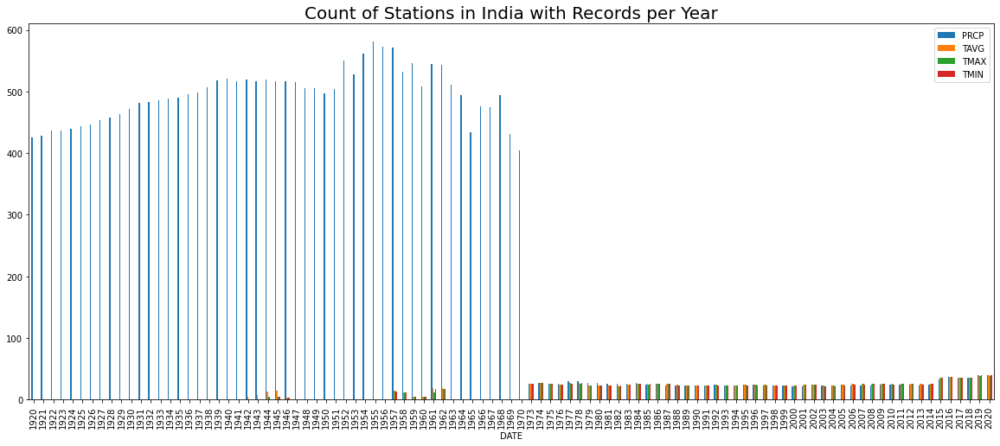

In [30]:
# plot histogram of station counts with years on the x-axis

# group by year and plot
fig, ax = plt.subplots(figsize=[20,8])

yearly_means_india_reindex.groupby(
    yearly_means_india_reindex.DATE).count().plot(ax=ax,
                                                  kind='bar',
                                                  label='count by year')

plt.title('Count of Stations in India with Records per Year', fontsize=20)
plt.legend();

#plt.savefig('/Users/richard/Desktop/springboard_repo/capstones/capstone-two/reports/figures/India_Stations_Coverage.png');


We see a clear division of what type of records are available:
- lots of PRCP values for the years 1920-1970
- very few PRCP values from 1973-2020
- no to sporadic temperature measurements from 1920-1972
- some temperature and PRCP measurements (consistent but low in number) from 1973-2019

We have a choice here between two approaches:
1. computing localized historical PRCP data, using the 400-500 stations with values for the years 1920-1970
2. computing regional, more recent PRCP and TAVG data, using the ca. 25 stations with values for the years 1973-2019 

The trade-off is between spatial granularity vs. contemporaneity of climate records with conflict incidents. **Approach 1** would yield more locale-specific measurements (much shorter distances between stations and incidents) but not contain sufficient data for the years during which the conflict incidents take place (1990-2019). It would also only look at precipitation levels, not temperature. **Approach 2** would yield less locale-specific measurements (longer distances between stations and incidents) but contain climate data for the years during which conflict incidents occurred. It would also look at both TAVG and PRCP measurements.

We will opt for Approach 2, as we are most interested in finding patterns between climate measures and conflict incidents and so **contemporaneity** is the most important.

**FUTURE RESEARCH AVENUE:** The percentages of missing values are equal, leading me to think that for this period, there's a set number of stations collecting both TAVG and PRCP. It may be worthwhile identifying these stations and evaluating their geographic spread. Perhaps these stations can be used to identify certain broad climactic zones across India and conflict incidents can be grouped into these zones, in this way enabling us to use more recent data.

### 6.4.3. Subset Stations with Continuous & Contemporary Records

In the section below, we will identify a subset of the 743 stations closest to the Indian conflict incidents. This subset will have continuous and contemporary records of at least one, ideally all four, climate measures. We will use this subset of stations to identify broad climactic zones within India and assign each conflict incidents to the nearest weather station of this subset.

To do this, we will begin by identifying the stations that have records for the year 1973, one of the poorly-covered years that we can pick out from the histogram of counts above.

In [222]:
# inspect stations that have at least 1 yearly mean value for the year 1973
yearly_means_india_reindex[yearly_means_india_reindex['DATE'] == 1973]

,DATE,PRCP,TAVG,TMAX,TMIN
STATION ID,,,,,
IN019120700,1973,12.807018,235.570423,307.551020,160.891089
IN008040100,1973,58.845070,226.696682,294.042553,150.454545
INM00042071,1973,32.022222,234.372611,307.050691,155.533981
IN011020300,1973,44.423529,255.323404,315.849057,193.760000
IN004122600,1973,44.600000,233.832061,272.168675,174.756098
IN004051800,1973,44.404762,248.859873,316.274510,181.688312
IN004120400,1973,20.000000,205.000000,265.000000,150.000000
IN017111200,1973,61.532847,272.212903,324.632035,220.523560
IN003050500,1973,95.569767,223.539683,276.408451,176.881720


This is looking good. All of these stations have values for all 4 climate measurements.

In [223]:
# create list of stations with non-null yearly means for 1973
list_stations_alltime = list(yearly_means_india_reindex[yearly_means_india_reindex['DATE'] == 1973].index)

In [224]:
# check number of stations in this list
len(list_stations_alltime)

25

We now have a list of 25 stations with values for 1973. 

Let's use this list to subset the yearly_means dataframe and plot a histogram and map to see whether these stations also cover our features of interest for our entire period of interest.

In [225]:
# subset yearly_means with this list of station IDs
yearly_means_india_alltime = yearly_means.loc[list_stations_alltime]

In [226]:
# reset index at level 'DATE'
yearly_means_india_alltime = yearly_means_india_alltime.reset_index(level=1)

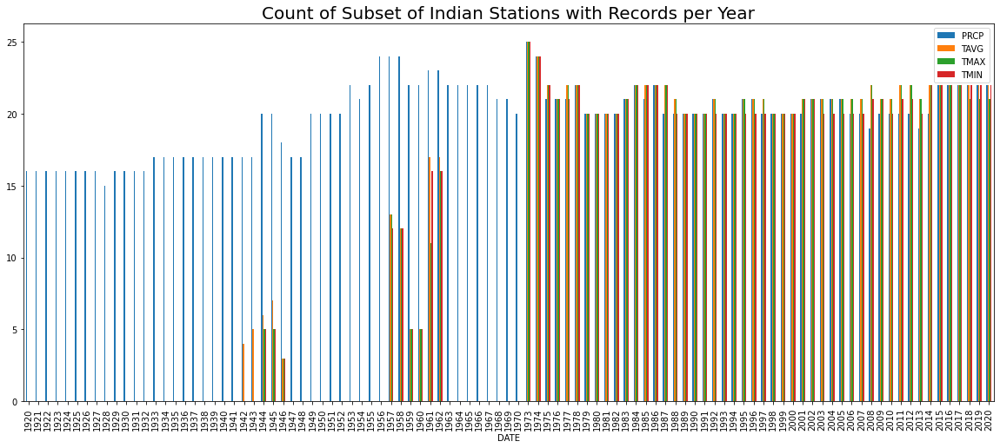

In [227]:
# plot histogram of station counts with years on the x-axis
fig, ax = plt.subplots(figsize=[20,8])

yearly_means_india_alltime.groupby(
    yearly_means_india_alltime.DATE).count().plot(ax=ax,
                                             kind='bar',
                                             label='count by year')

plt.title('Count of Subset of Indian Stations with Records per Year', fontsize=20)
plt.legend();

Still some variation here, but we can work with this.

Let's check geographical spread before continuing to see if this avenue is really going to work.

In [228]:
# subset indian stations geodataframe with list of non-null stations
gdf_stations_india_alltime = gdf_stations_india.loc[list_stations_alltime]

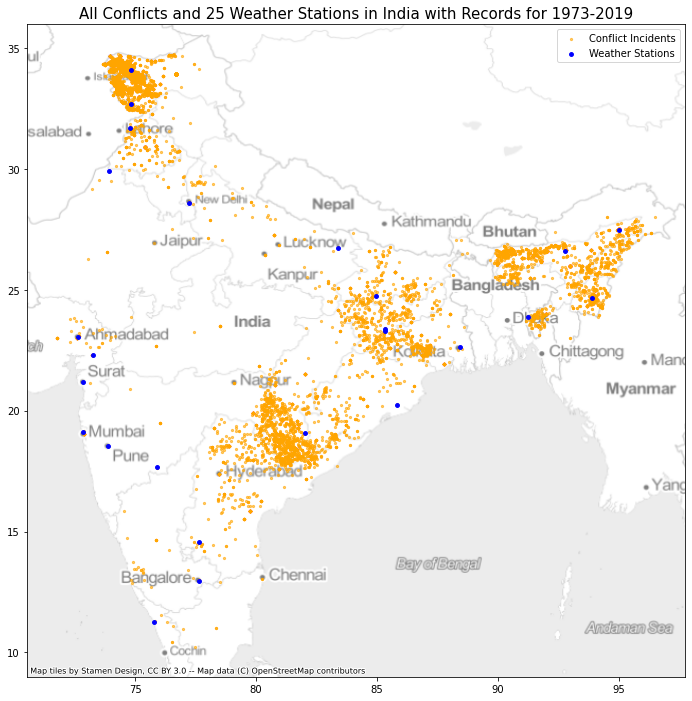

In [378]:
# map these stations and conflicts
fig, ax = plt.subplots(figsize=[15,12])

gdf_india.plot(ax=ax,
               alpha=0.6, 
               markersize=5,
               color='orange',
               label='Conflict Incidents')

gdf_stations_india_alltime.plot(ax=ax,
                                markersize=15,
                                color='blue',
                                label='Weather Stations')

plt.title('All Conflicts and 25 Weather Stations in India with Records for 1973-2019', fontsize=15)
plt.legend()

#add basemap
ctx.add_basemap(
        ax=ax, 
        crs=4326, 
        alpha=0.5, 
        source=ctx.providers.Stamen.TonerLite)

#plt.savefig('/Users/richard/Desktop/springboard_repo/capstones/capstone-two/reports/figures/India_conflicts_25stations.png');

Geographical spread is looking good, these 25 stations are pretty evenly spread over the country and there is at least 1 stations for each visible cluster of conflict incidents.

We will compute means of specific 5 year intervals for which TAVG and PRCP are collected sufficiently. Based on the histogram above, these intervals will be:
- 1973-77
- 1983-87
- 1993-97
- 2003-07
- 2015-19

NOTE: This will probably still leave us with a few NaNs, but way less than the +/-92% we got when simply looking at the nearest_station.

To do this, we first have to assign the climate zone stations to the conflict incidents.

### 6.4.4. Assign Climate Zone Stations to Conflict Incidents

In this section, we will apply our *ckdnearest* function to the subset of 25 Indian weather stations that have sufficient measurements for the years we are interested in.

This will assign the nearest of the 25 stations selected above to each conflict incident. We will call these 'zone_stations' to indicate that the climate measures assigned to each incident represent the climate in the larger region around the incident.

In [230]:
# convert india stations subset gdf to meters EPSG
gdf_stations_india_alltime_mtr = gdf_stations_india_alltime.to_crs(epsg = 3857)

In [231]:
# apply ckdnearest function to main india gdf
india = ckdnearest(india, gdf_stations_india_alltime_mtr)

In [232]:
# verify
india.columns, len(india.columns)

(Index(['id', 'year', 'type_of_violence', 'conflict_id', 'dyad_id', 'dyad_name',
        'side_a_id', 'side_a', 'side_b_id', 'side_b', 'where_prec',
        'where_coordinates', 'where_description', 'adm_1', 'adm_2', 'latitude',
        'longitude', 'country', 'country_id', 'region', 'event_clarity',
        'date_prec', 'date_start', 'date_end', 'deaths_a', 'deaths_b',
        'deaths_civilians', 'deaths_unknown', 'total_deaths', 'duration_days',
        '5year_period', 'geometry', 'nearest_station', 'distance', 'ID',
        'distance'],
       dtype='object'),
 36)

This worked, but we have double column names for 'distance'. 

Let's rename the columns.

In [233]:
india_columns = ['id',
 'year',
 'type_of_violence',
 'conflict_id',
 'dyad_id',
 'dyad_name',
 'side_a_id',
 'side_a',
 'side_b_id',
 'side_b',
 'where_prec',
 'where_coordinates',
 'where_description',
 'adm_1',
 'adm_2',
 'latitude',
 'longitude',
 'country',
 'country_id',
 'region',
 'event_clarity',
 'date_prec',
 'date_start',
 'date_end',
 'deaths_a',
 'deaths_b',
 'deaths_civilians',
 'deaths_unknown',
 'total_deaths',
 'duration_days',
 '5year_period',
 'geometry',
 'nearest_station',
 'distance_nearest_station',
 'zone_station',
 'distance_zone_station']

In [234]:
# rename columns
india.columns = india_columns
india.columns, len(india.columns)

(Index(['id', 'year', 'type_of_violence', 'conflict_id', 'dyad_id', 'dyad_name',
        'side_a_id', 'side_a', 'side_b_id', 'side_b', 'where_prec',
        'where_coordinates', 'where_description', 'adm_1', 'adm_2', 'latitude',
        'longitude', 'country', 'country_id', 'region', 'event_clarity',
        'date_prec', 'date_start', 'date_end', 'deaths_a', 'deaths_b',
        'deaths_civilians', 'deaths_unknown', 'total_deaths', 'duration_days',
        '5year_period', 'geometry', 'nearest_station',
        'distance_nearest_station', 'zone_station', 'distance_zone_station'],
       dtype='object'),
 36)

In [235]:
india.head(3)

,id,year,type_of_violence,conflict_id,dyad_id,dyad_name,side_a_id,side_a,side_b_id,side_b,...,deaths_civilians,deaths_unknown,total_deaths,duration_days,5year_period,geometry,nearest_station,distance_nearest_station,zone_station,distance_zone_station
0,59218,1990,1,218,422,Government of India - Government of Pakistan,141,Government of India,142,Government of Pakistan,...,0,0,0,1,1989-94,POINT (8248774.268 3997960.298),IN008070100,2598.137480,IN008010200,91768.367889
1,54839,1991,1,218,422,Government of India - Government of Pakistan,141,Government of India,142,Government of Pakistan,...,0,50,50,9,1989-94,POINT (8534494.665 4017618.324),IN008060300,48350.957848,IN008010200,205341.408128
2,54870,1991,1,218,422,Government of India - Government of Pakistan,141,Government of India,142,Government of Pakistan,...,0,0,3,1,1989-94,POINT (8534494.665 4017618.324),IN008060300,48350.957848,IN008010200,205341.408128


This has worked as expected. 

Each conflict incident now has a column containing:
- the nearest station
- the nearest zone station (with adequate measurements for years of interest)
- distances to both stations

In [236]:
# get distribution of distances to zone stations
india.distance_zone_station.describe()

count     14908.000000
mean     101554.475319
std       75372.137570
min          57.591715
25%       49176.661767
50%       84697.065211
75%      135950.108898
max      602150.284667
Name: distance_zone_station, dtype: float64

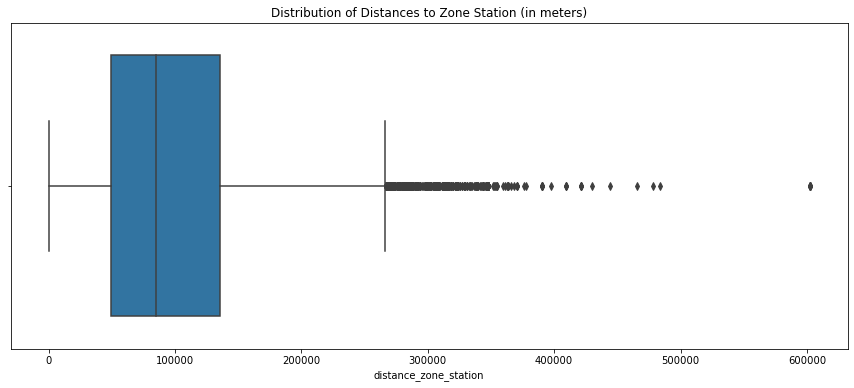

In [237]:
# create boxplot
fig, ax = plt.subplots(figsize=[15,6])
sns.boxplot(x='distance_zone_station', data=india)
plt.title('Distribution of Distances to Zone Station (in meters)');

- the mean distance from conflict incident to zone station is 101.5km
- at least 75% of the stations are within 136km of their zone station
- there are outliers with distances of 280-600km to their zone station

Let's remove rows with distance_zone_station > 300km.

In [238]:
# find 98th quantile
india['distance_zone_station'].quantile(0.98)

297945.4490530004

In [239]:
india = india[india['distance_zone_station'] <= 300000].copy()
india.shape

(14634, 36)

In [240]:
# # export this dataframe to local csv for future reference
# india.to_csv('/Users/richard/Desktop/data/processed/gdf_conflict_india_mtr_with_zone_stations_within_300km.csv')

### 6.4.5. Calculate Climate Means for Year Intervals

In this section, we will calculate the means of our 4 climate features for the year intervals selected earlier.

To do this, we define custom function *get_mean_interval* which can be used as part of a .apply() method.

In [241]:
# reset DATE into MultiIndex
yearly_means_india_alltime.set_index('DATE', append=True, inplace=True)

In [242]:
# sort index to allow for proper MultiIndexing
yearly_means_india_alltime.sort_index(level=[0,1], inplace=True)

In [243]:
# define custom function to use in .apply() method 
def get_mean_interval(row, climate_feature, start_year, end_year):
    '''
    row: row passed to the function by the .apply method
    climate_feature: climate measure to compute mean of - either PRCP, TAVG, TMAX, or TMIN
    start_year: start year of interval, inclusive
    end_year: end year of interval, inclusive
    
    returns: mean climate feature value for the interval indicated
    
    if no mean PRCP value exists for that interval, NaN is returned
    if another error occurs, a custom error is raised.
    '''  
    
    start_year = str(start_year)
    end_year = str(end_year)
    climate_feature = str(climate_feature)
    
    try:
        row = yearly_means_india_alltime.loc[
            pd.IndexSlice[row.loc['zone_station'], start_year:end_year], :]
        return row[climate_feature].mean()
    except KeyError:
        return np.nan
    except:
        print("An error other than KeyError occurred") 

In [244]:
# apply function across new column to get mean PRCP for 1973-77
india['PRCP_zone_1973_77'] = india.apply(
    get_mean_interval,
    climate_feature='PRCP',
    start_year='1973',
    end_year='1977',
    axis=1
)


In [245]:
# check percentage of NaN values
india['PRCP_zone_1973_77'].isnull().sum() / india.shape[0] * 100

0.0

This is working as expected.

Let's proceed to add PRCP means for the other intervals as well:

In [246]:
# apply function across new column to get mean PRCP for 1983-87
india['PRCP_zone_1983_87'] = india.apply(
    get_mean_interval,
    climate_feature='PRCP',
    start_year='1983',
    end_year='1987',
    axis=1
)

In [247]:
# apply function across new column to get mean PRCP for 1993-97
india['PRCP_zone_1993_97'] = india.apply(
    get_mean_interval,
    climate_feature='PRCP',
    start_year='1993',
    end_year='1997',
    axis=1
)

In [248]:
# apply function across new column to get mean PRCP for 2003-07
india['PRCP_zone_2003_07'] = india.apply(
    get_mean_interval,
    climate_feature='PRCP',
    start_year='2003',
    end_year='2007',
    axis=1
)

In [249]:
# apply function across new column to get mean PRCP for 2015-19
india['PRCP_zone_2015_19'] = india.apply(
    get_mean_interval,
    climate_feature='PRCP',
    start_year='2015',
    end_year='2019',
    axis=1
)

In [250]:
# check percentage of NaN values
print('Percentage of NaN Values for 1973-77: ' + str(india['PRCP_zone_1973_77'].isnull().sum() / india.shape[0] * 100))
print('Percentage of NaN Values for 1983-87: ' + str(india['PRCP_zone_1983_87'].isnull().sum() / india.shape[0] * 100))
print('Percentage of NaN Values for 1993-97: ' + str(india['PRCP_zone_1993_97'].isnull().sum() / india.shape[0] * 100))
print('Percentage of NaN Values for 2003-07: ' + str(india['PRCP_zone_2003_07'].isnull().sum() / india.shape[0] * 100))
print('Percentage of NaN Values for 2015-19: ' + str(india['PRCP_zone_2015_19'].isnull().sum() / india.shape[0] * 100))


Percentage of NaN Values for 1973-77: 0.0
Percentage of NaN Values for 1983-87: 11.343446767801012
Percentage of NaN Values for 1993-97: 11.521115211152111
Percentage of NaN Values for 2003-07: 11.521115211152111
Percentage of NaN Values for 2015-19: 11.425447587809213


### TAVG

In [251]:
# COMPUTE TAVG MEANS

# apply function across new column to get mean TAVG for 1973-77
india['TAVG_zone_1973_77'] = india.apply(
    get_mean_interval,
    climate_feature='TAVG',
    start_year='1973',
    end_year='1977',
    axis=1
)

# apply function across new column to get mean TAVG for 1983-87
india['TAVG_zone_1983_87'] = india.apply(
    get_mean_interval,
    climate_feature='TAVG',
    start_year='1983',
    end_year='1987',
    axis=1
)

# apply function across new column to get mean TAVG for 1993-97
india['TAVG_zone_1993_97'] = india.apply(
    get_mean_interval,
    climate_feature='TAVG',
    start_year='1993',
    end_year='1997',
    axis=1
)

# apply function across new column to get mean TAVG for 2003-07
india['TAVG_zone_2003_07'] = india.apply(
    get_mean_interval,
    climate_feature='TAVG',
    start_year='2003',
    end_year='2007',
    axis=1
)

# apply function across new column to get mean TAVG for 2015-19
india['TAVG_zone_2015_19'] = india.apply(
    get_mean_interval,
    climate_feature='TAVG',
    start_year='2015',
    end_year='2019',
    axis=1
)

In [252]:
# check percentage of NaN TAVG values
print('Percentage of NaN TAVG Values for 1973-77: ' + str(india['TAVG_zone_1973_77'].isnull().sum() / india.shape[0] * 100))
print('Percentage of NaN TAVG Values for 1983-87: ' + str(india['TAVG_zone_1983_87'].isnull().sum() / india.shape[0] * 100))
print('Percentage of NaN TAVG Values for 1993-97: ' + str(india['TAVG_zone_1993_97'].isnull().sum() / india.shape[0] * 100))
print('Percentage of NaN TAVG Values for 2003-07: ' + str(india['TAVG_zone_2003_07'].isnull().sum() / india.shape[0] * 100))
print('Percentage of NaN TAVG Values for 2015-19: ' + str(india['TAVG_zone_2015_19'].isnull().sum() / india.shape[0] * 100))

Percentage of NaN TAVG Values for 1973-77: 0.0
Percentage of NaN TAVG Values for 1983-87: 11.343446767801012
Percentage of NaN TAVG Values for 1993-97: 11.521115211152111
Percentage of NaN TAVG Values for 2003-07: 11.521115211152111
Percentage of NaN TAVG Values for 2015-19: 11.425447587809213


### TMAX

In [253]:
# COMPUTE TMAX MEANS

# apply function across new column to get mean TMAX for 1973-77
india['TMAX_zone_1973_77'] = india.apply(
    get_mean_interval,
    climate_feature='TMAX',
    start_year='1973',
    end_year='1977',
    axis=1
)

# apply function across new column to get mean TMAX for 1983-87
india['TMAX_zone_1983_87'] = india.apply(
    get_mean_interval,
    climate_feature='TMAX',
    start_year='1983',
    end_year='1987',
    axis=1
)

# apply function across new column to get mean TMAX for 1993-97
india['TMAX_zone_1993_97'] = india.apply(
    get_mean_interval,
    climate_feature='TMAX',
    start_year='1993',
    end_year='1997',
    axis=1
)

# apply function across new column to get mean TMAX for 2003-07
india['TMAX_zone_2003_07'] = india.apply(
    get_mean_interval,
    climate_feature='TMAX',
    start_year='2003',
    end_year='2007',
    axis=1
)

# apply function across new column to get mean TMAX for 2015-19
india['TMAX_zone_2015_19'] = india.apply(
    get_mean_interval,
    climate_feature='TMAX',
    start_year='2015',
    end_year='2019',
    axis=1
)

In [254]:
# check percentage of NaN TMAX values
print('Percentage of NaN TMAX Values for 1973-77: ' + str(india['TMAX_zone_1973_77'].isnull().sum() / india.shape[0] * 100))
print('Percentage of NaN TMAX Values for 1983-87: ' + str(india['TMAX_zone_1983_87'].isnull().sum() / india.shape[0] * 100))
print('Percentage of NaN TMAX Values for 1993-97: ' + str(india['TMAX_zone_1993_97'].isnull().sum() / india.shape[0] * 100))
print('Percentage of NaN TMAX Values for 2003-07: ' + str(india['TMAX_zone_2003_07'].isnull().sum() / india.shape[0] * 100))
print('Percentage of NaN TMAX Values for 2015-19: ' + str(india['TMAX_zone_2015_19'].isnull().sum() / india.shape[0] * 100))

Percentage of NaN TMAX Values for 1973-77: 0.0
Percentage of NaN TMAX Values for 1983-87: 11.343446767801012
Percentage of NaN TMAX Values for 1993-97: 11.521115211152111
Percentage of NaN TMAX Values for 2003-07: 11.521115211152111
Percentage of NaN TMAX Values for 2015-19: 11.425447587809213


### TMIN

In [255]:
# COMPUTE TMIN MEANS

# apply function across new column to get mean TMIN for 1973-77
india['TMIN_zone_1973_77'] = india.apply(
    get_mean_interval,
    climate_feature='TMIN',
    start_year='1973',
    end_year='1977',
    axis=1
)

# apply function across new column to get mean TMIN for 1983-87
india['TMIN_zone_1983_87'] = india.apply(
    get_mean_interval,
    climate_feature='TMIN',
    start_year='1983',
    end_year='1987',
    axis=1
)

# apply function across new column to get mean TMIN for 1993-97
india['TMIN_zone_1993_97'] = india.apply(
    get_mean_interval,
    climate_feature='TMIN',
    start_year='1993',
    end_year='1997',
    axis=1
)

# apply function across new column to get mean TMIN for 2003-07
india['TMIN_zone_2003_07'] = india.apply(
    get_mean_interval,
    climate_feature='TMIN',
    start_year='2003',
    end_year='2007',
    axis=1
)

# apply function across new column to get mean TMIN for 2015-19
india['TMIN_zone_2015_19'] = india.apply(
    get_mean_interval,
    climate_feature='TMIN',
    start_year='2015',
    end_year='2019',
    axis=1
)

In [256]:
# check percentage of NaN TMIN values
print('Percentage of NaN TMIN Values for 1973-77: ' + str(india['TMIN_zone_1973_77'].isnull().sum() / india.shape[0] * 100))
print('Percentage of NaN TMIN Values for 1983-87: ' + str(india['TMIN_zone_1983_87'].isnull().sum() / india.shape[0] * 100))
print('Percentage of NaN TMIN Values for 1993-97: ' + str(india['TMIN_zone_1993_97'].isnull().sum() / india.shape[0] * 100))
print('Percentage of NaN TMIN Values for 2003-07: ' + str(india['TMIN_zone_2003_07'].isnull().sum() / india.shape[0] * 100))
print('Percentage of NaN TMIN Values for 2015-19: ' + str(india['TMIN_zone_2015_19'].isnull().sum() / india.shape[0] * 100))

Percentage of NaN TMIN Values for 1973-77: 0.0
Percentage of NaN TMIN Values for 1983-87: 11.343446767801012
Percentage of NaN TMIN Values for 1993-97: 11.746617466174662
Percentage of NaN TMIN Values for 2003-07: 11.746617466174662
Percentage of NaN TMIN Values for 2015-19: 11.425447587809213


### Climate Means Findings
- We have now succesfully added the 5-year means for all 4 climate measures to our Indian conflict incidents
- Missingness is exactly the same for all 4 climate measures, meaning we can confidently deduce that the same stations are covering climate measures for the same years.
- We are missing some climate measures for the 4 intervals after 1977.

### 6.4.6. Add Means of Year of Conflict

Below, we also create 4 features containing the yearly mean PRCP, TAVG, TMAX and TMIN for the year in which the conflict incident took place.

In [257]:
# define custom function to use in .apply() method 
def get_mean_year(row, climate_feature):
    '''
    row: row passed to the function by the .apply method
    climate_feature: climate measure to compute mean of - either PRCP, TAVG, TMAX, or TMIN
    
    returns: mean climate feature value for the year of the conflict incident
    
    if no mean value exists for the year of the conflict incident, NaN is returned
    if another error occurs, a custom error is raised.
    '''  
    
    climate_feature = str(climate_feature)
    
    try:
        row = yearly_means_india_alltime.loc[
            pd.IndexSlice[row.loc['zone_station'], row.loc['year']], :]
        return row[climate_feature].mean()
    except KeyError:
        return np.nan
    except:
        print("An error other than KeyError occurred") 

In [258]:
# apply function across new column to get mean PRCP for year of conflict
india['PRCP_zone_sameyear'] = india.apply(
    get_mean_year,
    climate_feature='PRCP',
    axis=1
)

In [259]:
# apply function across new column to get mean TAVG for year of conflict
india['TAVG_zone_sameyear'] = india.apply(
    get_mean_year,
    climate_feature='TAVG',
    axis=1
)

In [260]:
# apply function across new column to get mean TMAX for year of conflict
india['TMAX_zone_sameyear'] = india.apply(
    get_mean_year,
    climate_feature='TMAX',
    axis=1
)

In [261]:
# apply function across new column to get mean TMIN for year of conflict
india['TMIN_zone_sameyear'] = india.apply(
    get_mean_year,
    climate_feature='TMIN',
    axis=1
)

In [262]:
# check percentage of NaN values
print('Percentage of NaN Values for PRCP_zone_sameyear: ' + str(india['PRCP_zone_sameyear'].isnull().sum() / india.shape[0] * 100))
print('Percentage of NaN Values for TAVG_zone_sameyear: ' + str(india['TAVG_zone_sameyear'].isnull().sum() / india.shape[0] * 100))
print('Percentage of NaN Values for TMAX_zone_sameyear: ' + str(india['TMAX_zone_sameyear'].isnull().sum() / india.shape[0] * 100))
print('Percentage of NaN Values for TMIN_zone_sameyear: ' + str(india['TMIN_zone_sameyear'].isnull().sum() / india.shape[0] * 100))


Percentage of NaN Values for PRCP_zone_sameyear: 11.671450047833812
Percentage of NaN Values for TAVG_zone_sameyear: 11.650949842831762
Percentage of NaN Values for TMAX_zone_sameyear: 11.671450047833812
Percentage of NaN Values for TMIN_zone_sameyear: 11.726117261172611


We now have also added a feature containing the yearly mean for each climate measure for the year in which the conflict took place. About 11% of the incidents are missing values for this feature (because their nearest zone station does not have records for the year of the conflict).

Let's see if we can do better by calculating mean for 5-year period preceding conflict.

### 6.4.6. Add Means of 5 Years Preceding Conflict

Below, we also create 4 features containing the yearly mean PRCP, TAVG, TMAX and TMIN for the year in which the conflict incident took place.

In [263]:
# define custom function to use in .apply() method 
def get_mean_5years(row, climate_feature):
    '''
    row: row passed to the function by the .apply method
    climate_feature: climate measure to compute mean of - either PRCP, TAVG, TMAX, or TMIN
    
    returns: mean climate feature value for the year of the conflict incident
    
    if no mean value exists for the year of the conflict incident, NaN is returned
    if another error occurs, a custom error is raised.
    '''  
    
    climate_feature = str(climate_feature)
    start_year = str(row.loc['year'] - 4)
    
    try:
        row = yearly_means_india_alltime.loc[
            pd.IndexSlice[row.loc['zone_station'], start_year:row.loc['year']], :]
        return row[climate_feature].mean()
    except KeyError:
        return np.nan
    except:
        print("An error other than KeyError occurred") 

In [264]:
# apply function across new column to get mean PRCP for year of conflict
india['PRCP_zone_5yearsprior'] = india.apply(
    get_mean_5years,
    climate_feature='PRCP',
    axis=1
)

In [265]:
# apply function across new column to get mean TAVG for year of conflict
india['TAVG_zone_5yearsprior'] = india.apply(
    get_mean_5years,
    climate_feature='TAVG',
    axis=1
)

In [266]:
# apply function across new column to get mean TMAX for year of conflict
india['TMAX_zone_5yearsprior'] = india.apply(
    get_mean_5years,
    climate_feature='TMAX',
    axis=1
)

In [267]:
# apply function across new column to get mean TMIN for year of conflict
india['TMIN_zone_5yearsprior'] = india.apply(
    get_mean_5years,
    climate_feature='TMIN',
    axis=1
)

In [268]:
# check percentage of NaN values
print('Percentage of NaN Values for PRCP_zone_5yearsprior: ' + str(india['PRCP_zone_5yearsprior'].isnull().sum() / india.shape[0] * 100))
print('Percentage of NaN Values for TAVG_zone_5yearsprior: ' + str(india['TAVG_zone_5yearsprior'].isnull().sum() / india.shape[0] * 100))
print('Percentage of NaN Values for TMAX_zone_5yearsprior: ' + str(india['TMAX_zone_5yearsprior'].isnull().sum() / india.shape[0] * 100))
print('Percentage of NaN Values for TMIN_zone_5yearsprior: ' + str(india['TMIN_zone_5yearsprior'].isnull().sum() / india.shape[0] * 100))


Percentage of NaN Values for PRCP_zone_5yearsprior: 11.521115211152111
Percentage of NaN Values for TAVG_zone_5yearsprior: 11.480114801148012
Percentage of NaN Values for TMAX_zone_5yearsprior: 11.480114801148012
Percentage of NaN Values for TMIN_zone_5yearsprior: 11.568949022823562


The missingness is about the same. Let's stick with using the means for the year of the conflict, then, since that expresses a more direct relationship between conflict incident and contemporaneous weather patterns.

### 6.4.7. Adding Rates of Change 1973 - 2019

In addition, we will now add 4 more predictor features to the dataframe:
- PRCP change 1973-2019
- TAVG change 1973-2019
- TMAX change 1973-2019
- TMIN change 1973-2019

These features will measure the overall change in climate measures over the past 47 years.

In [269]:
india['PRCP_change_1973_2019'] = india['PRCP_zone_2015_19'] - india['PRCP_zone_1973_77']
india['TAVG_change_1973_2019'] = india['TAVG_zone_2015_19'] - india['TAVG_zone_1973_77']
india['TMAX_change_1973_2019'] = india['TMAX_zone_2015_19'] - india['TMAX_zone_1973_77']
india['TMIN_change_1973_2019'] = india['TMIN_zone_2015_19'] - india['TMIN_zone_1973_77']

india.sample(5)

,id,year,type_of_violence,conflict_id,dyad_id,dyad_name,side_a_id,side_a,side_b_id,side_b,...,TMAX_zone_sameyear,TMIN_zone_sameyear,PRCP_zone_5yearsprior,TAVG_zone_5yearsprior,TMAX_zone_5yearsprior,TMIN_zone_5yearsprior,PRCP_change_1973_2019,TAVG_change_1973_2019,TMAX_change_1973_2019,TMIN_change_1973_2019
5630,92818,2002,1,364,792,Government of India - Kashmir insurgents,141,Government of India,325,Kashmir insurgents,...,216.353333,70.828685,23.623669,141.120896,219.244664,74.639241,32.479699,-0.723348,-20.187512,7.220736
13795,72220,2008,3,534,1001,DHD - BW - Civilians,368,DHD - BW,1,Civilians,...,282.973294,154.160606,60.441962,215.131244,280.767425,156.081749,46.718777,18.552634,8.082057,16.135458
6661,93257,2005,1,364,792,Government of India - Kashmir insurgents,141,Government of India,325,Kashmir insurgents,...,212.773414,70.500000,29.204520,134.940377,217.225660,71.900372,32.479699,-0.723348,-20.187512,7.220736
9661,94177,2009,1,421,886,Government of India - NDFB - RD,141,Government of India,1066,NDFB - RD,...,307.248571,201.442006,78.151435,242.390581,297.406871,194.401499,64.578026,20.507760,-9.326389,10.715786
3917,86682,1998,1,364,792,Government of India - Kashmir insurgents,141,Government of India,325,Kashmir insurgents,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### 6.4.8. Adding Rates of Change 1973 - Year of Conflict

In addition, we will now add 4 more predictor features to the dataframe:
- PRCP change between 1973 and year of conflict incident
- TAVG change between 1973 and year of conflict incident
- TMAX change between 1973 and year of conflict incident
- TMIN change between 1973 and year of conflict incident

In [270]:
india.columns

Index(['id', 'year', 'type_of_violence', 'conflict_id', 'dyad_id', 'dyad_name',
       'side_a_id', 'side_a', 'side_b_id', 'side_b', 'where_prec',
       'where_coordinates', 'where_description', 'adm_1', 'adm_2', 'latitude',
       'longitude', 'country', 'country_id', 'region', 'event_clarity',
       'date_prec', 'date_start', 'date_end', 'deaths_a', 'deaths_b',
       'deaths_civilians', 'deaths_unknown', 'total_deaths', 'duration_days',
       '5year_period', 'geometry', 'nearest_station',
       'distance_nearest_station', 'zone_station', 'distance_zone_station',
       'PRCP_zone_1973_77', 'PRCP_zone_1983_87', 'PRCP_zone_1993_97',
       'PRCP_zone_2003_07', 'PRCP_zone_2015_19', 'TAVG_zone_1973_77',
       'TAVG_zone_1983_87', 'TAVG_zone_1993_97', 'TAVG_zone_2003_07',
       'TAVG_zone_2015_19', 'TMAX_zone_1973_77', 'TMAX_zone_1983_87',
       'TMAX_zone_1993_97', 'TMAX_zone_2003_07', 'TMAX_zone_2015_19',
       'TMIN_zone_1973_77', 'TMIN_zone_1983_87', 'TMIN_zone_1993_97',
    

In [271]:
india['PRCP_change_1973_sameyear'] = india['PRCP_zone_sameyear'] - india['PRCP_zone_1973_77']
india['TAVG_change_1973_sameyear'] = india['TAVG_zone_sameyear'] - india['TAVG_zone_1973_77']
india['TMAX_change_1973_sameyear'] = india['TMAX_zone_sameyear'] - india['TMAX_zone_1973_77']
india['TMIN_change_1973_sameyear'] = india['TMIN_zone_sameyear'] - india['TMIN_zone_1973_77']

india.sample(5)

,id,year,type_of_violence,conflict_id,dyad_id,dyad_name,side_a_id,side_a,side_b_id,side_b,...,TMAX_zone_5yearsprior,TMIN_zone_5yearsprior,PRCP_change_1973_2019,TAVG_change_1973_2019,TMAX_change_1973_2019,TMIN_change_1973_2019,PRCP_change_1973_sameyear,TAVG_change_1973_sameyear,TMAX_change_1973_sameyear,TMIN_change_1973_sameyear
3181,86011,1990,1,364,792,Government of India - Kashmir insurgents,141,Government of India,325,Kashmir insurgents,...,188.317975,70.220531,32.479699,-0.723348,-20.187512,7.220736,15.558970,-21.158930,-42.599710,-2.288896
11518,87486,2003,3,516,983,ATTF - Civilians,306,ATTF,1,Civilians,...,307.292610,198.272690,71.652625,8.160440,-2.903288,6.811169,8.708428,-7.768358,-3.468066,-8.039581
1797,209842,2015,1,227,453,Government of India - CPI-Maoist,141,Government of India,195,CPI-Maoist,...,315.325799,197.393018,85.261206,0.914241,-6.118009,2.214376,105.112675,-0.691046,0.630181,13.463547
5076,88130,2002,1,364,792,Government of India - Kashmir insurgents,141,Government of India,325,Kashmir insurgents,...,219.244664,74.639241,32.479699,-0.723348,-20.187512,7.220736,-13.092545,-4.395389,9.967106,1.565763
6861,93311,2005,1,364,792,Government of India - Kashmir insurgents,141,Government of India,325,Kashmir insurgents,...,217.225660,71.900372,32.479699,-0.723348,-20.187512,7.220736,14.430054,-4.359312,6.387187,1.237078


This has worked as expected.

We now have rates of change for:
- the entire observation period (1979-2019)
- the period preceding the conflict (1973 - year of conflict)

### 6.4.9. Inspect New Features

We are now ready to finalize our dataframe. Let's investigate whether there are any missing values left in our columns now that we have added these new features. 

In [272]:
# reset index to 'id'
india.set_index('id', drop=True, inplace=True)

In [273]:
india.columns

Index(['year', 'type_of_violence', 'conflict_id', 'dyad_id', 'dyad_name',
       'side_a_id', 'side_a', 'side_b_id', 'side_b', 'where_prec',
       'where_coordinates', 'where_description', 'adm_1', 'adm_2', 'latitude',
       'longitude', 'country', 'country_id', 'region', 'event_clarity',
       'date_prec', 'date_start', 'date_end', 'deaths_a', 'deaths_b',
       'deaths_civilians', 'deaths_unknown', 'total_deaths', 'duration_days',
       '5year_period', 'geometry', 'nearest_station',
       'distance_nearest_station', 'zone_station', 'distance_zone_station',
       'PRCP_zone_1973_77', 'PRCP_zone_1983_87', 'PRCP_zone_1993_97',
       'PRCP_zone_2003_07', 'PRCP_zone_2015_19', 'TAVG_zone_1973_77',
       'TAVG_zone_1983_87', 'TAVG_zone_1993_97', 'TAVG_zone_2003_07',
       'TAVG_zone_2015_19', 'TMAX_zone_1973_77', 'TMAX_zone_1983_87',
       'TMAX_zone_1993_97', 'TMAX_zone_2003_07', 'TMAX_zone_2015_19',
       'TMIN_zone_1973_77', 'TMIN_zone_1983_87', 'TMIN_zone_1993_97',
       'TM

We decided earlier not to include the 5yearsprior features. Let's drop those columns before proceeding.

In [274]:
# drop 5yearsprior columns
columns_to_drop = ['PRCP_zone_5yearsprior', 'TAVG_zone_5yearsprior', 'TMAX_zone_5yearsprior', 'TMIN_zone_5yearsprior']

india.drop(labels=columns_to_drop, axis=1, inplace=True)

india.columns

Index(['year', 'type_of_violence', 'conflict_id', 'dyad_id', 'dyad_name',
       'side_a_id', 'side_a', 'side_b_id', 'side_b', 'where_prec',
       'where_coordinates', 'where_description', 'adm_1', 'adm_2', 'latitude',
       'longitude', 'country', 'country_id', 'region', 'event_clarity',
       'date_prec', 'date_start', 'date_end', 'deaths_a', 'deaths_b',
       'deaths_civilians', 'deaths_unknown', 'total_deaths', 'duration_days',
       '5year_period', 'geometry', 'nearest_station',
       'distance_nearest_station', 'zone_station', 'distance_zone_station',
       'PRCP_zone_1973_77', 'PRCP_zone_1983_87', 'PRCP_zone_1993_97',
       'PRCP_zone_2003_07', 'PRCP_zone_2015_19', 'TAVG_zone_1973_77',
       'TAVG_zone_1983_87', 'TAVG_zone_1993_97', 'TAVG_zone_2003_07',
       'TAVG_zone_2015_19', 'TMAX_zone_1973_77', 'TMAX_zone_1983_87',
       'TMAX_zone_1993_97', 'TMAX_zone_2003_07', 'TMAX_zone_2015_19',
       'TMIN_zone_1973_77', 'TMIN_zone_1983_87', 'TMIN_zone_1993_97',
       'TM

In [275]:
india.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 14634 entries, 59218 to 95595
Data columns (total 67 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   year                       14634 non-null  int64         
 1   type_of_violence           14634 non-null  int64         
 2   conflict_id                14634 non-null  int64         
 3   dyad_id                    14634 non-null  int64         
 4   dyad_name                  14634 non-null  object        
 5   side_a_id                  14634 non-null  int64         
 6   side_a                     14634 non-null  object        
 7   side_b_id                  14634 non-null  int64         
 8   side_b                     14634 non-null  object        
 9   where_prec                 14634 non-null  int64         
 10  where_coordinates          14634 non-null  object        
 11  where_description          14301 non-null  object      

As expected, we still have some rows with missing climate values. This is because the 25 stations we selected do not all have records for all years.

Let's maintain these rows for now.

In [276]:
# # export to local csv
# india.to_csv('/Users/richard/Desktop/data/processed/gdf_india_mtr_final.csv')

### Case Study Summary
- We now have a final dataframe for our first case study containing 14000+ conflict incidents in India for most of which we have complete 5-year climate measurement means of the nearest climate zone station (25 in total), as well as climate means for the year of the conflict and relevant rates of change.
- In the following section, we will proceed to conduct a Principal Components Analysis to see whether there are any identifiable clusters within these incidents.

# 7. Principal Component Analysis

As part of our EDA, we will apply PCA to our new dataframe (containing both conflict incidents and relevant climate data at regional level) to see whether or not there are any clear clusters in the dataframe.

The basic steps in this process are:

1. scale the data (important here because our features are heterogenous)
2. fit the PCA transformation (learn the transformation from the data)
3. apply the transformation to the data to create the derived features
4. (optionally) use the derived features to look for patterns in the data and explore the coefficients

## 7.1 Scaling the data

First, we must transform df_conflict to include only numerical data


In [277]:
list(india.columns)

['year',
 'type_of_violence',
 'conflict_id',
 'dyad_id',
 'dyad_name',
 'side_a_id',
 'side_a',
 'side_b_id',
 'side_b',
 'where_prec',
 'where_coordinates',
 'where_description',
 'adm_1',
 'adm_2',
 'latitude',
 'longitude',
 'country',
 'country_id',
 'region',
 'event_clarity',
 'date_prec',
 'date_start',
 'date_end',
 'deaths_a',
 'deaths_b',
 'deaths_civilians',
 'deaths_unknown',
 'total_deaths',
 'duration_days',
 '5year_period',
 'geometry',
 'nearest_station',
 'distance_nearest_station',
 'zone_station',
 'distance_zone_station',
 'PRCP_zone_1973_77',
 'PRCP_zone_1983_87',
 'PRCP_zone_1993_97',
 'PRCP_zone_2003_07',
 'PRCP_zone_2015_19',
 'TAVG_zone_1973_77',
 'TAVG_zone_1983_87',
 'TAVG_zone_1993_97',
 'TAVG_zone_2003_07',
 'TAVG_zone_2015_19',
 'TMAX_zone_1973_77',
 'TMAX_zone_1983_87',
 'TMAX_zone_1993_97',
 'TMAX_zone_2003_07',
 'TMAX_zone_2015_19',
 'TMIN_zone_1973_77',
 'TMIN_zone_1983_87',
 'TMIN_zone_1993_97',
 'TMIN_zone_2003_07',
 'TMIN_zone_2015_19',
 'PRCP_zone

We will select only the features containing weather information:

In [278]:
# # create list of column names
# pca_columns = [
#  'total_deaths',
#  'duration_days',
#  'PRCP_zone_1973_77',
#  'PRCP_zone_1983_87',
#  'PRCP_zone_1993_97',
#  'PRCP_zone_2003_07',
#  'PRCP_zone_2015_19',
#  'TAVG_zone_1973_77',
#  'TAVG_zone_1983_87',
#  'TAVG_zone_1993_97',
#  'TAVG_zone_2003_07',
#  'TAVG_zone_2015_19',
#  'TMAX_zone_1973_77',
#  'TMAX_zone_1983_87',
#  'TMAX_zone_1993_97',
#  'TMAX_zone_2003_07',
#  'TMAX_zone_2015_19',
#  'TMIN_zone_1973_77',
#  'TMIN_zone_1983_87',
#  'TMIN_zone_1993_97',
#  'TMIN_zone_2003_07',
#  'TMIN_zone_2015_19']

In [279]:
# create list of column names
pca_columns_new = [
 'PRCP_zone_1973_77',
 'PRCP_zone_1983_87',
 'PRCP_zone_1993_97',
 'PRCP_zone_2003_07',
 'PRCP_zone_2015_19',
 'TAVG_zone_1973_77',
 'TAVG_zone_1983_87',
 'TAVG_zone_1993_97',
 'TAVG_zone_2003_07',
 'TAVG_zone_2015_19',
 'TMAX_zone_1973_77',
 'TMAX_zone_1983_87',
 'TMAX_zone_1993_97',
 'TMAX_zone_2003_07',
 'TMAX_zone_2015_19',
 'TMIN_zone_1973_77',
 'TMIN_zone_1983_87',
 'TMIN_zone_1993_97',
 'TMIN_zone_2003_07',
 'TMIN_zone_2015_19',
 'PRCP_zone_sameyear',
 'TAVG_zone_sameyear',
 'TMAX_zone_sameyear',
 'TMIN_zone_sameyear',
 'PRCP_change_1973_2019',
 'TAVG_change_1973_2019',
 'TMAX_change_1973_2019',
 'TMIN_change_1973_2019',
 'PRCP_change_1973_sameyear',
 'TAVG_change_1973_sameyear',
 'TMAX_change_1973_sameyear',
 'TMIN_change_1973_sameyear']

In [280]:
len(pca_columns_new)

32

Because PCA cannot handle NaNs, let's first subset our main dataframe to exclude all NaNs.

In [281]:
# create subset of india dataframe without NaNs
india_noNAN = india.dropna()

In [282]:
# select only numerical data relevant to our analysis
df_pca = india_noNAN.loc[:, pca_columns_new]

# save column names and index
df_pca_columns = df_pca.columns
df_pca_index = df_pca.index

df_pca.sample(5)

,PRCP_zone_1973_77,PRCP_zone_1983_87,PRCP_zone_1993_97,PRCP_zone_2003_07,PRCP_zone_2015_19,TAVG_zone_1973_77,TAVG_zone_1983_87,TAVG_zone_1993_97,TAVG_zone_2003_07,TAVG_zone_2015_19,...,TMAX_zone_sameyear,TMIN_zone_sameyear,PRCP_change_1973_2019,TAVG_change_1973_2019,TMAX_change_1973_2019,TMIN_change_1973_2019,PRCP_change_1973_sameyear,TAVG_change_1973_sameyear,TMAX_change_1973_sameyear,TMIN_change_1973_sameyear
id,,,,,,,,,,,,,,,,,,,,,
84783,14.592545,26.121266,22.117471,23.180526,47.072244,137.892264,133.371989,138.332913,137.341687,137.168916,...,216.353333,70.828685,32.479699,-0.723348,-20.187512,7.220736,-13.092545,-4.395389,9.967106,1.565763
88009,14.592545,26.121266,22.117471,23.180526,47.072244,137.892264,133.371989,138.332913,137.341687,137.168916,...,219.053254,74.542254,32.479699,-0.723348,-20.187512,7.220736,-14.592545,-1.229342,12.667028,5.279332
89569,14.592545,26.121266,22.117471,23.180526,47.072244,137.892264,133.371989,138.332913,137.341687,137.168916,...,163.786517,66.974026,32.479699,-0.723348,-20.187512,7.220736,15.558970,-21.158930,-42.599710,-2.288896
88499,33.204384,36.368840,48.449425,84.693716,94.758096,270.695966,270.099150,268.396738,270.031746,271.285851,...,331.027855,226.230263,61.553711,0.589885,-8.516365,4.283476,47.394071,0.273897,5.616983,5.825629
95190,24.876235,43.453598,53.638794,57.817035,71.595011,204.865412,199.416364,211.134454,215.518000,223.418046,...,286.310219,158.119691,46.718777,18.552634,8.082057,16.135458,30.161644,14.609335,21.880215,16.210677


In [283]:
# verify identical number of rows in india_noNAN and df_pca
india_noNAN.shape, df_pca.shape

((11507, 67), (11507, 32))

Let's proceed to scale the data.

In [284]:
# scale the data (yields numpy array)
pca_scaled = scale(df_pca)

In [285]:
# Create a new dataframe from using the column names stored above
df_pca_scaled = pd.DataFrame(pca_scaled, columns=df_pca_columns)
df_pca_scaled.set_index(df_pca_index, inplace=True)
df_pca_scaled.head()

,PRCP_zone_1973_77,PRCP_zone_1983_87,PRCP_zone_1993_97,PRCP_zone_2003_07,PRCP_zone_2015_19,TAVG_zone_1973_77,TAVG_zone_1983_87,TAVG_zone_1993_97,TAVG_zone_2003_07,TAVG_zone_2015_19,...,TMAX_zone_sameyear,TMIN_zone_sameyear,PRCP_change_1973_2019,TAVG_change_1973_2019,TMAX_change_1973_2019,TMIN_change_1973_2019,PRCP_change_1973_sameyear,TAVG_change_1973_sameyear,TMAX_change_1973_sameyear,TMIN_change_1973_sameyear
id,,,,,,,,,,,,,,,,,,,,,
59218,-0.667957,-0.652822,-0.81024,-0.952875,-0.929453,-1.014894,-1.014416,-1.024034,-1.028746,-1.033696,...,-1.897322,-1.149359,-0.876588,-0.661302,-0.849912,-0.150762,-0.503118,-3.033564,-2.801406,-0.701385
54879,-0.667957,-0.652822,-0.81024,-0.952875,-0.929453,-1.014894,-1.014416,-1.024034,-1.028746,-1.033696,...,-1.329880,-1.470125,-0.876588,-0.661302,-0.849912,-0.150762,0.777221,-0.764300,-1.069231,-2.610193
54978,-0.667957,-0.652822,-0.81024,-0.952875,-0.929453,-1.014894,-1.014416,-1.024034,-1.028746,-1.033696,...,-0.989758,-0.905018,-0.876588,-0.661302,-0.849912,-0.150762,-0.520635,0.487367,-0.030972,0.752635
55355,-0.667957,-0.652822,-0.81024,-0.952875,-0.929453,-1.014894,-1.014416,-1.024034,-1.028746,-1.033696,...,-0.797343,-0.872121,-0.876588,-0.661302,-0.849912,-0.150762,-1.206951,1.376769,0.556396,0.948399
55354,-0.667957,-0.652822,-0.81024,-0.952875,-0.929453,-1.014894,-1.014416,-1.024034,-1.028746,-1.033696,...,-0.797343,-0.872121,-0.876588,-0.661302,-0.849912,-0.150762,-1.206951,1.376769,0.556396,0.948399


In [286]:
# check mean to verify
df_pca_scaled.mean()

PRCP_zone_1973_77           -3.026894e-15
PRCP_zone_1983_87            1.353349e-15
PRCP_zone_1993_97           -6.424995e-15
PRCP_zone_2003_07            1.183616e-14
PRCP_zone_2015_19           -7.749178e-15
TAVG_zone_1973_77           -1.249310e-14
TAVG_zone_1983_87           -4.460256e-15
TAVG_zone_1993_97           -1.477310e-15
TAVG_zone_2003_07            1.553249e-14
TAVG_zone_2015_19            2.222702e-14
TMAX_zone_1973_77           -2.314573e-14
TMAX_zone_1983_87            6.653615e-15
TMAX_zone_1993_97           -1.558379e-14
TMAX_zone_2003_07            7.605997e-16
TMAX_zone_2015_19            1.103724e-14
TMIN_zone_1973_77           -8.010920e-15
TMIN_zone_1983_87            1.254950e-14
TMIN_zone_1993_97           -1.893949e-14
TMIN_zone_2003_07           -2.166898e-16
TMIN_zone_2015_19           -1.421562e-14
PRCP_zone_sameyear          -1.869385e-15
TAVG_zone_sameyear          -1.998411e-15
TMAX_zone_sameyear           9.581812e-16
TMIN_zone_sameyear          -1.070

In [287]:
# check std
df_pca_scaled.std(ddof=0)

PRCP_zone_1973_77            1.0
PRCP_zone_1983_87            1.0
PRCP_zone_1993_97            1.0
PRCP_zone_2003_07            1.0
PRCP_zone_2015_19            1.0
TAVG_zone_1973_77            1.0
TAVG_zone_1983_87            1.0
TAVG_zone_1993_97            1.0
TAVG_zone_2003_07            1.0
TAVG_zone_2015_19            1.0
TMAX_zone_1973_77            1.0
TMAX_zone_1983_87            1.0
TMAX_zone_1993_97            1.0
TMAX_zone_2003_07            1.0
TMAX_zone_2015_19            1.0
TMIN_zone_1973_77            1.0
TMIN_zone_1983_87            1.0
TMIN_zone_1993_97            1.0
TMIN_zone_2003_07            1.0
TMIN_zone_2015_19            1.0
PRCP_zone_sameyear           1.0
TAVG_zone_sameyear           1.0
TMAX_zone_sameyear           1.0
TMIN_zone_sameyear           1.0
PRCP_change_1973_2019        1.0
TAVG_change_1973_2019        1.0
TMAX_change_1973_2019        1.0
TMIN_change_1973_2019        1.0
PRCP_change_1973_sameyear    1.0
TAVG_change_1973_sameyear    1.0
TMAX_chang

## 7.2 Fit PCA to Data

Now we proceed to fit our PCA model to the scaled data.

In [288]:
# fit pca to our scaled data
india_pca = PCA().fit(df_pca_scaled)

In [289]:
# print explained variance
india_pca.explained_variance_

array([2.32036290e+01, 3.44090349e+00, 1.45750681e+00, 1.38159608e+00,
       8.12682668e-01, 5.68808229e-01, 4.57878769e-01, 1.97646534e-01,
       1.86959150e-01, 1.40283641e-01, 8.37846891e-02, 3.16892253e-02,
       1.78225735e-02, 1.04652263e-02, 5.66786876e-03, 3.23725490e-03,
       1.14340944e-03, 6.47895081e-04, 3.34107994e-04, 7.38194167e-05,
       1.32342672e-05, 7.41580416e-06, 6.39905266e-08, 3.27601904e-29,
       7.92832984e-30, 6.36810528e-30, 7.97886704e-31, 6.26940643e-31,
       3.55005716e-31, 1.64438280e-31, 1.15675587e-31, 7.39159318e-32])

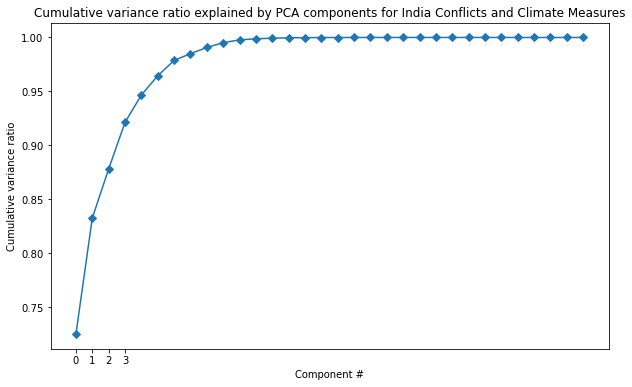

In [290]:
# plot the Cumulative Variance Ratio
plt.subplots(figsize=(10, 6))
plt.plot(india_pca.explained_variance_ratio_.cumsum(), marker='D')
plt.xlabel('Component #')
plt.xticks(np.arange(0,4))
plt.ylabel('Cumulative variance ratio')
plt.title('Cumulative variance ratio explained by PCA components for India Conflicts and Climate Measures');

In [291]:
# apply .transform() to get the derived features from the PCA
india_pca_x = india_pca.transform(df_pca_scaled)

The first 2 components account for almost 85% of the variance.

Let's investigate further by:
- plotting the two PCA components
- trying to figure out on what basis they are clustering

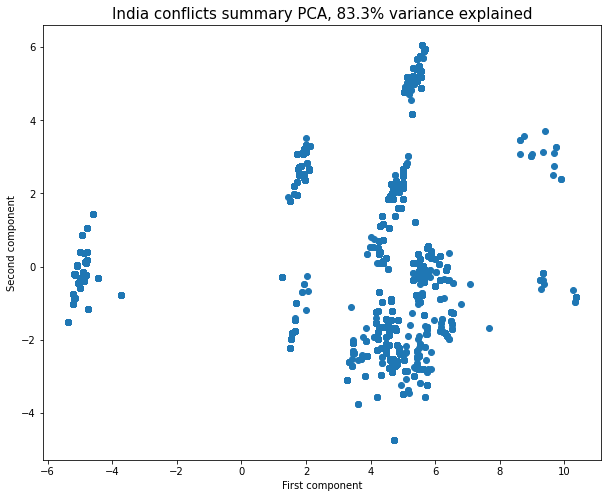

In [292]:
# Plot the first two principle components
x = india_pca_x[:, 0]
y = india_pca_x[:, 1]
pc_var = 100 * india_pca.explained_variance_ratio_.cumsum()[1]
plt.subplots(figsize=(10,8))
plt.scatter(x=x, y=y)
plt.xlabel('First component')
plt.ylabel('Second component')
plt.title(f'India conflicts summary PCA, {pc_var:.1f}% variance explained', fontsize=15);

Let's proceed to color this scatter plot by a few different features to see if we can get a sense of what these two first two PCA components are composed of:
- Year
- Latitude
- Longitude
- Total_deaths
- Conflict ID

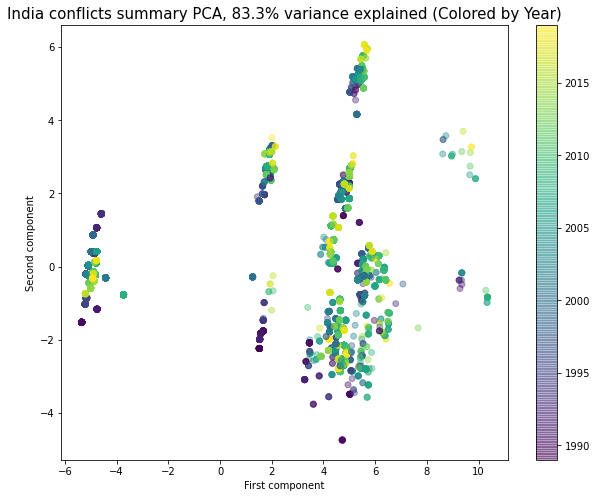

In [293]:
# Plot the first two principle components
x = india_pca_x[:, 0]
y = india_pca_x[:, 1]
pc_var = 100 * india_pca.explained_variance_ratio_.cumsum()[1]
plt.subplots(figsize=(10,8))
plt.scatter(x=x, y=y, c=india_noNAN['year'], alpha=0.4)
plt.colorbar()
plt.xlabel('First component')
plt.ylabel('Second component')
plt.title(f'India conflicts summary PCA, {pc_var:.1f}% variance explained (Colored by Year)', fontsize=15);

Coloring by Year doesn't seem to highlight any clear clusters.

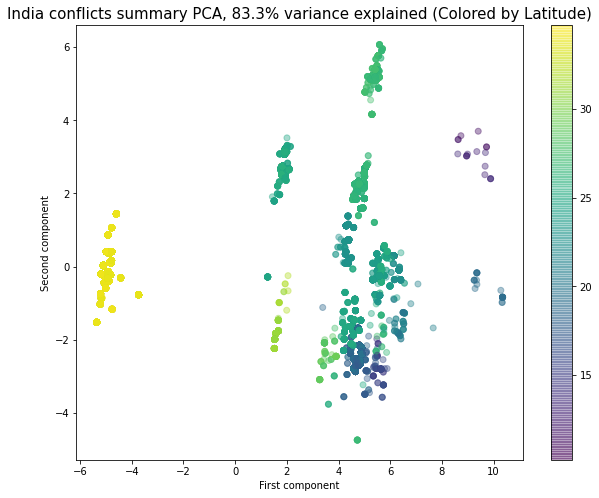

In [379]:
# Plot the first two principle components
x = india_pca_x[:, 0]
y = india_pca_x[:, 1]
pc_var = 100 * india_pca.explained_variance_ratio_.cumsum()[1]
plt.subplots(figsize=(10,8))
plt.scatter(x=x, y=y, c=india_noNAN['latitude'], alpha=0.4)
plt.colorbar()
plt.xlabel('First component')
plt.ylabel('Second component')
plt.title(f'India conflicts summary PCA, {pc_var:.1f}% variance explained (Colored by Latitude)', fontsize=15)

plt.savefig('/Users/richard/Desktop/springboard_repo/capstones/capstone-two/reports/figures/PCA_Latitude.png');

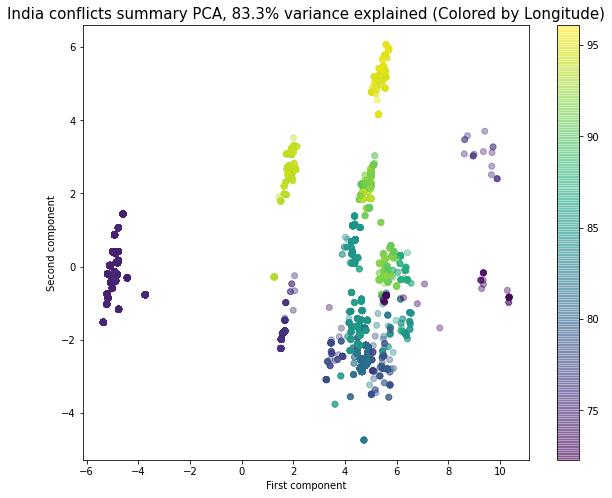

In [295]:
# Plot the first two principle components
x = india_pca_x[:, 0]
y = india_pca_x[:, 1]
pc_var = 100 * india_pca.explained_variance_ratio_.cumsum()[1]
plt.subplots(figsize=(10,8))
plt.scatter(x=x, y=y, c=india_noNAN['longitude'], alpha=0.4)
plt.colorbar()
plt.xlabel('First component')
plt.ylabel('Second component')
plt.title(f'India conflicts summary PCA, {pc_var:.1f}% variance explained (Colored by Longitude)', fontsize=15);

Coloring by Latitude and Longitude **does** reveal clearly distinguishable clusters.

Let's now proceed to color the PCA score plot by our target feature *total_deaths*. To do that, we first have to create bins of the values.

In [296]:
# Create a dataframe containing the values of the first two PCA components
pca_df = pd.DataFrame({'PC1': x, 'PC2': y}, index=india_noNAN.index)
pca_df.head()

,PC1,PC2
id,,
59218,-5.357098,-1.520882
54879,-4.762183,-1.164581
54978,-4.871894,0.359272
55355,-4.919708,0.868656
55354,-4.919708,0.868656


In [297]:
# create dataframe with dependent variable of interest
total_deaths = india[['total_deaths']]
total_deaths

,total_deaths
id,
59218,0
54839,50
54870,3
59616,1
54879,12
...,...
287350,1
324471,2
95591,25


In [298]:
# concatenate the two dfs
pca_df = pd.concat([pca_df, total_deaths], axis=1, sort=True)
pca_df.head()

,PC1,PC2,total_deaths
id,,,
48692,5.291564,4.163554,3
51771,-4.919708,0.868656,3
51775,-5.158126,-0.211306,2
52043,NaN,NaN,1
52167,NaN,NaN,1


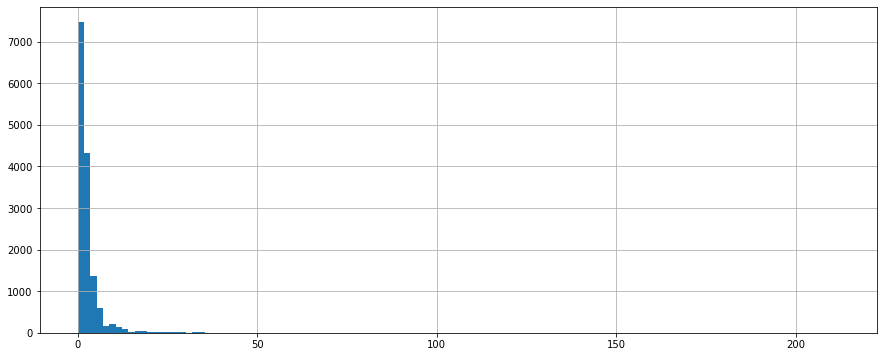

In [299]:
india.total_deaths.hist(bins=120, figsize=(15,6));

In [300]:
# divide total_deaths into Bins
pca_df['bins'] = pd.cut(pca_df.total_deaths, bins=[0, 1, 5, 10, 25, 50, 100, 250], right=False)
pca_df.head()

,PC1,PC2,total_deaths,bins
id,,,,
48692,5.291564,4.163554,3,"[1, 5)"
51771,-4.919708,0.868656,3,"[1, 5)"
51775,-5.158126,-0.211306,2,"[1, 5)"
52043,NaN,NaN,1,"[1, 5)"
52167,NaN,NaN,1,"[1, 5)"


In [301]:
pca_df.dtypes

PC1              float64
PC2              float64
total_deaths       int64
bins            category
dtype: object

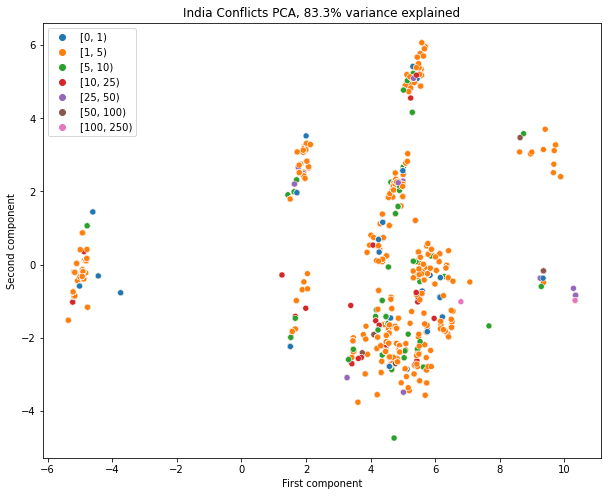

In [302]:
# plot first two principal components 
x = pca_df.PC1
y = pca_df.PC2
total_deaths = pca_df.total_deaths
bins = pca_df.bins
conflict_id = pca_df.index
pc_var = 100 * india_pca.explained_variance_ratio_.cumsum()[1]

fig, ax = plt.subplots(figsize=(10,8))

sns.scatterplot(x='PC1', y='PC2', hue='bins', 
                hue_order=pca_df.bins.cat.categories, data=pca_df)

ax.set_xlabel('First component')
ax.set_ylabel('Second component')
plt.legend()
ax.set_title(f'India Conflicts PCA, {pc_var:.1f}% variance explained');


Below, let's do the same, but letting 'total_deaths' determine the markersize:

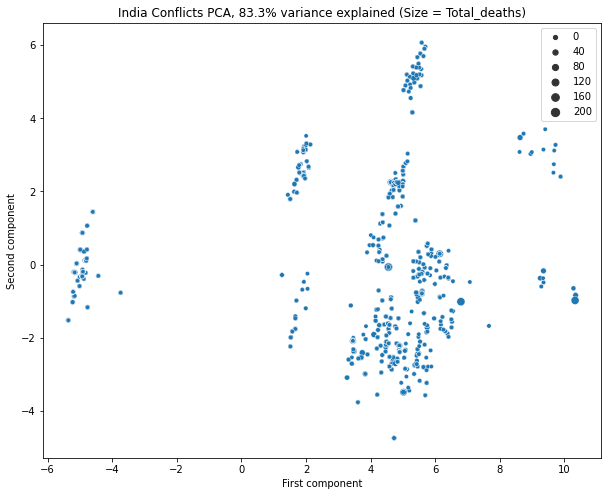

In [303]:
# plot first two principal components 
x = pca_df.PC1
y = pca_df.PC2
total_deaths = pca_df.total_deaths
bins = pca_df.bins
conflict_id = pca_df.index
pc_var = 100 * india_pca.explained_variance_ratio_.cumsum()[1]

fig, ax = plt.subplots(figsize=(10,8))

sns.scatterplot(x='PC1', y='PC2', size='total_deaths', 
                hue_order=pca_df.bins.cat.categories, data=pca_df)

ax.set_xlabel('First component')
ax.set_ylabel('Second component')
plt.legend()
ax.set_title(f'India Conflicts PCA, {pc_var:.1f}% variance explained (Size = Total_deaths)');


This is not adding a whole lot of information or clarity about how the clusters are being split.

As a final step, let's color this PCA plot using the *conflict_id* column, to see whether the distinguishable lines correspond to specific conflicts.

To do this, let's create a new column with unique identifiers for the top 9 conflict ids (in terms of number of conflict incidents) and 1 'other' value. This will allow us to properly color our plot.

In [304]:
# find conflict_ids with highest incident counts
india['conflict_id'].value_counts()

364      5786
227      1819
522      1569
499      1412
365       501
347       414
421       341
218       287
519       220
351       202
523       194
335       192
4902      170
4679      163
517       130
487       111
251       110
531       110
13653     100
1979       76
11342      70
516        60
503        47
434        46
498        44
497        42
10289      37
13230      35
10780      26
546        26
545        24
4992       23
4752       22
11361      21
4754       21
534        19
616        19
625        18
615        18
4680       15
624        14
11523      13
541        12
626        10
535        10
4908        7
902         7
11318       5
4753        4
1977        4
14003       3
617         2
10676       1
11475       1
13005       1
Name: conflict_id, dtype: int64

In [305]:
# create categorical column
india_noNAN['conflict_id_category'] = 9
india_noNAN['conflict_id_category'].loc[(india_noNAN['conflict_id'] == 364)] = 0
india_noNAN['conflict_id_category'].loc[(india_noNAN['conflict_id'] == 227)] = 1
india_noNAN['conflict_id_category'].loc[(india_noNAN['conflict_id'] == 522)] = 2
india_noNAN['conflict_id_category'].loc[(india_noNAN['conflict_id'] == 499)] = 3
india_noNAN['conflict_id_category'].loc[(india_noNAN['conflict_id'] == 365)] = 4
india_noNAN['conflict_id_category'].loc[(india_noNAN['conflict_id'] == 347)] = 5
india_noNAN['conflict_id_category'].loc[(india_noNAN['conflict_id'] == 421)] = 6
india_noNAN['conflict_id_category'].loc[(india_noNAN['conflict_id'] == 218)] = 7
india_noNAN['conflict_id_category'].loc[(india_noNAN['conflict_id'] == 519)] = 8

/Users/richard/miniconda3/envs/sklearn/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/Users/richard/miniconda3/envs/sklearn/lib/python3.7/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)
/Users/richard/miniconda3/envs/sklearn/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.o

In [306]:
# verify
india_noNAN.sample(5)

,year,type_of_violence,conflict_id,dyad_id,dyad_name,side_a_id,side_a,side_b_id,side_b,where_prec,...,TMIN_zone_sameyear,PRCP_change_1973_2019,TAVG_change_1973_2019,TMAX_change_1973_2019,TMIN_change_1973_2019,PRCP_change_1973_sameyear,TAVG_change_1973_sameyear,TMAX_change_1973_sameyear,TMIN_change_1973_sameyear,conflict_id_category
id,,,,,,,,,,,,,,,,,,,,,
156571,2014,3,499,966,CPI-Maoist - Civilians,195,CPI-Maoist,1,Civilians,3,...,228.333333,85.261206,0.914241,-6.118009,2.214376,82.600286,-2.207357,0.932475,39.865986,3
82571,2008,1,365,793,Government of India - ULFA,141,Government of India,326,ULFA,1,...,202.333333,71.652625,8.160440,-2.903288,6.811169,26.269475,-2.414315,-1.087852,1.323539,4
96613,1992,3,531,998,NDFB - Civilians,363,NDFB,1,Civilians,3,...,206.031250,64.578026,20.507760,-9.326389,10.715786,74.418421,13.160325,-9.933333,11.725694,9
94676,1997,1,227,451,Government of India - PWG,141,Government of India,193,PWG,1,...,212.900332,57.339602,3.979929,-0.674656,4.000491,-21.077103,6.680608,-1.270166,5.843856,1
73159,2008,2,4679,5289,NSCN-IM - NSCN-K,223,NSCN-IM,224,NSCN-K,2,...,154.160606,46.718777,18.552634,8.082057,16.135458,31.537558,7.551955,18.543290,12.251592,9


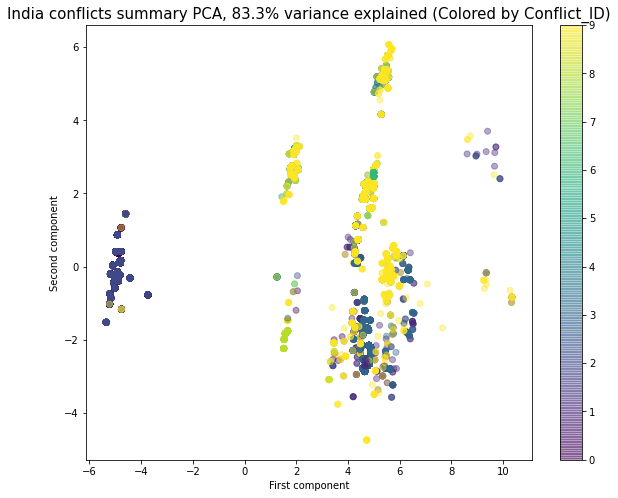

In [307]:
# Plot the first two principle components, color by conflict_id
x = india_pca_x[:, 0]
y = india_pca_x[:, 1]
pc_var = 100 * india_pca.explained_variance_ratio_.cumsum()[1]
plt.subplots(figsize=(10,8))
plt.scatter(x=x, y=y, c=india_noNAN['conflict_id_category'], alpha=0.4)
plt.colorbar()
plt.xlabel('First component')
plt.ylabel('Second component')
plt.title(f'India conflicts summary PCA, {pc_var:.1f}% variance explained (Colored by Conflict_ID)', fontsize=15);

We see:
- the cluster on the far left is made up of almost entirely the 9 conflict_ids with the most incident counts
- idem for the purple cluster in the middle

This is interesting, but still hard to interpret, because so many points are yellow ('Other').

Let's do this again, but looking at specific conflict_id's. We will color the plot above using purple for conflict_id of interest and yellow for 'Other'.

In [308]:
# create categorical column
india_noNAN['conflict_id_category'] = 9
india_noNAN['conflict_id_category'].loc[(india_noNAN['conflict_id'] == 364)] = 0
# india_noNAN['conflict_id_category'].loc[(india_noNAN['conflict_id'] == 227)] = 1
# india_noNAN['conflict_id_category'].loc[(india_noNAN['conflict_id'] == 522)] = 2
# india_noNAN['conflict_id_category'].loc[(india_noNAN['conflict_id'] == 499)] = 3
# india_noNAN['conflict_id_category'].loc[(india_noNAN['conflict_id'] == 365)] = 4
# india_noNAN['conflict_id_category'].loc[(india_noNAN['conflict_id'] == 347)] = 5
# india_noNAN['conflict_id_category'].loc[(india_noNAN['conflict_id'] == 421)] = 6
# india_noNAN['conflict_id_category'].loc[(india_noNAN['conflict_id'] == 218)] = 7
# india_noNAN['conflict_id_category'].loc[(india_noNAN['conflict_id'] == 519)] = 8

/Users/richard/miniconda3/envs/sklearn/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/Users/richard/miniconda3/envs/sklearn/lib/python3.7/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)
/Users/richard/miniconda3/envs/sklearn/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.o

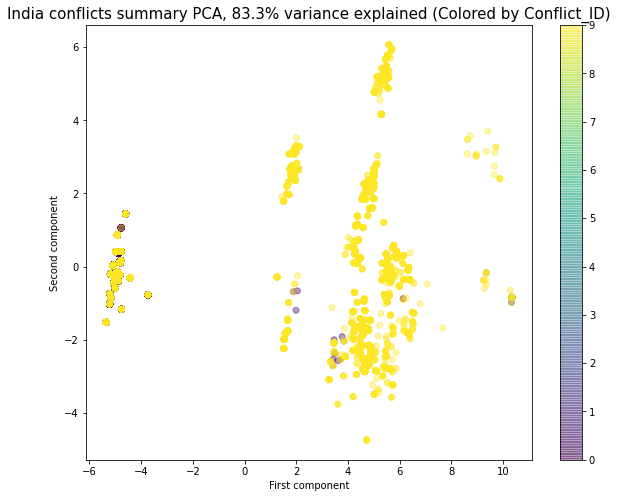

In [309]:
# Plot the first two principle components, color by conflict_id
x = india_pca_x[:, 0]
y = india_pca_x[:, 1]
pc_var = 100 * india_pca.explained_variance_ratio_.cumsum()[1]
plt.subplots(figsize=(10,8))
plt.scatter(x=x, y=y, c=india_noNAN['conflict_id_category'], alpha=0.4)
plt.colorbar()
plt.xlabel('First component')
plt.ylabel('Second component')
plt.title(f'India conflicts summary PCA, {pc_var:.1f}% variance explained (Colored by Conflict_ID)', fontsize=15);

Conflict ID 364 (with the highest incident count) shows up in the left-most and right-most clusters. 

Let's map this to see where the conflicts belong to this ID are located.

In [310]:
# subset india dataframe
india_364 = gdf_india[gdf_india.conflict_id == 364]

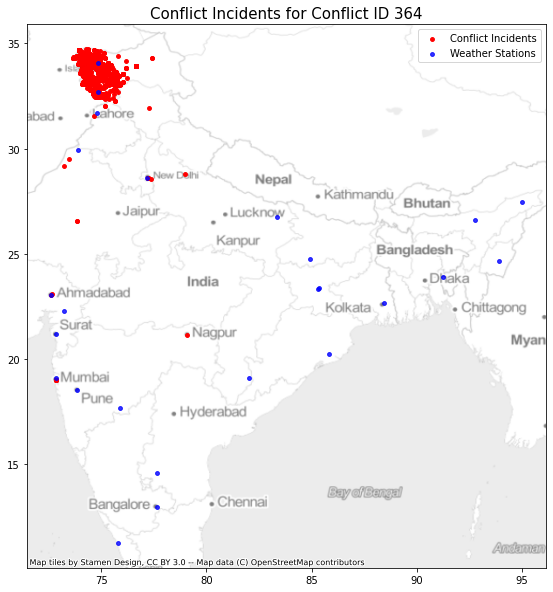

In [311]:
# plot
fig, ax = plt.subplots(figsize=[20,10])

india_364.plot(ax=ax,
               markersize=15,
               color='red',
               label='Conflict Incidents')

gdf_stations_india_alltime.plot(ax=ax,
                                alpha=0.8,
                                markersize=15,
                                color='blue',
                                label='Weather Stations')


plt.title('Conflict Incidents for Conflict ID 364', fontsize=15)
plt.legend()



#add basemap
ctx.add_basemap(
        ax=ax, 
        crs=4326, 
        alpha=0.5, 
        source=ctx.providers.Stamen.TonerLite);

This conflict ID shows a clear geographic concentration in the North of the country, possibly indicating that the first component is stratifying the data along latitude lines.

Let's confirm by looking at some of the other conflict_IDs:

In [312]:
# create categorical column
india_noNAN['conflict_id_category'] = 9
# india_noNAN['conflict_id_category'].loc[(india_noNAN['conflict_id'] == 364)] = 0
india_noNAN['conflict_id_category'].loc[(india_noNAN['conflict_id'] == 227)] = 0
# india_noNAN['conflict_id_category'].loc[(india_noNAN['conflict_id'] == 522)] = 2
# india_noNAN['conflict_id_category'].loc[(india_noNAN['conflict_id'] == 499)] = 3
# india_noNAN['conflict_id_category'].loc[(india_noNAN['conflict_id'] == 365)] = 4
# india_noNAN['conflict_id_category'].loc[(india_noNAN['conflict_id'] == 347)] = 5
# india_noNAN['conflict_id_category'].loc[(india_noNAN['conflict_id'] == 421)] = 6
# india_noNAN['conflict_id_category'].loc[(india_noNAN['conflict_id'] == 218)] = 7
# india_noNAN['conflict_id_category'].loc[(india_noNAN['conflict_id'] == 519)] = 8

/Users/richard/miniconda3/envs/sklearn/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/Users/richard/miniconda3/envs/sklearn/lib/python3.7/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)
/Users/richard/miniconda3/envs/sklearn/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.o

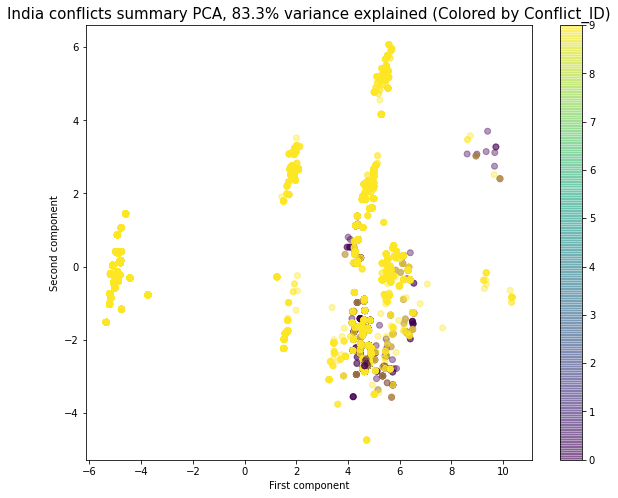

In [313]:
# Plot the first two principle components, color by conflict_id
x = india_pca_x[:, 0]
y = india_pca_x[:, 1]
pc_var = 100 * india_pca.explained_variance_ratio_.cumsum()[1]
plt.subplots(figsize=(10,8))
plt.scatter(x=x, y=y, c=india_noNAN['conflict_id_category'], alpha=0.4)
plt.colorbar()
plt.xlabel('First component')
plt.ylabel('Second component')
plt.title(f'India conflicts summary PCA, {pc_var:.1f}% variance explained (Colored by Conflict_ID)', fontsize=15);

Conflict ID 227 (with the second-highest incident count) shows up in the center-right clusters.

Let's map this to see where the conflicts belong to this ID are located.

In [314]:
# subset india dataframe
india_227 = gdf_india[gdf_india.conflict_id == 227]

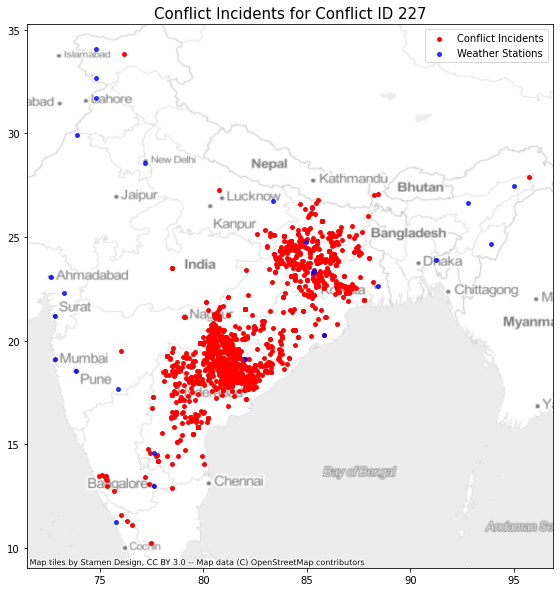

In [315]:
# plot
fig, ax = plt.subplots(figsize=[20,10])

india_227.plot(ax=ax,
               markersize=15,
               color='red',
               label='Conflict Incidents')

gdf_stations_india_alltime.plot(ax=ax,
                                alpha=0.8,
                                markersize=15,
                                color='blue',
                                label='Weather Stations')


plt.title('Conflict Incidents for Conflict ID 227', fontsize=15)
plt.legend()



#add basemap
ctx.add_basemap(
        ax=ax, 
        crs=4326, 
        alpha=0.5, 
        source=ctx.providers.Stamen.TonerLite);

These incidents are located further south than those of Conflict ID364, confirming that the first component is splitting data points according to latitude and longitude.

Let's do one more.

In [316]:
# create categorical column
india_noNAN['conflict_id_category'] = 9
# india_noNAN['conflict_id_category'].loc[(india_noNAN['conflict_id'] == 364)] = 0
# india_noNAN['conflict_id_category'].loc[(india_noNAN['conflict_id'] == 227)] = 1
india_noNAN['conflict_id_category'].loc[(india_noNAN['conflict_id'] == 522)] = 0
# india_noNAN['conflict_id_category'].loc[(india_noNAN['conflict_id'] == 499)] = 3
# india_noNAN['conflict_id_category'].loc[(india_noNAN['conflict_id'] == 365)] = 4
# india_noNAN['conflict_id_category'].loc[(india_noNAN['conflict_id'] == 347)] = 5
# india_noNAN['conflict_id_category'].loc[(india_noNAN['conflict_id'] == 421)] = 6
# india_noNAN['conflict_id_category'].loc[(india_noNAN['conflict_id'] == 218)] = 7
# india_noNAN['conflict_id_category'].loc[(india_noNAN['conflict_id'] == 519)] = 8

/Users/richard/miniconda3/envs/sklearn/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/Users/richard/miniconda3/envs/sklearn/lib/python3.7/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)
/Users/richard/miniconda3/envs/sklearn/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.o

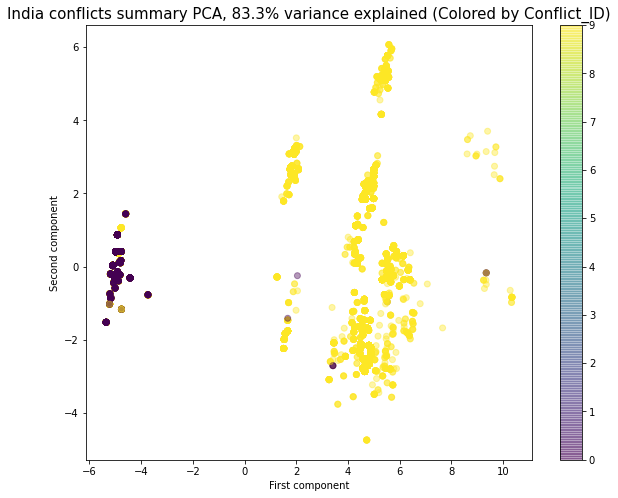

In [317]:
# Plot the first two principle components, color by conflict_id
x = india_pca_x[:, 0]
y = india_pca_x[:, 1]
pc_var = 100 * india_pca.explained_variance_ratio_.cumsum()[1]
plt.subplots(figsize=(10,8))
plt.scatter(x=x, y=y, c=india_noNAN['conflict_id_category'], alpha=0.4)
plt.colorbar()
plt.xlabel('First component')
plt.ylabel('Second component')
plt.title(f'India conflicts summary PCA, {pc_var:.1f}% variance explained (Colored by Conflict_ID)', fontsize=15);

Conflict ID 522 (with the third-highest incident count) shows up in the far-left cluster, and a little in the middle.

Let's map this to see where the conflicts belong to this ID are located.

In [318]:
# subset india dataframe
india_522 = gdf_india[gdf_india.conflict_id == 522]

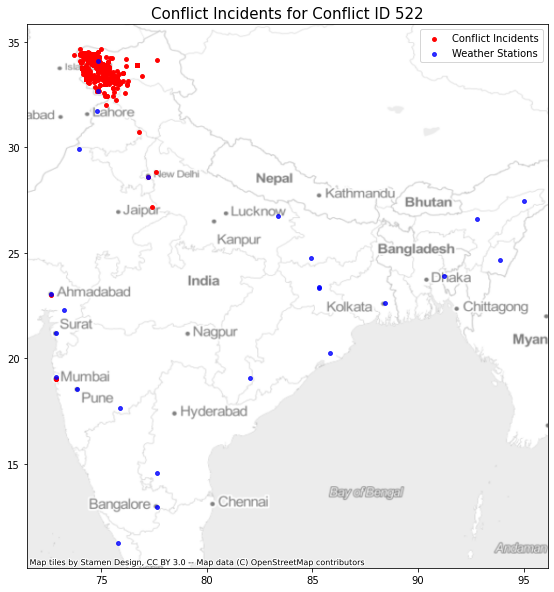

In [319]:
# plot
fig, ax = plt.subplots(figsize=[20,10])

india_522.plot(ax=ax,
               markersize=15,
               color='red',
               label='Conflict Incidents')

gdf_stations_india_alltime.plot(ax=ax,
                                alpha=0.8,
                                markersize=15,
                                color='blue',
                                label='Weather Stations')


plt.title('Conflict Incidents for Conflict ID 522', fontsize=15)
plt.legend()



#add basemap
ctx.add_basemap(
        ax=ax, 
        crs=4326, 
        alpha=0.5, 
        source=ctx.providers.Stamen.TonerLite);

We can confidently confirm that the first PCA component is extracting information about the latitude of the data points. 

It seems like the second component may be related to the longitude as well, as conflicts move east, they seem to move higher up the y-axis.

This is likely because the PCA includes only climactic data and this data varies considerably with latitude and longitude.

### Interpretation
- We have a number of clusters.
- The distinguishable linear clusters seem to be consistent in terms of latitude and longitude. 
- This is confirmed when we color the PCA plot by conflict_id: conflicts in the north show up on the left-hand side of the plot. Conflict in the east show up on the upper side of the plot.
- There is no clear clustering based on total_death counts.

Let's inspect the PCA components to take a closer look at what's happening here.

In [320]:
# turn output of .components method into dataframe for legibility
pd.DataFrame(india_pca.components_, columns=df_pca_columns).iloc[0:5].T

,0,1,2,3,4
PRCP_zone_1973_77,0.141873,0.328088,0.016927,0.196762,-0.043200
PRCP_zone_1983_87,0.135415,0.301139,0.043130,0.232307,-0.148171
PRCP_zone_1993_97,0.162154,0.304844,0.023341,0.152817,-0.003211
PRCP_zone_2003_07,0.195980,0.103578,0.025400,0.075630,-0.012099
PRCP_zone_2015_19,0.195131,-0.004462,0.077321,0.067489,-0.157921
TAVG_zone_1973_77,0.203880,-0.088160,-0.052982,-0.034587,0.006515
TAVG_zone_1983_87,0.204633,-0.080384,-0.047505,-0.022194,-0.018396
TAVG_zone_1993_97,0.205317,-0.060752,-0.050834,-0.026631,-0.002887
TAVG_zone_2003_07,0.205603,-0.050708,-0.057531,-0.025405,0.014012
TAVG_zone_2015_19,0.206463,-0.022791,-0.059198,-0.011142,0.016640


### Interpretation
The first component is pretty evenly distributed across all climate features. Only four features seem to not contribute much:
- TMIN change from 1973 to 2019
- TAVG, TMAX and TMIN change from 1973 to year of conflict

The second component puts significant emphasis on:
- first three PRCP intervals: 1973-77, 1983-87, and 1993-97
- the TAVG and TMIN change between 1973 and 2019
- the TAVG and TMIN change between 1973 and year of conflict

# 8. Evaluating Relationships Between Features

Next, let's investigate correlations of our target feature *total_deaths* with:
- Latitude
- Longitude
- Type of Violence
- Year
- Duration Days
- Climate measures

Let's also investigate the correlation of climate measures with themselves.

## 8.1. Correlation Coefficients
Let's begin by calculating the correlation coefficients for our conflict data, using only the relevant features.

In [350]:
# create subset of dataframe for correlations
india_correlations = india[[
    'year',
    'type_of_violence',
    'latitude',
    'longitude',
    'deaths_a',
    'deaths_b',
    'deaths_civilians',
    'deaths_unknown',
    'total_deaths',
    'duration_days',
    'PRCP_zone_1973_77',
    'PRCP_zone_1983_87',
    'PRCP_zone_1993_97',
    'PRCP_zone_2003_07',
    'PRCP_zone_2015_19',
    'TAVG_zone_1973_77',
    'TAVG_zone_1983_87',
    'TAVG_zone_1993_97',
    'TAVG_zone_2003_07',
    'TAVG_zone_2015_19',
    'TMAX_zone_1973_77',
    'TMAX_zone_1983_87',
    'TMAX_zone_1993_97',
    'TMAX_zone_2003_07',
    'TMAX_zone_2015_19',
    'TMIN_zone_1973_77',
    'TMIN_zone_1983_87',
    'TMIN_zone_1993_97',
    'TMIN_zone_2003_07',
    'TMIN_zone_2015_19',
    'PRCP_zone_sameyear',
    'TAVG_zone_sameyear',
    'TMAX_zone_sameyear',
    'TMIN_zone_sameyear',
    'PRCP_change_1973_2019',
    'TAVG_change_1973_2019',
    'TMAX_change_1973_2019',
    'TMIN_change_1973_2019',
    'PRCP_change_1973_sameyear',
    'TAVG_change_1973_sameyear',
    'TMAX_change_1973_sameyear',
    'TMIN_change_1973_sameyear']]

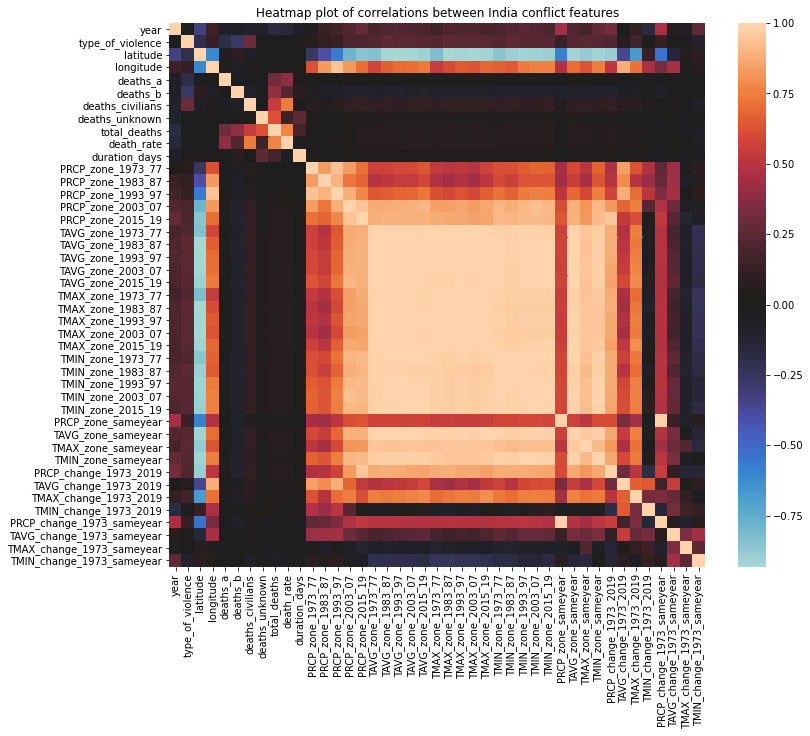

In [365]:
# plot heatmap
plt.subplots(figsize=(12,10))
plt.title('Heatmap plot of correlations between India conflict features')
sns.heatmap(india_correlations.corr(), center=0)

#plt.savefig('/Users/richard/Desktop/springboard_repo/capstones/capstone-two/reports/figures/India_heatmap.png');

It looks like our feature of interest *total_deaths* is barely correlated with any of our other features. That's going to make it hard to predict. 

Let's confirm by looking at actual correlation coefficients.

**NB:** Very clear and important: **almost all of the climate measures are highly correlated.** 

### 8.1.2. Total_deaths Correlations

In [351]:
# get correlation coeffs of total_deaths with all other features
india_correlations.corr()[['total_deaths']]

,total_deaths
year,-0.167049
type_of_violence,0.001393
latitude,-0.033708
longitude,0.005786
deaths_a,0.302829
deaths_b,0.391068
deaths_civilians,0.544920
deaths_unknown,0.618035
total_deaths,1.000000
duration_days,0.183816


### Findings

Our target feature *total_deaths* is:
- correlated with *year*: ~ -0.17
- not correlated with *type_of_violence*
- not correlated with *latitude* or *longitude*
- correlated with *duration_days*: ~0.2
- not significantly correlated with any of the individual climate measures

This is not a whole lot to work with.

**IMPORTANT:** The correlation between *total_deaths* and *duration_days* makes logical sense: death count can be expected to increase as a conflict drags on. To avoid multicollinearity here, let's collapse these two features into one by calculating the *death_rate* (total deaths divided by number of days).

**We will use *death_rate* as our new target feature.**

### 8.1.3. Create Feature: death_rate

Below, we create our new target feature *death_rate* by dividing *total_deaths* by *duration_days*.

In [352]:
india['death_rate'] = india['total_deaths'] / india['duration_days']
india[['death_rate', 'total_deaths', 'duration_days']].head()

,death_rate,total_deaths,duration_days
id,,,
59218,0.000000,0,1
54839,5.555556,50,9
54870,3.000000,3,1
59616,1.000000,1,1
54879,12.000000,12,1


### 8.1.4. Death_rate Correlations

In [353]:
# update india_correlations
india_correlations = india[[
    'year',
    'type_of_violence',
    'latitude',
    'longitude',
    'deaths_a',
    'deaths_b',
    'deaths_civilians',
    'deaths_unknown',
    'total_deaths',
    'death_rate',
    'duration_days',
    'PRCP_zone_1973_77',
    'PRCP_zone_1983_87',
    'PRCP_zone_1993_97',
    'PRCP_zone_2003_07',
    'PRCP_zone_2015_19',
    'TAVG_zone_1973_77',
    'TAVG_zone_1983_87',
    'TAVG_zone_1993_97',
    'TAVG_zone_2003_07',
    'TAVG_zone_2015_19',
    'TMAX_zone_1973_77',
    'TMAX_zone_1983_87',
    'TMAX_zone_1993_97',
    'TMAX_zone_2003_07',
    'TMAX_zone_2015_19',
    'TMIN_zone_1973_77',
    'TMIN_zone_1983_87',
    'TMIN_zone_1993_97',
    'TMIN_zone_2003_07',
    'TMIN_zone_2015_19',
    'PRCP_zone_sameyear',
    'TAVG_zone_sameyear',
    'TMAX_zone_sameyear',
    'TMIN_zone_sameyear',
    'PRCP_change_1973_2019',
    'TAVG_change_1973_2019',
    'TMAX_change_1973_2019',
    'TMIN_change_1973_2019',
    'PRCP_change_1973_sameyear',
    'TAVG_change_1973_sameyear',
    'TMAX_change_1973_sameyear',
    'TMIN_change_1973_sameyear']]

In [354]:
# get correlation coeffs of death_rate with all other features
india_correlations.corr()[['death_rate']]

,death_rate
year,-0.148227
type_of_violence,0.001963
latitude,-0.038222
longitude,0.013694
deaths_a,0.387782
deaths_b,0.216049
deaths_civilians,0.737293
deaths_unknown,0.150758
total_deaths,0.772600
death_rate,1.000000


As expected, this feature is also poorly correlated with the climate features. 

In the next section, we confirm this using scatterplots.

### 8.1.5. Scatterplots of Features against death_rate

Below, we define a function plot scatterplots of death_rate against relevant features:

In [355]:
# define function to create scatterplots of total_deaths against desired columns
def scatterplots_deathrate(columns, ncol=None, figsize=(15, 8)):
    if ncol is None:
        ncol = len(columns)
    nrow = int(np.ceil(len(columns) / ncol))
    fig, axes = plt.subplots(nrow, ncol, figsize=figsize, squeeze=False)
    fig.subplots_adjust(wspace=0.5, hspace=0.6)
    for i, col in enumerate(columns):
        ax = axes.flatten()[i]
        ax.scatter(x = col, y = 'death_rate', data=india_correlations, alpha=0.5)
        ax.set(xlabel=col, ylabel='Death Rate')
    nsubplots = nrow * ncol    
    for empty in range(i+1, nsubplots):
        axes.flatten()[empty].set_visible(False)

In [360]:
# define feature columns
features_deathrate = [ x for x in india_correlations.columns if x not in ['total_deaths', 'deaths_a', 'deaths_b', 'deaths_civilians', 'deaths_unknown', 'death_rate', 'duration_days']]

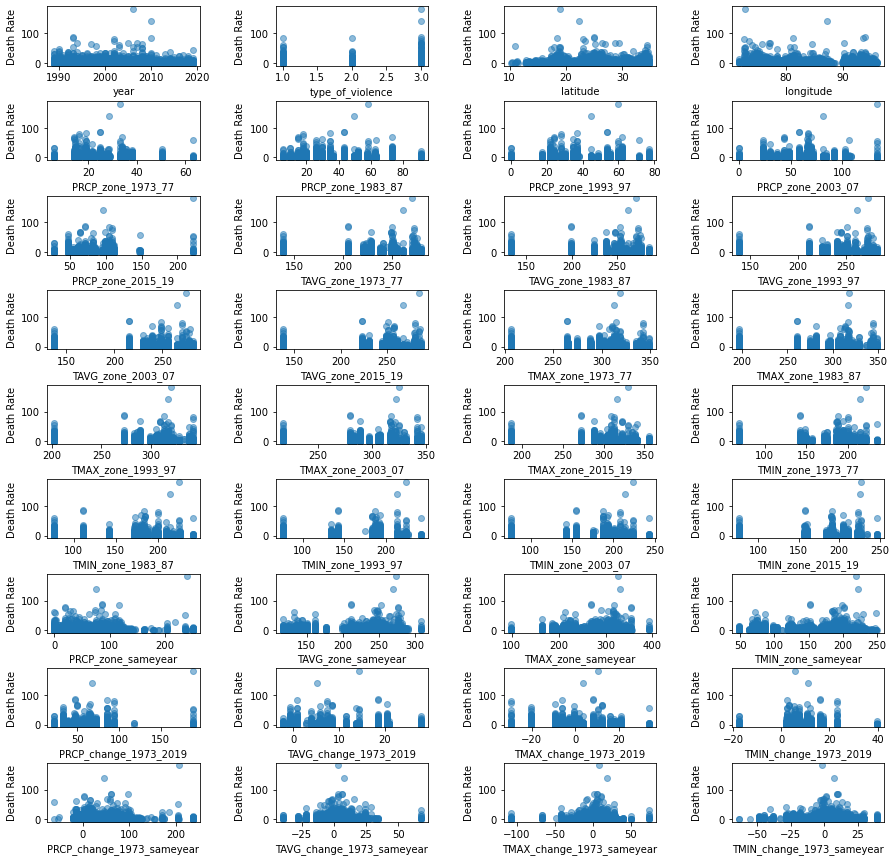

In [362]:
scatterplots_deathrate(features_deathrate, ncol=4, figsize=(15, 15))

### Findings

As expected, there is not much to work with here.

# 9. Final Dataframe

## 9.1 Selecting Target and Predictor Features

Based on the analysis above, then, we will select *death_rate* as our target feature. Our model will predict the death rate based on available weather data from the region around the conflict incident.

Since the PCA revealed that the weather features effectively contain the information encoded in the features *latitude* and *longitude*, we will remove these from our predictor set. Since the weather features are inherently time-based (yearly / 5-year interval means), we will also remove the feature *year*.

This means we will proceed to build a model which will use only climate features to predict the conflict intensity, measured in terms of deaths per day. These climate features are:
- 5-year means for PRCP, TAVG, TMAX, and TMIN for 5 different set intervals: 20 features in total
- yearly mean for PRCP, TAVG, TMAX and TMIN for the year in which the conflict incident occurred: 4 features in total
- change in yearly mean for PRCP, TAVG, TMAX and TMIN between 1973 and the year of the conflict: 4 features in total
- change in yearly mean for PRCP, TAVG, TMAX and TMIN between 1973 and 2019: 4 features in total

This means our final dataframe has 32 predictor features and 1 target feature.

In [363]:
# create final dataframe
india_final = india[[
    'death_rate',
    'PRCP_zone_1973_77',
    'PRCP_zone_1983_87',
    'PRCP_zone_1993_97',
    'PRCP_zone_2003_07',
    'PRCP_zone_2015_19',
    'TAVG_zone_1973_77',
    'TAVG_zone_1983_87',
    'TAVG_zone_1993_97',
    'TAVG_zone_2003_07',
    'TAVG_zone_2015_19',
    'TMAX_zone_1973_77',
    'TMAX_zone_1983_87',
    'TMAX_zone_1993_97',
    'TMAX_zone_2003_07',
    'TMAX_zone_2015_19',
    'TMIN_zone_1973_77',
    'TMIN_zone_1983_87',
    'TMIN_zone_1993_97',
    'TMIN_zone_2003_07',
    'TMIN_zone_2015_19',
    'PRCP_zone_sameyear',
    'TAVG_zone_sameyear',
    'TMAX_zone_sameyear',
    'TMIN_zone_sameyear',
    'PRCP_change_1973_2019',
    'TAVG_change_1973_2019',
    'TMAX_change_1973_2019',
    'TMIN_change_1973_2019',
    'PRCP_change_1973_sameyear',
    'TAVG_change_1973_sameyear',
    'TMAX_change_1973_sameyear',
    'TMIN_change_1973_sameyear']].copy()

In [364]:
# export to local csv
india_final.to_csv('/Users/richard/Desktop/data/processed/df_india_final_for_model.csv')

# 10. Summary & Key Findings

Exploration of the original GHCN climate features revealed:
- All climate data is highly skewed (right-tail); PRCP has >75% 0 values
- On the whole, more precipitation than temperature data available
- For PRCP: taking natural log of PRCP (excluding 0 values) gives us an approximation of a normal distribution
- Overall Precipitation levels recorded at stations near conflict incidents is below global average for 2019
- Overall Temperature levels recorded at stations near conflict incidents is above global average for 2019


Exploration of the original UCDP conflict features revealed:
- Syria, Afghanistan, and India are the countries with the highest number of conflict incidents
- We see a dramatic trend of increasing conflict incidents over the observed period (1989-2019), especially from 2010-2014
- There seem to be seasonal peaks. This could be very interesting to explore further. This is confirmed when we group conflict incidents by Month: the months April to August are above average.
- death count features have some extreme outliers, related to particular (often aggregated) conflict events


Spatial and Temporal analysis of the combined data on a **global** level revealed:
- Overall, coverage of PRCP measures is higher than the Temperature measures
- PRCP coverage increases from 1920-1970, and decreases sharply from 1984-2020
- Temperature coverage increases from 1920-1984, then decreases gradually until 2009, then sharply.
- The period from 2013-2020 has relatively low coverage (i.e. many missing values) compared to the 50 years preceding it.
- Regions are clearly distinguishable that consistently experience extreme temperature and precipitation levels.


We then proceeded to focus our analysis on India as an initial case study. India qualified as the best case study because of the prevalence of *both* conflict data and weather stations.


Initial investigation of data for India revealed:
- 6 clusters of conflict incidents in India
- More than 3800 weather stations
- Finding the nearest station to each incident resulted in a subset if 743 stations
- These 743 stations unforunately did not have enough climate data for the right years
- So instead: we selected the 25 stations that *do* have relevant climate data for relevant years
- We assigned each conflict incident to its closest ‘zone station'
- These 25 stations more or less evenly distributed across the country, with at least one in each conflict cluster
- We calculated 5-year means of 4 climate measures for these stations.


Principal Components Analysis revealed:
- Clustering of climate features according to latitude and longitude
- No clear clustering based on target feature


Investigation of correlations between features revealed:
- Very low correlations between most features and our initial feature of interest: total_deaths
- Correlation between total_deaths and duration_days: create new target feature *death_rate*
- Very low correlations between *death_rate* and climate features


We then constructed our final dataframe with our target feature **death_rate** and predictor features:
- 5-year means for PRCP, TAVG, TMAX, and TMIN for 5 different set intervals: 20 features in total
- yearly mean for PRCP, TAVG, TMAX and TMIN for the year in which the conflict incident occurred: 4 features in total
- change in yearly mean for PRCP, TAVG, TMAX and TMIN between 1973 and the year of the conflict: 4 features in total
- change in yearly mean for PRCP, TAVG, TMAX and TMIN between 1973 and 2019: 4 features in total


Our final dataframe thus has 33 columns: 1 target feature and 32 predictor features.

# 11. Avenues for Future Research

Below we present a number of promising avenues for future research based on the insights generated in this notebook:

- Conflicts have, on the whole, moved North over the past thirty years. Could this be related to increasing temperatures and overall population movements towards more Northern parts of the world?

- There seem to be seasonal peaks in the conflict data. This could be very interesting to explore further. This is confirmed when we group conflict incidents by Month: the months April to August are above average. Do conflicts tend to occur in warmer months?

- There are clearly global regions that consistently experience both extreme temperature and precipitation levels: could these be regions that are experiencing extreme weather in general? 

- For India specifically: it may be worthwhile comparing data from the weather stations near conflict incidents (743) with the rest of the weather stations to see if there are any noticeable differences.